In [14]:
import os
import sys
src_path = os.path.abspath(os.path.join(os.getcwd(), '..', 'src'))
sys.path.append(src_path)
from optimization_logic import *

import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

import warnings
warnings.filterwarnings("ignore")

#Plotting styles
# plt.style.use('ggplot')
plt.rcParams.update(
{"figure.figsize": (12, 5),
#  'font.family': 'serif',
"text.usetex": False,
"axes.titlesize" : 12,
"axes.labelsize" : 10,
# "axes.labelweight" : "bold",
"lines.linewidth": 1,
"lines.markersize" : 5,
"legend.fontsize": 8,
"legend.title_fontsize" : 9,
"xtick.labelsize" : 8,
"ytick.labelsize" : 8})


# Parameters

In [15]:
"""
SIZE: maximal power content of the battery. Units have to be chosen here and be consistent with other power/energy related attributes
POWER_UP: maximal power for discharging; units are analogous to units as size (e.g. kW -> kWh, MW -> MWh)
POWER_DOWN: maximal power for charging; units are analogous to units as size (e.g. kW -> kWh, MW -> MWh)
CHARGE_EFFICIENCY: efficiency factor to compute SoC change when charging the asset, fraction between [0,1]
DISCHARGE_EFFICIENCY: efficiency factor to compute SoC change when discharging the asset, fraction between [0,1]

INIT_SOC: initial energy content of the battery at the start of simulation period (in energy units). (default = None -> size/2 = 50%)
END_SOC: energy content of the battery at end of each day (in energy units). (default = None -> no such constraint)
# the energy content at the start of each day (after the very first day) is taken as the end_SOC for previous day

end_soc_limit_type: the kind of contraint applied for end of day SOC. Chose between ['equal_to', 'greater_than_or_equal_to', 'less_than_or_equal_to']. 
                    Applied only when END_SOC != None

MANUAL_SOC_MIN = minimum allowed SOC
MANUAL_SOC_MAX = maximum allowed SOC

MAX_THROUGHPUT_CYCLES: maximum throughput/discharge cycles allowed in 1 day
THROUGHPUT_SIZE: throughput size (MWh) upon which a 'cycle' is defined, daily discharge throughput <= MAX_THROUGHPUT_CYCLES * THROUGHPUT_SIZE MWh
TSTEP: fraction of an hour (1/N), where N denotes the frequency of settlements made per hour

SOLUTION_TIME_LIMIT_SEC = max time allowed for the optimization algo to find a solution (in sec.)
INTEGER_PN = True if the setpoints (MW) can only be integer values, else False

assume_perfect_foresight = True if perfect foresight on DA prices is to be assumed, otherwise False
                           When False, the optimization will be done on DA forecast, and settlement on actuals
"""

###############################
#       BESS specifics        #
###############################

SIZE = 100               # MWh - default 56.4
POWER_UP = 50            # MW - default 49, 
POWER_DOWN  = 50         # MW - default 49

RTE = 0.88                                # round trip efficiency
CHARGE_EFFICIENCY = np.sqrt(RTE)          #default = sqrt(RTE)
DISCHARGE_EFFICIENCY = np.sqrt(RTE)       #default = sqrt(RTE)

MAX_THROUGHPUT_CYCLES = 2                 # count - default 2.3
THROUGHPUT_SIZE = SIZE                    # MWh
TSTEP = 1                                 # default = 1 for hourly DA market

###############################
#      script technicals      #
###############################

SOLUTION_TIME_LIMIT_SEC = 30  # default 30
INTEGER_PN = False            # default True

###############################
#      DA scpecifics          #
###############################

MANUAL_SOC_MIN = 0           # MWh 
MANUAL_SOC_MAX = SIZE         # MWh

INIT_SOC = 0        # MWh, default = size/2 
END_SOC = 0         # MWh, default = None
end_soc_limit_type = 'equal_to'

###############################
#    Simulation specifics     #
###############################

assume_perfect_foresight = True

###############################
#           Plotting          #
###############################

show_daily_plots = True

###############################
#           Logging           #
###############################

save_setpoint_log = False
save_daily_log = False
save_path = '/simulation_logs/'
save_name_prefix = f'martina_{SIZE}mwh_{POWER_DOWN}mw'


settlement_freq = {0.25: "15min", 0.5: "30min", 1: "H"}


In [4]:
os.getcwd()

'/Users/abhiramarora/Desktop/be afrr ems v4 2025/yuso.quant.py3/YusoQuant/batteries/BESS algos/Martina_ref_day_da_lp'

# Data

In [110]:
data_files_path = os.getcwd()+'/'
file_name = '../src/data/processed/gb_epex_da_actuals.csv'
main_data = pd.read_csv(data_files_path+'/'+file_name)

In [111]:
ref_day_data = pd.read_csv('../src/data/processed/reference_days_euclidean_table.csv')
ref_day_data.tail()

,date,closest_reference_days,distance
86,2024-10-26,"[Timestamp('2024-09-08 00:00:00'), Timestamp('...",0.000785
87,2024-10-27,"[Timestamp('2024-09-09 00:00:00'), Timestamp('...",0.001907
88,2024-10-28,"[Timestamp('2024-10-16 00:00:00'), Timestamp('...",0.005749
89,2024-10-29,"[Timestamp('2024-09-23 00:00:00'), Timestamp('...",0.001769
90,2024-10-30,"[Timestamp('2024-10-29 00:00:00'), Timestamp('...",0.001458


In [27]:
import re

In [112]:
ref_day_data = pd.read_csv('../src/data/processed/reference_days_euclidean_table.csv')

# Print the DataFrame info for debugging
print("Before processing:")
ref_day_data.info()

# Convert 'date' column to datetime
ref_day_data['date'] = pd.to_datetime(ref_day_data['date']).dt.date

# Function to extract the first date from 'closest_reference_days'
def extract_first_date(row):
    try:
        # Use regex to extract all date strings from the row
        date_matches = re.findall(r"Timestamp\('([^']+)'\)", row)
        # Return the first date if available
        return pd.to_datetime(date_matches[0]).date() if len(date_matches) > 0 else None
    except Exception as e:
        print(f"Error parsing row: {row}, Error: {e}")
        return None

# Apply the function to extract the first closest reference day
ref_day_data['closest_reference_day'] = ref_day_data['closest_reference_days'].apply(extract_first_date)

# Drop or keep additional columns as needed (e.g., 'distance')
ref_day_data = ref_day_data[['date', 'closest_reference_day', 'distance']]

# Print the DataFrame info after processing
print("After processing:")
ref_day_data.info()

# Display the first few rows of the final table
ref_day_data.head()

Before processing:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 3 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date                    91 non-null     object 
 1   closest_reference_days  91 non-null     object 
 2   distance                91 non-null     float64
dtypes: float64(1), object(2)
memory usage: 2.3+ KB
After processing:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   date                   91 non-null     object 
 1   closest_reference_day  91 non-null     object 
 2   distance               91 non-null     float64
dtypes: float64(1), object(2)
memory usage: 2.3+ KB


,date,closest_reference_day,distance
0,2024-08-01,2024-06-25,0.000318
1,2024-08-02,2024-06-21,0.002781
2,2024-08-03,2024-07-18,0.001405
3,2024-08-04,2024-06-14,0.003667
4,2024-08-05,2024-07-10,0.002323


In [113]:
main_data.head()

,dtutc,da_price,dtcet,date
0,2023-12-31 23:00:00+00:00,53.2,2024-01-01 00:00:00+01:00,2024-01-01
1,2024-01-01 00:00:00+00:00,50.0,2024-01-01 01:00:00+01:00,2024-01-01
2,2024-01-01 01:00:00+00:00,47.0,2024-01-01 02:00:00+01:00,2024-01-01
3,2024-01-01 02:00:00+00:00,33.0,2024-01-01 03:00:00+01:00,2024-01-01
4,2024-01-01 03:00:00+00:00,25.8,2024-01-01 04:00:00+01:00,2024-01-01


In [114]:
da_data = main_data[["dtutc", "da_price"]].copy()
da_data["dtutc"] = pd.to_datetime(da_data.dtutc, utc=True)


In [115]:
# here we resample the dataset to the frequency of DAM, as specified in param 'TSTEP' above
da_data = da_data.resample(settlement_freq[TSTEP], on = "dtutc", origin="start").mean()
da_data

,da_price
dtutc,
2023-12-31 23:00:00+00:00,53.20
2024-01-01 00:00:00+00:00,50.00
2024-01-01 01:00:00+00:00,47.00
2024-01-01 02:00:00+00:00,33.00
2024-01-01 03:00:00+00:00,25.80
...,...
2024-12-31 18:00:00+00:00,86.00
2024-12-31 19:00:00+00:00,52.05
2024-12-31 20:00:00+00:00,36.00


<Axes: xlabel='dtutc'>

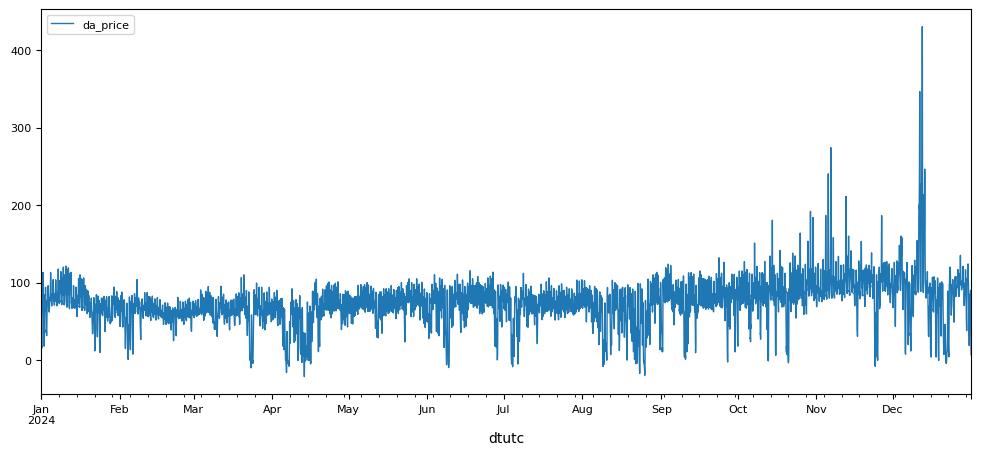

In [116]:
da_data.plot()

In [117]:
# here we add a 'date' column
da_data.reset_index(inplace=True)
da_data["dtcet"] = da_data.dtutc.dt.tz_convert("Europe/Brussels")
da_data["date"] = da_data.dtcet.dt.date


In [118]:
# handling nans:
da_data[da_data.da_price.isna()]


,dtutc,da_price,dtcet,date


In [119]:
da_data.head()

,dtutc,da_price,dtcet,date
0,2023-12-31 23:00:00+00:00,53.2,2024-01-01 00:00:00+01:00,2024-01-01
1,2024-01-01 00:00:00+00:00,50.0,2024-01-01 01:00:00+01:00,2024-01-01
2,2024-01-01 01:00:00+00:00,47.0,2024-01-01 02:00:00+01:00,2024-01-01
3,2024-01-01 02:00:00+00:00,33.0,2024-01-01 03:00:00+01:00,2024-01-01
4,2024-01-01 03:00:00+00:00,25.8,2024-01-01 04:00:00+01:00,2024-01-01


In [120]:
da_data.tail()

,dtutc,da_price,dtcet,date
8779,2024-12-31 18:00:00+00:00,86.00,2024-12-31 19:00:00+01:00,2024-12-31
8780,2024-12-31 19:00:00+00:00,52.05,2024-12-31 20:00:00+01:00,2024-12-31
8781,2024-12-31 20:00:00+00:00,36.00,2024-12-31 21:00:00+01:00,2024-12-31
8782,2024-12-31 21:00:00+00:00,19.90,2024-12-31 22:00:00+01:00,2024-12-31
8783,2024-12-31 22:00:00+00:00,7.00,2024-12-31 23:00:00+01:00,2024-12-31


# Simulations

# Simulation with perfect foresight

- scheduling will be done on the actual prices for each dilivery day
- settlement will be done on the actual prices for each dilivery day

In [121]:
dates = ref_day_data.date.unique()
dates

array([datetime.date(2024, 8, 1), datetime.date(2024, 8, 2),
       datetime.date(2024, 8, 3), datetime.date(2024, 8, 4),
       datetime.date(2024, 8, 5), datetime.date(2024, 8, 6),
       datetime.date(2024, 8, 7), datetime.date(2024, 8, 8),
       datetime.date(2024, 8, 9), datetime.date(2024, 8, 10),
       datetime.date(2024, 8, 11), datetime.date(2024, 8, 12),
       datetime.date(2024, 8, 13), datetime.date(2024, 8, 14),
       datetime.date(2024, 8, 15), datetime.date(2024, 8, 16),
       datetime.date(2024, 8, 17), datetime.date(2024, 8, 18),
       datetime.date(2024, 8, 19), datetime.date(2024, 8, 20),
       datetime.date(2024, 8, 21), datetime.date(2024, 8, 22),
       datetime.date(2024, 8, 23), datetime.date(2024, 8, 24),
       datetime.date(2024, 8, 25), datetime.date(2024, 8, 26),
       datetime.date(2024, 8, 27), datetime.date(2024, 8, 28),
       datetime.date(2024, 8, 29), datetime.date(2024, 8, 30),
       datetime.date(2024, 8, 31), datetime.date(2024, 9, 1),
  

In [122]:
# initiate class object, once at the start of the simulation

# initiate class object
bess_object_dam = day_ahead(
    size=SIZE,
    power_up=POWER_UP,
    power_down=POWER_DOWN,
    timestep=1,
    charge_eff=CHARGE_EFFICIENCY,
    discharge_eff=DISCHARGE_EFFICIENCY,
    manual_soc_max=MANUAL_SOC_MAX,
    manual_soc_min=MANUAL_SOC_MIN,
    init_soc=INIT_SOC,
    end_soc=END_SOC,
    end_soc_limit_type=end_soc_limit_type,
    daily_cycle_max=MAX_THROUGHPUT_CYCLES,
    throughput_size=THROUGHPUT_SIZE,
    solution_time_limit=SOLUTION_TIME_LIMIT_SEC,
    integer_solution=INTEGER_PN,
)

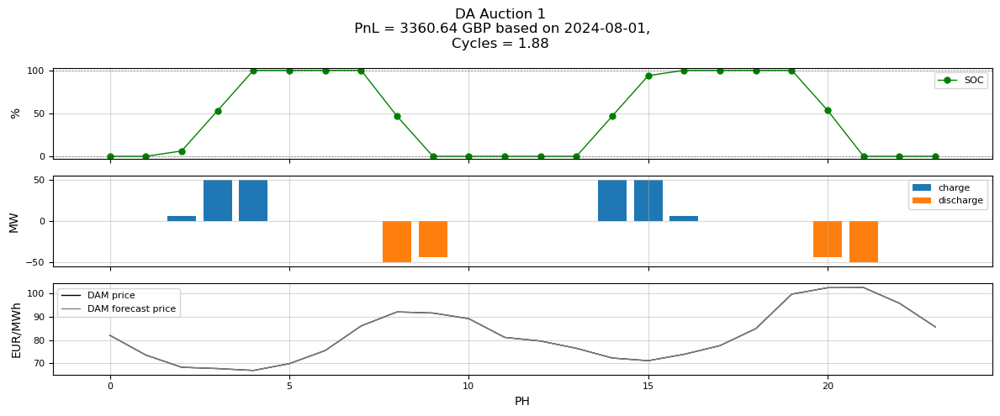

     del_date ref_date   pnl_da
0  2024-08-01     None  3360.64


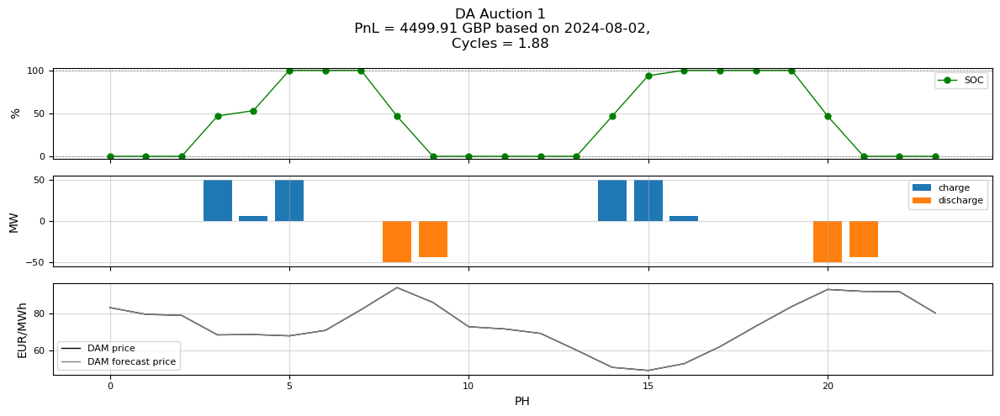

     del_date ref_date   pnl_da
1  2024-08-02     None  4499.91


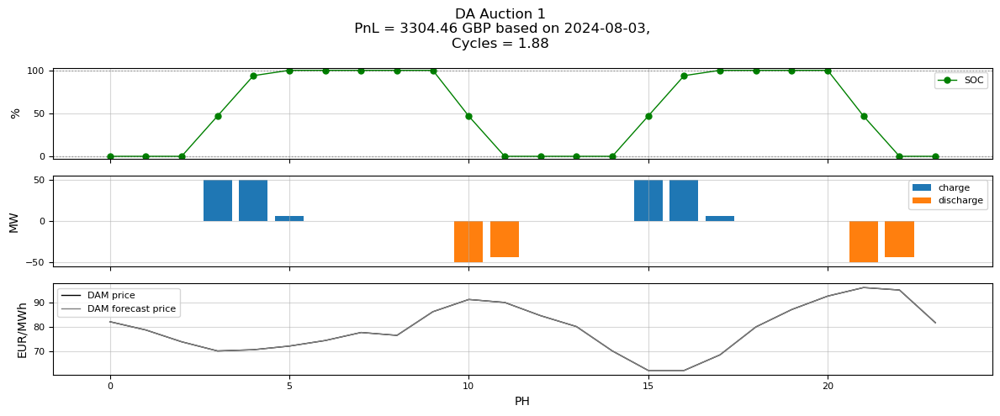

     del_date ref_date   pnl_da
2  2024-08-03     None  3304.46


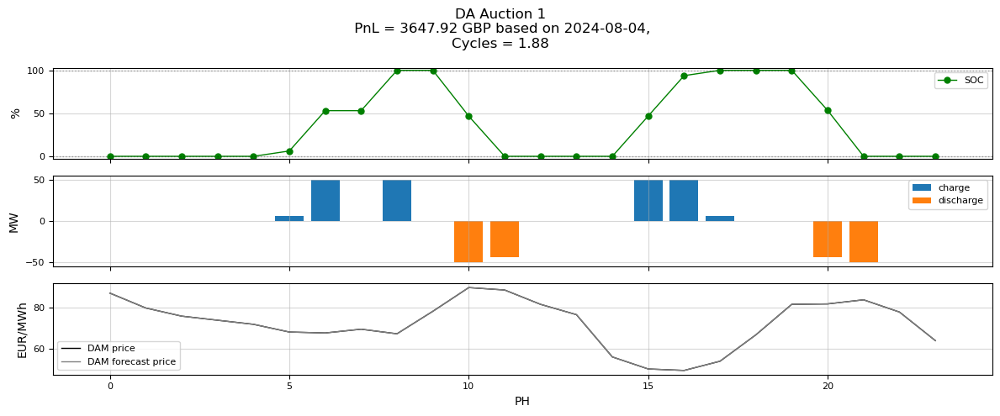

     del_date ref_date   pnl_da
3  2024-08-04     None  3647.92


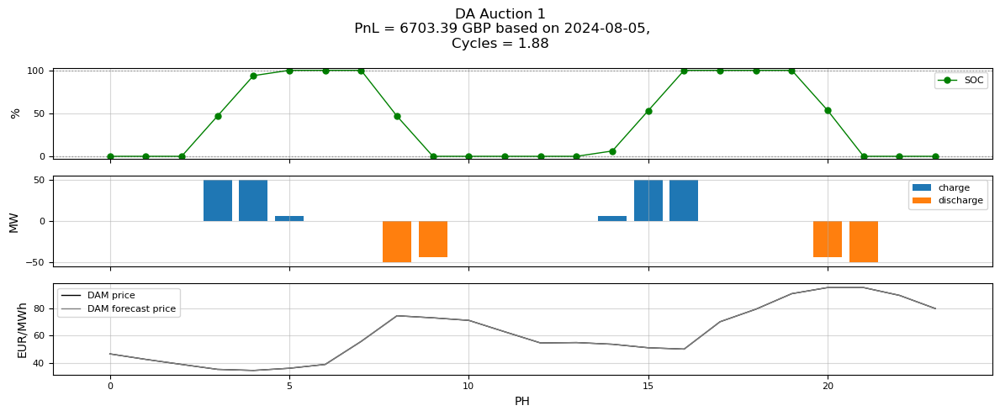

     del_date ref_date   pnl_da
4  2024-08-05     None  6703.39


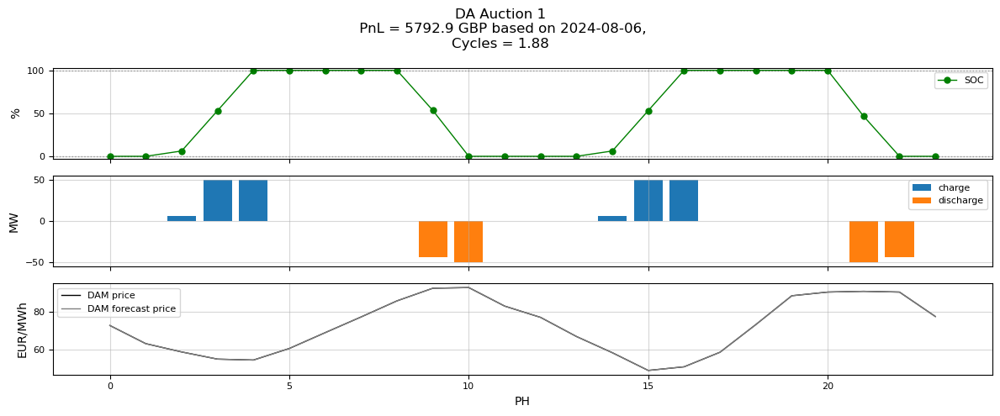

     del_date ref_date  pnl_da
5  2024-08-06     None  5792.9


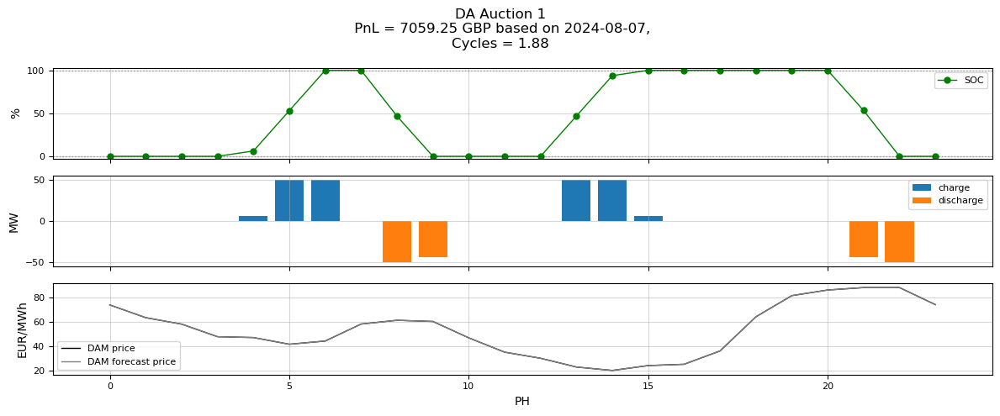

     del_date ref_date   pnl_da
6  2024-08-07     None  7059.25


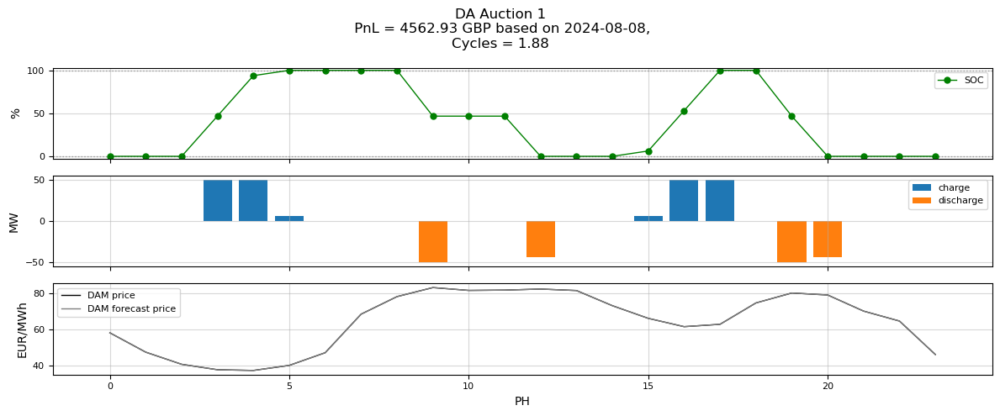

     del_date ref_date   pnl_da
7  2024-08-08     None  4562.93


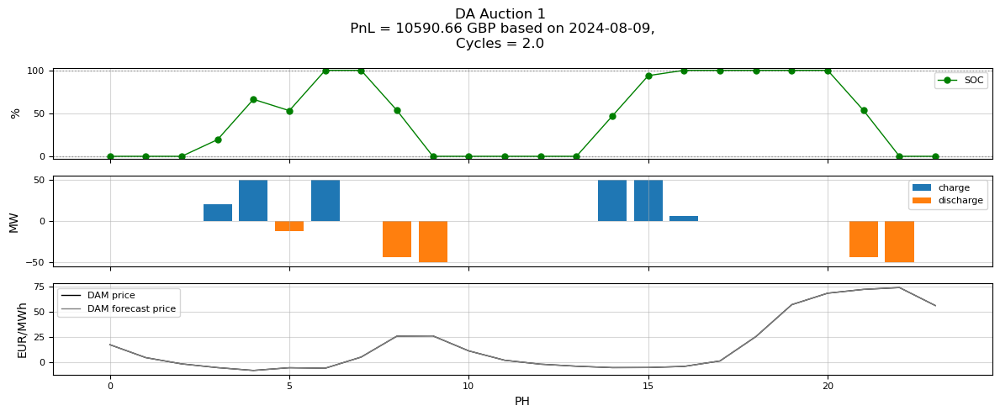

     del_date ref_date    pnl_da
8  2024-08-09     None  10590.66


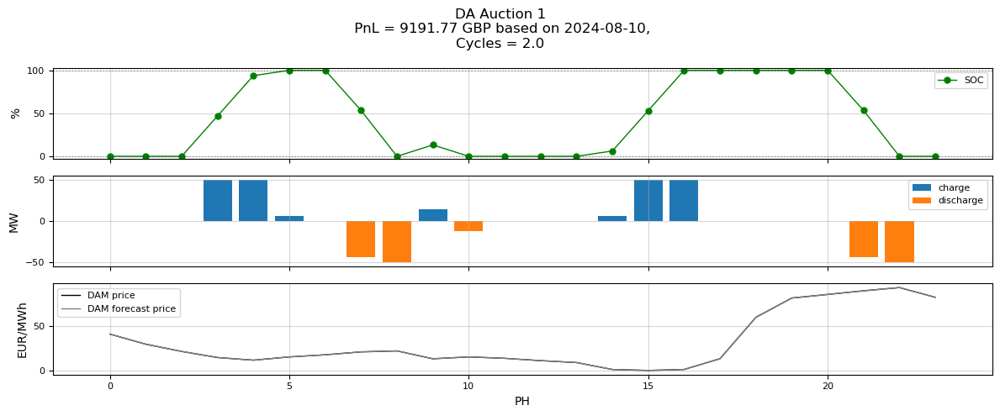

     del_date ref_date   pnl_da
9  2024-08-10     None  9191.77


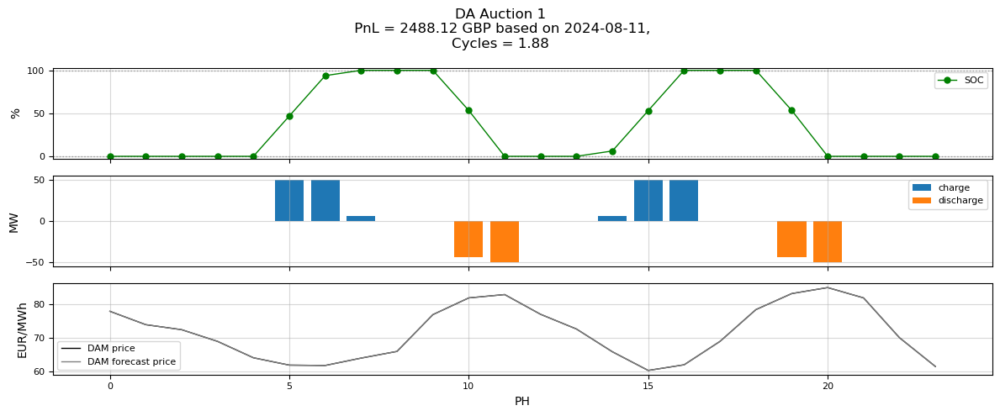

      del_date ref_date   pnl_da
10  2024-08-11     None  2488.12


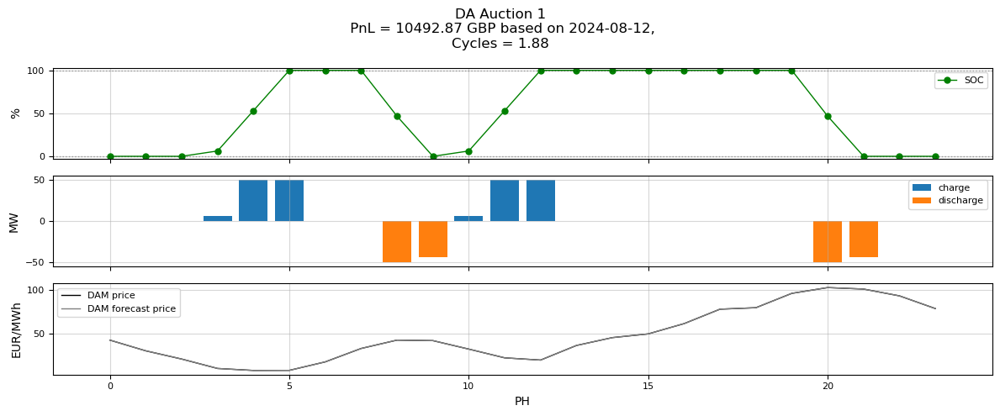

      del_date ref_date    pnl_da
11  2024-08-12     None  10492.87


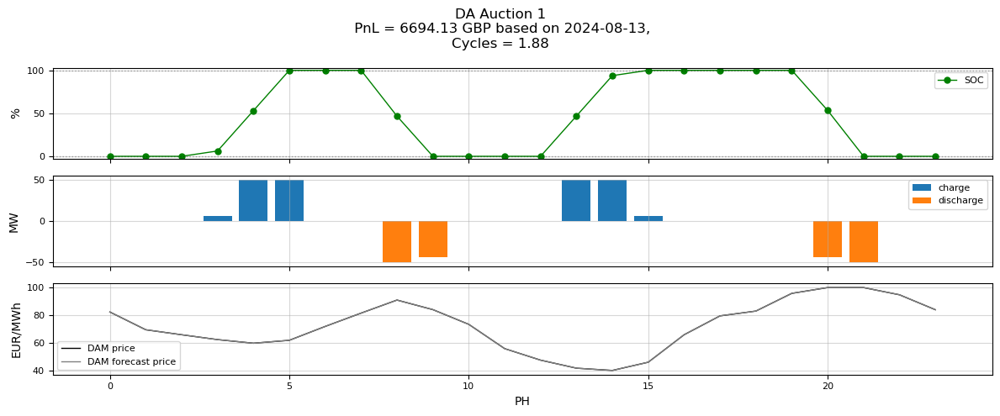

      del_date ref_date   pnl_da
12  2024-08-13     None  6694.13


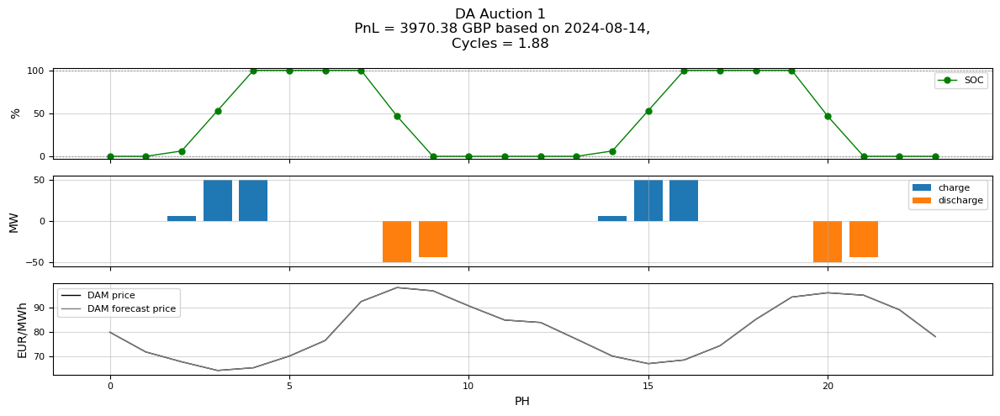

      del_date ref_date   pnl_da
13  2024-08-14     None  3970.38


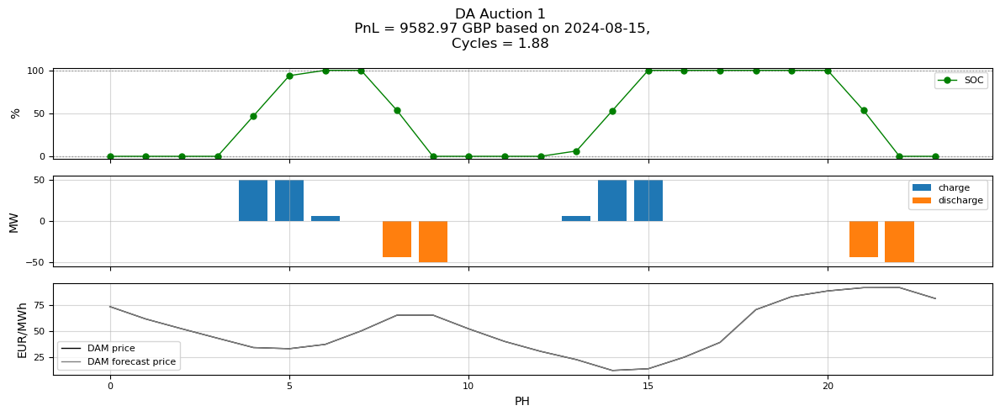

      del_date ref_date   pnl_da
14  2024-08-15     None  9582.97


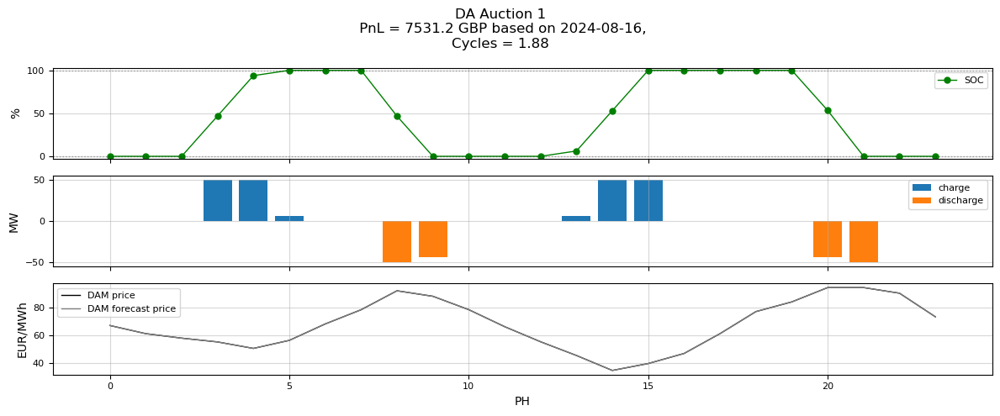

      del_date ref_date  pnl_da
15  2024-08-16     None  7531.2


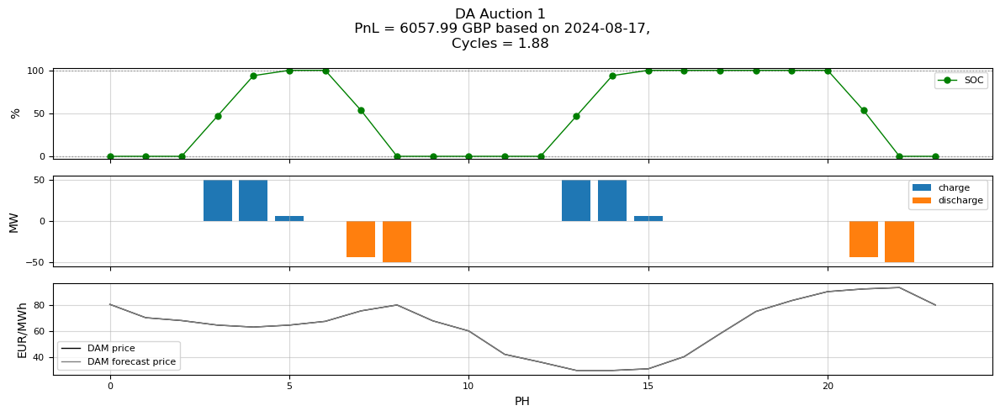

      del_date ref_date   pnl_da
16  2024-08-17     None  6057.99


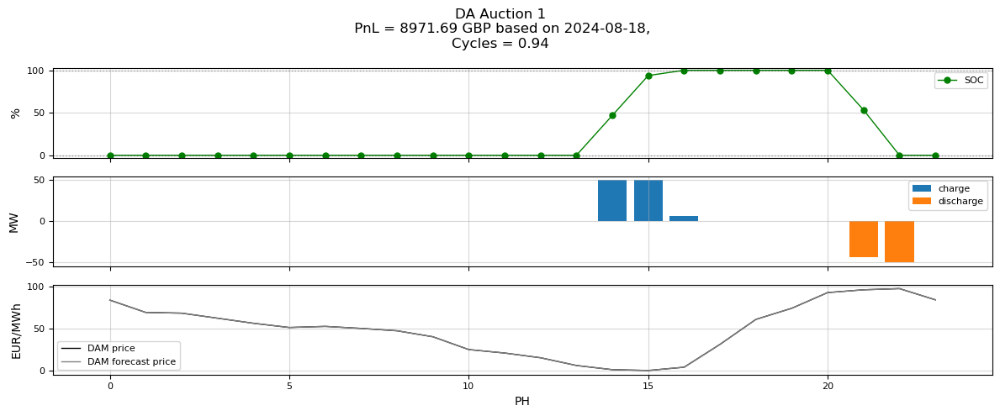

      del_date ref_date   pnl_da
17  2024-08-18     None  8971.69


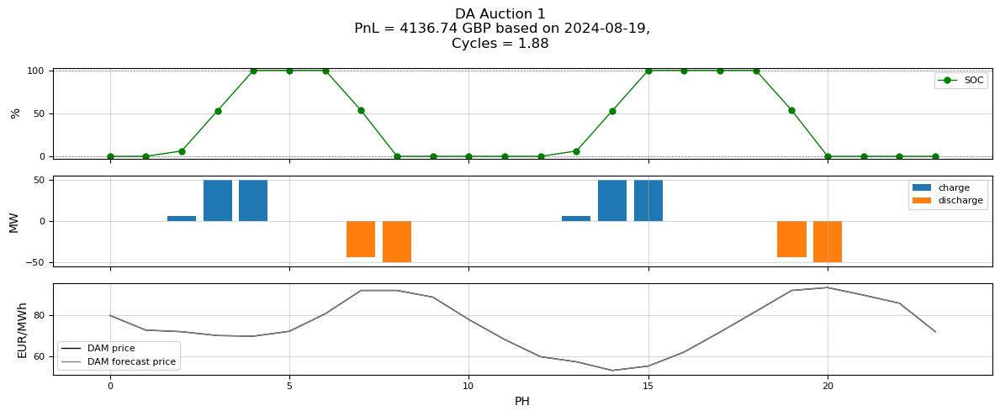

      del_date ref_date   pnl_da
18  2024-08-19     None  4136.74


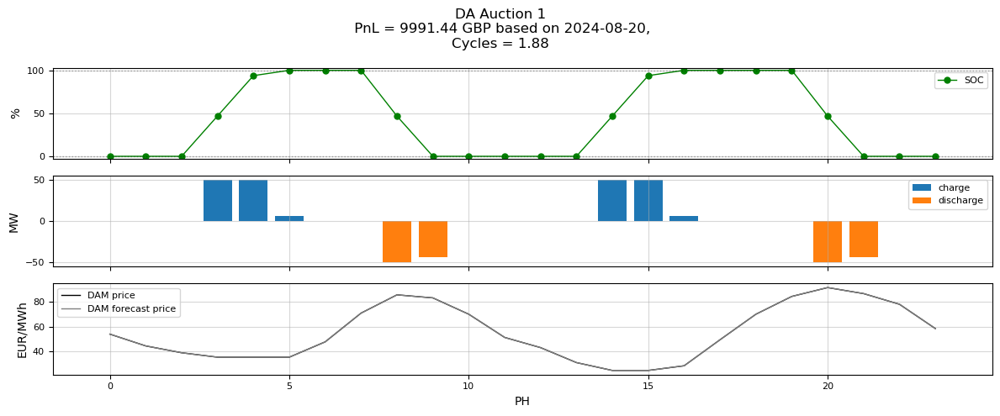

      del_date ref_date   pnl_da
19  2024-08-20     None  9991.44


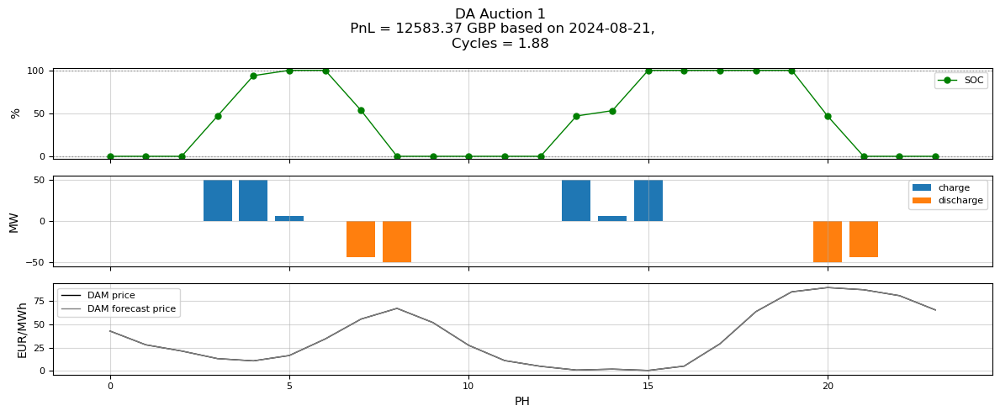

      del_date ref_date    pnl_da
20  2024-08-21     None  12583.37


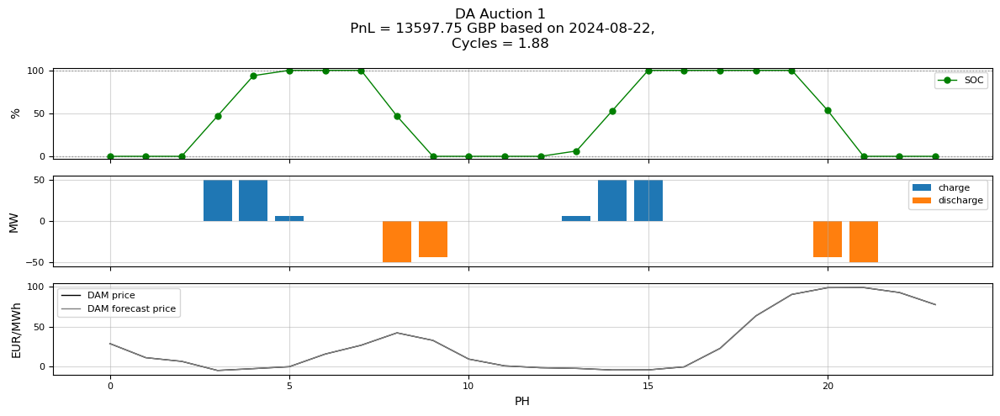

      del_date ref_date    pnl_da
21  2024-08-22     None  13597.75


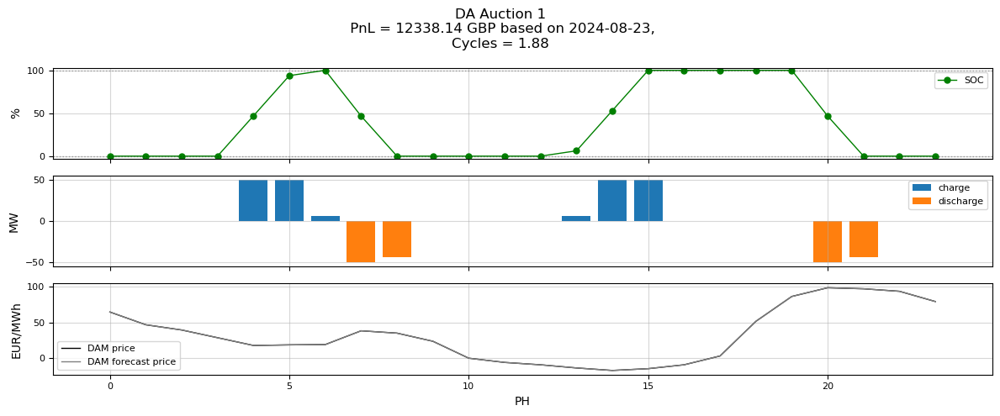

      del_date ref_date    pnl_da
22  2024-08-23     None  12338.14


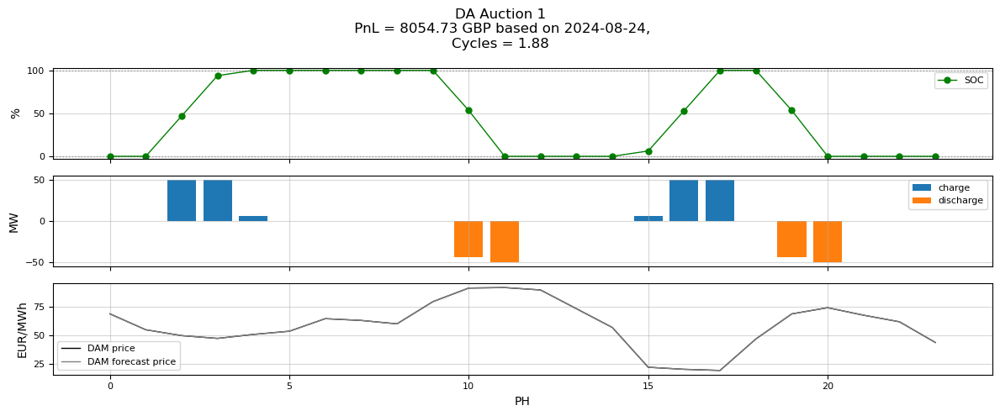

      del_date ref_date   pnl_da
23  2024-08-24     None  8054.73


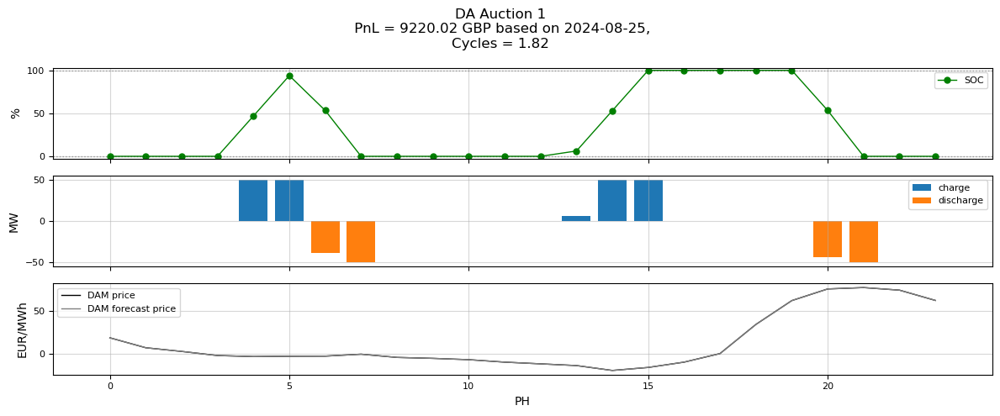

      del_date ref_date   pnl_da
24  2024-08-25     None  9220.02


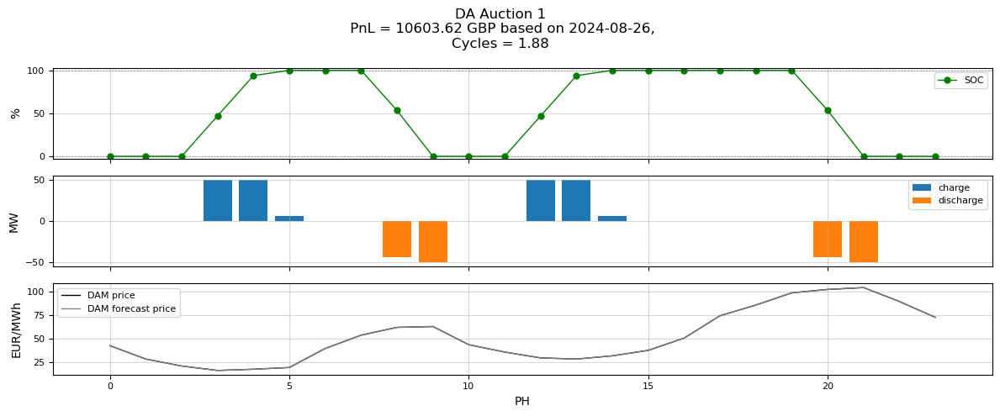

      del_date ref_date    pnl_da
25  2024-08-26     None  10603.62


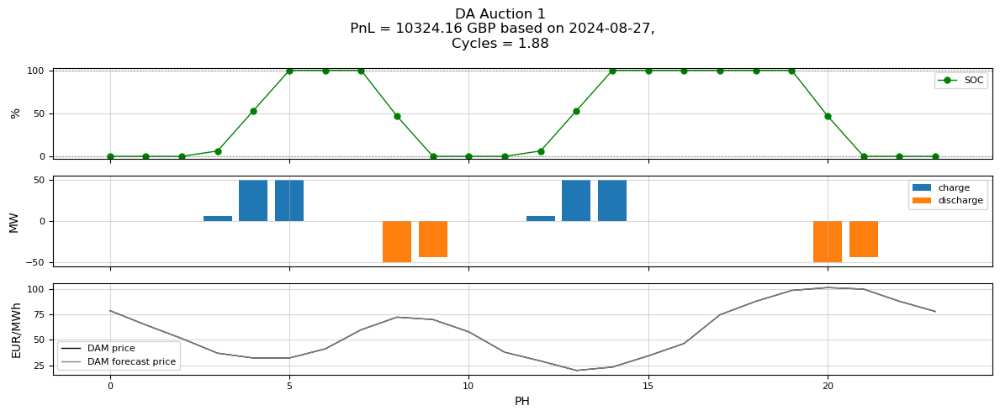

      del_date ref_date    pnl_da
26  2024-08-27     None  10324.16


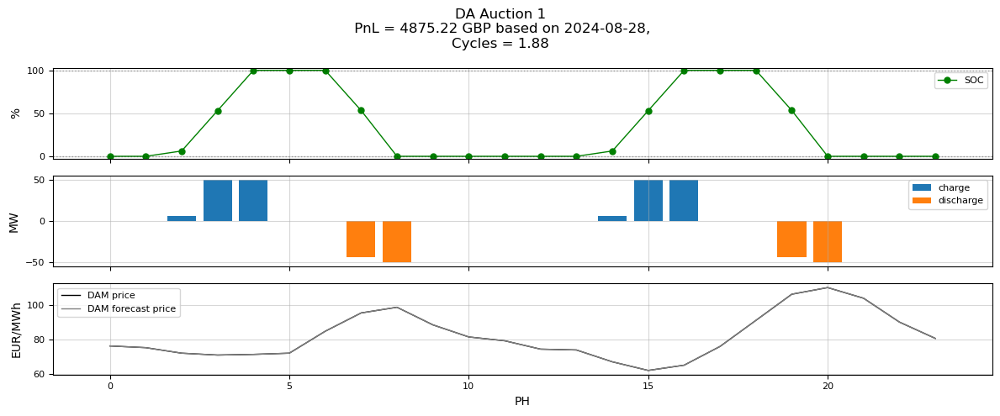

      del_date ref_date   pnl_da
27  2024-08-28     None  4875.22


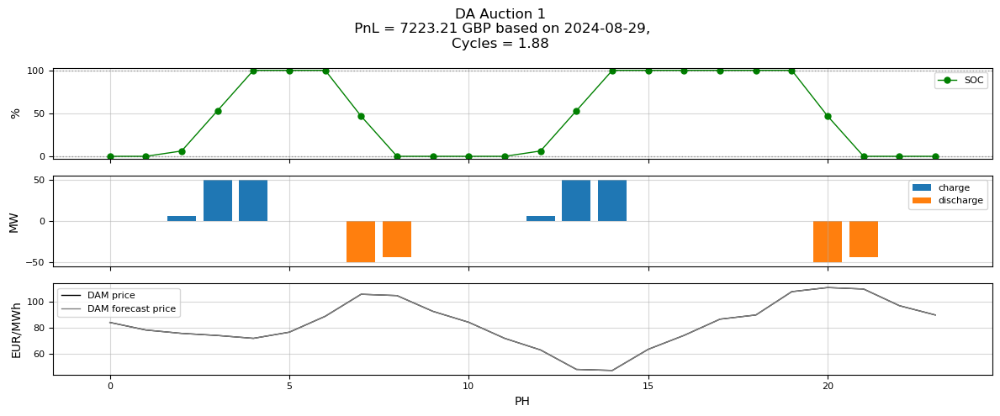

      del_date ref_date   pnl_da
28  2024-08-29     None  7223.21


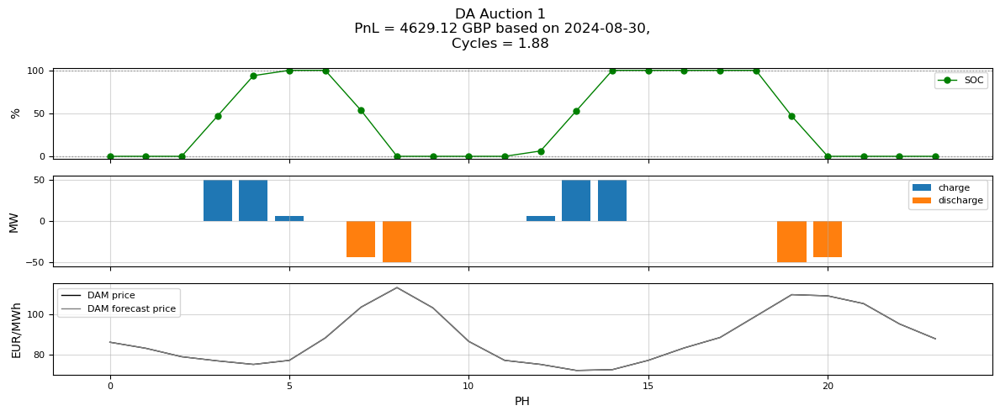

      del_date ref_date   pnl_da
29  2024-08-30     None  4629.12


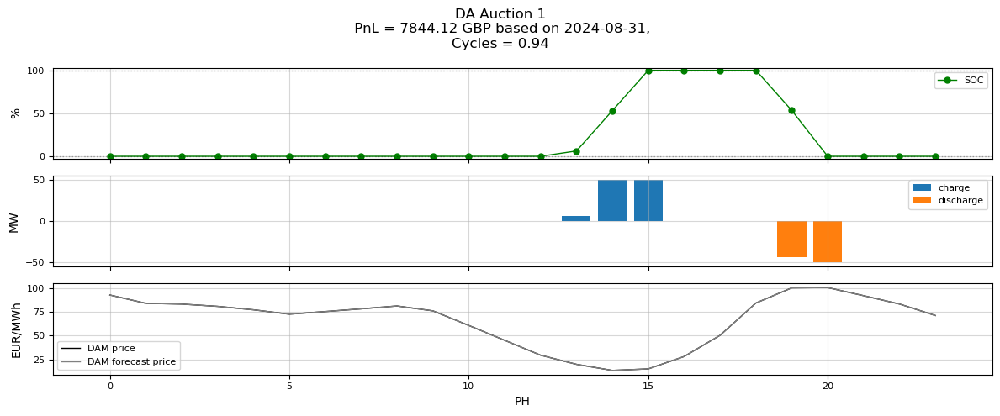

      del_date ref_date   pnl_da
30  2024-08-31     None  7844.12


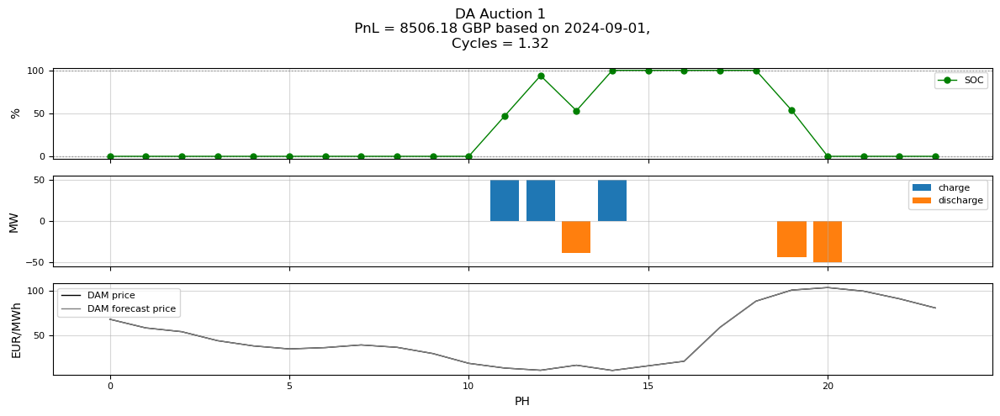

      del_date ref_date   pnl_da
31  2024-09-01     None  8506.18


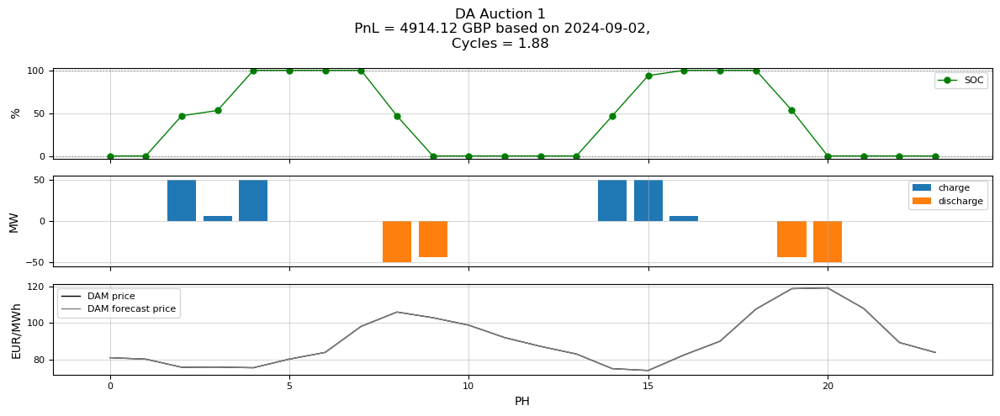

      del_date ref_date   pnl_da
32  2024-09-02     None  4914.12


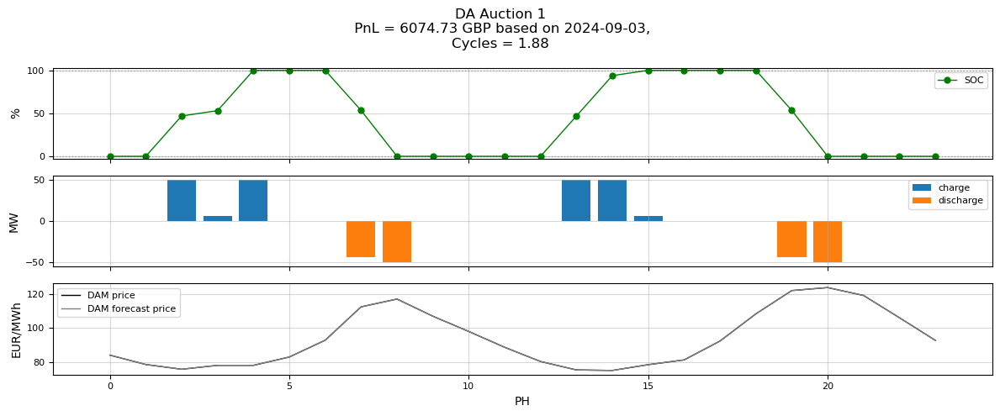

      del_date ref_date   pnl_da
33  2024-09-03     None  6074.73


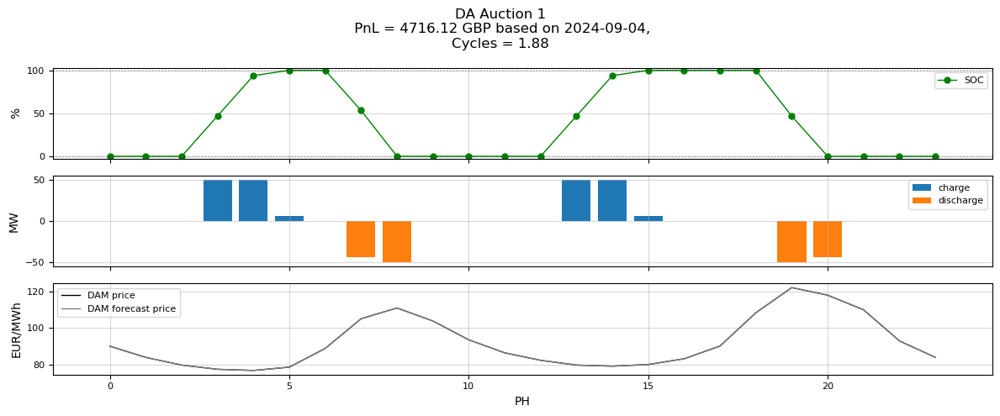

      del_date ref_date   pnl_da
34  2024-09-04     None  4716.12


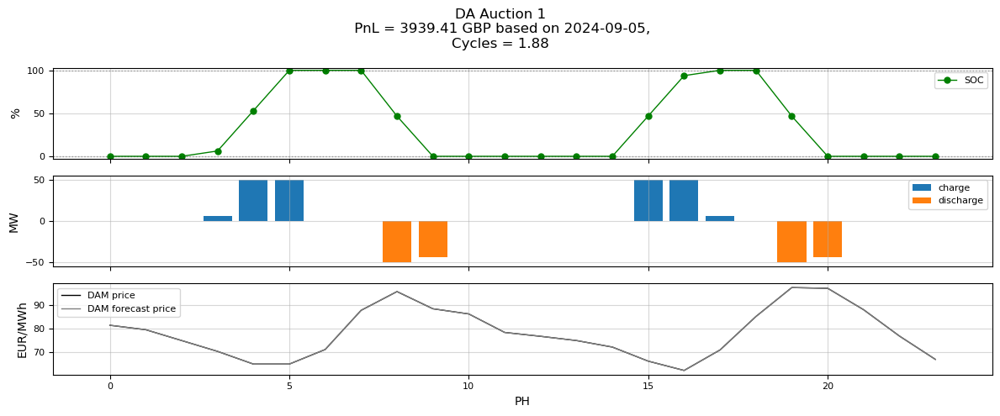

      del_date ref_date   pnl_da
35  2024-09-05     None  3939.41


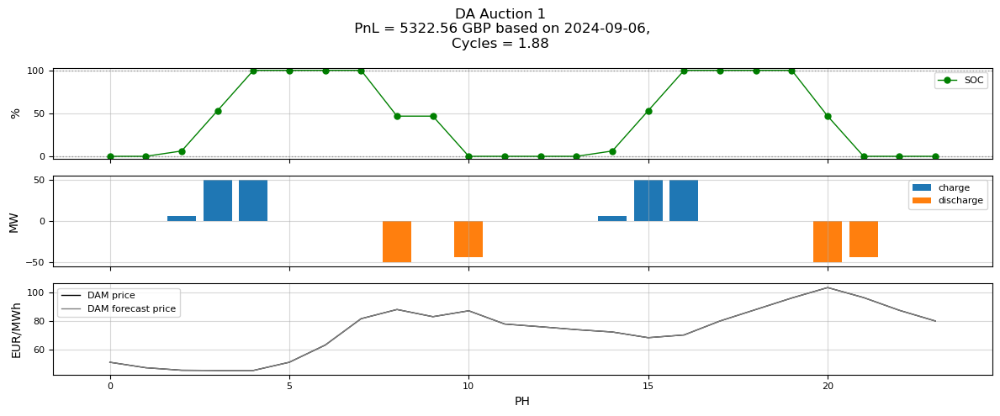

      del_date ref_date   pnl_da
36  2024-09-06     None  5322.56


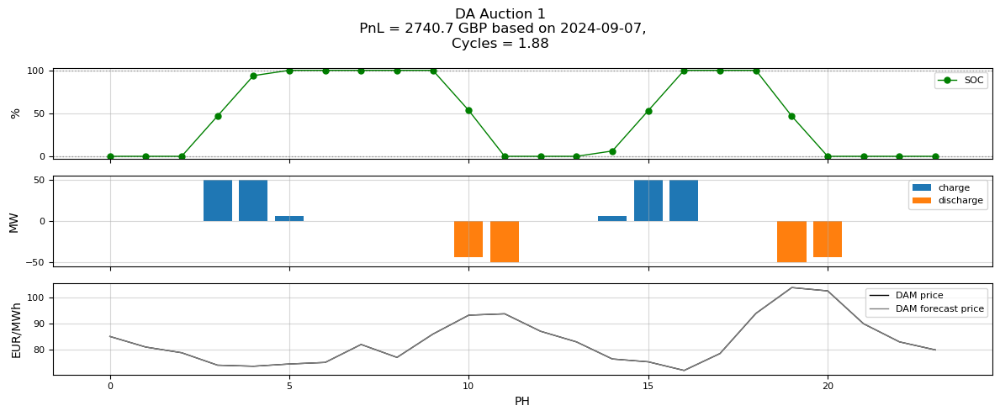

      del_date ref_date  pnl_da
37  2024-09-07     None  2740.7


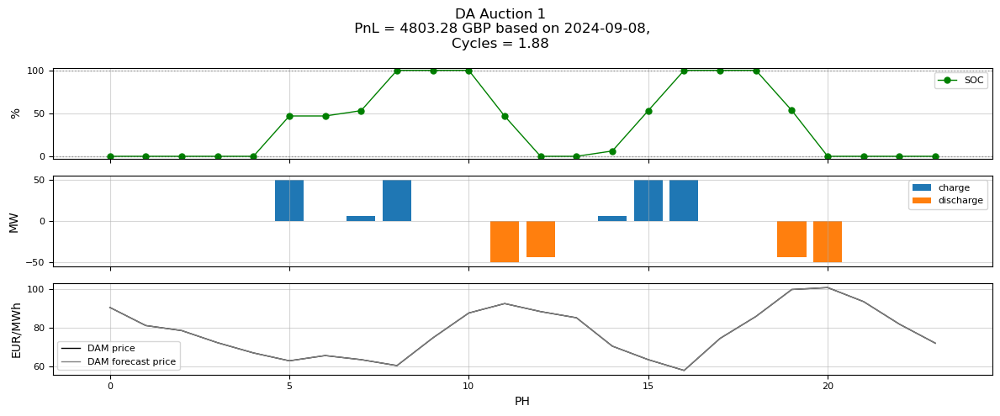

      del_date ref_date   pnl_da
38  2024-09-08     None  4803.28


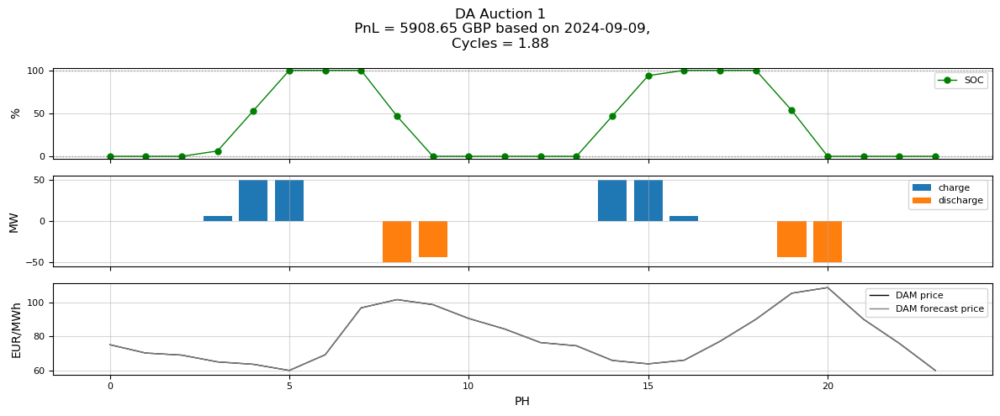

      del_date ref_date   pnl_da
39  2024-09-09     None  5908.65


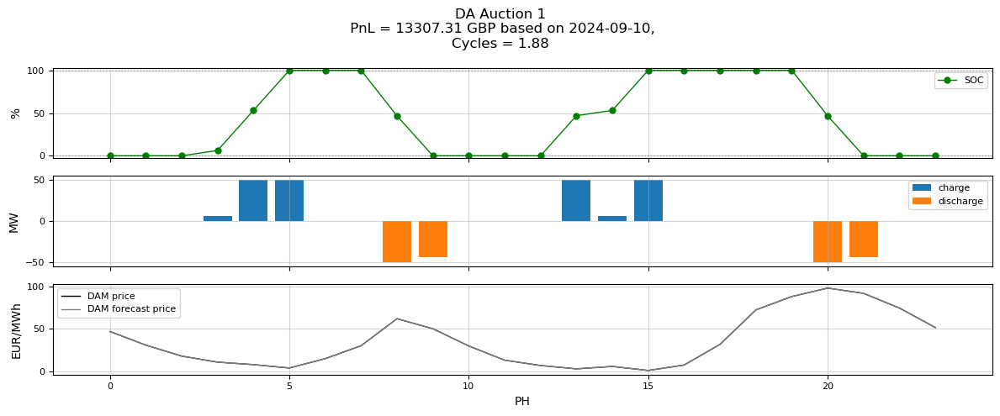

      del_date ref_date    pnl_da
40  2024-09-10     None  13307.31


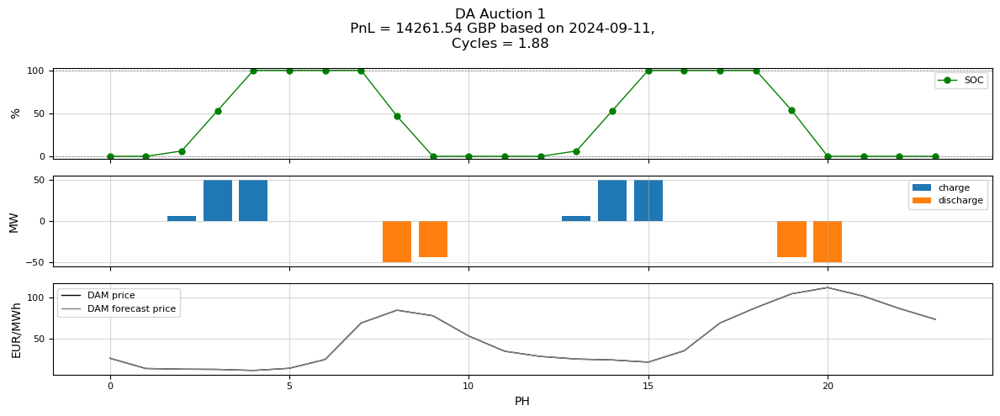

      del_date ref_date    pnl_da
41  2024-09-11     None  14261.54


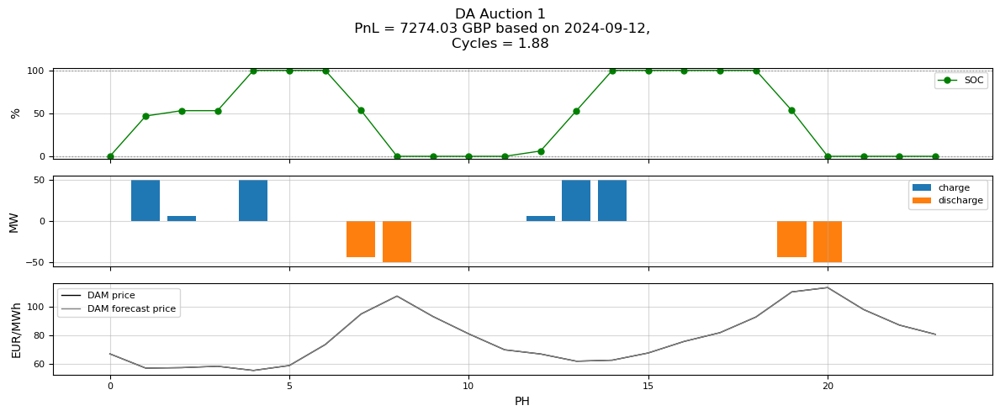

      del_date ref_date   pnl_da
42  2024-09-12     None  7274.03


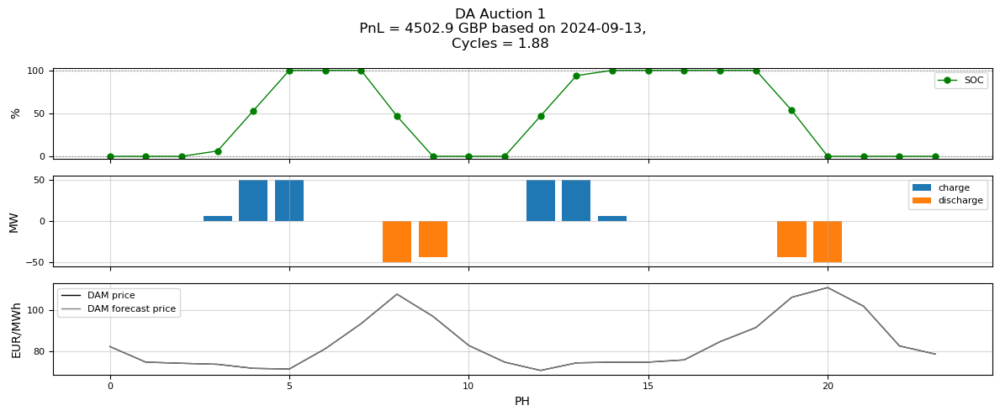

      del_date ref_date  pnl_da
43  2024-09-13     None  4502.9


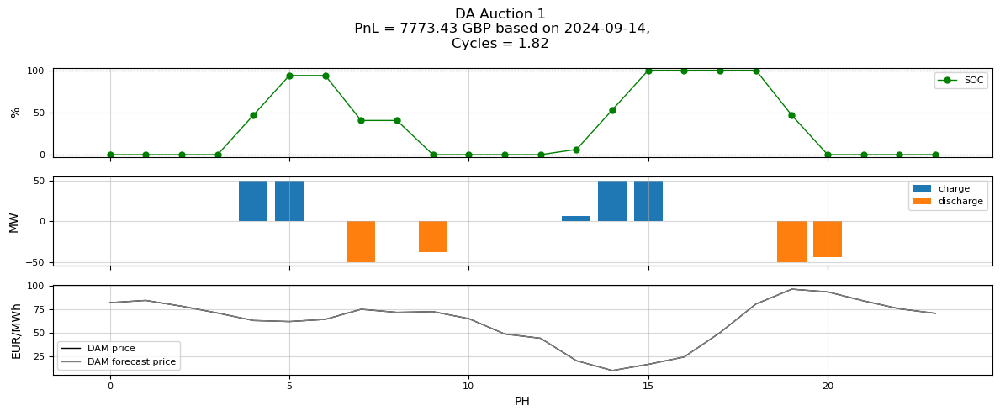

      del_date ref_date   pnl_da
44  2024-09-14     None  7773.43


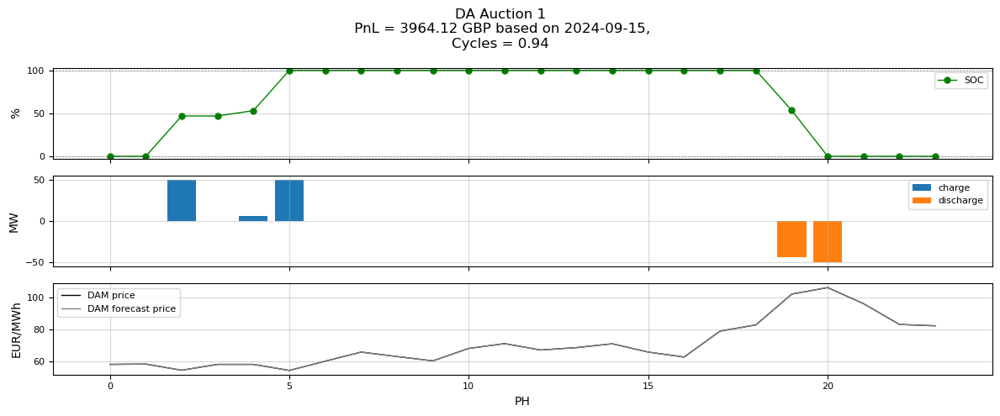

      del_date ref_date   pnl_da
45  2024-09-15     None  3964.12


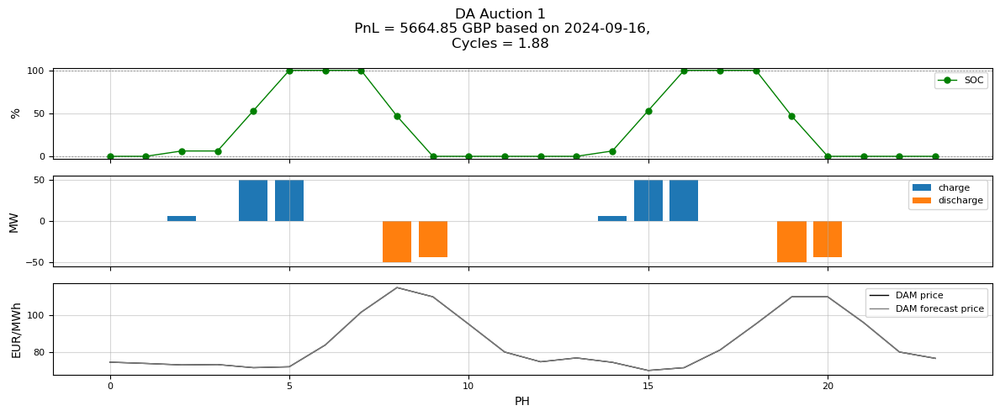

      del_date ref_date   pnl_da
46  2024-09-16     None  5664.85


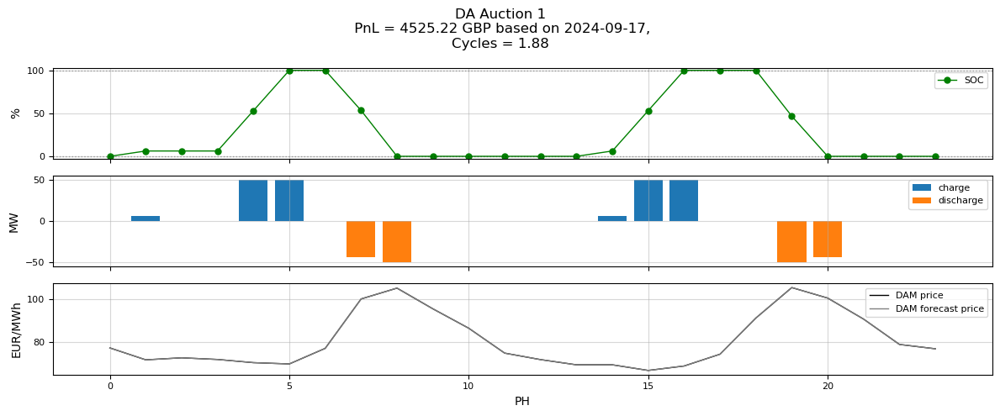

      del_date ref_date   pnl_da
47  2024-09-17     None  4525.22


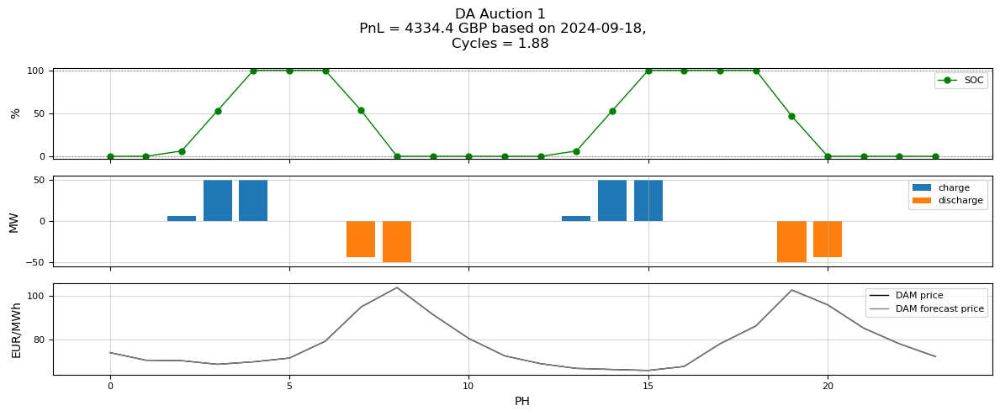

      del_date ref_date  pnl_da
48  2024-09-18     None  4334.4


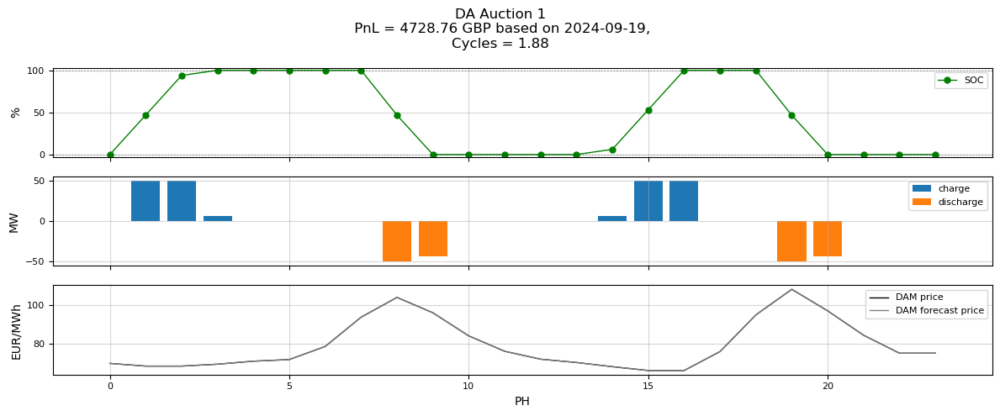

      del_date ref_date   pnl_da
49  2024-09-19     None  4728.76


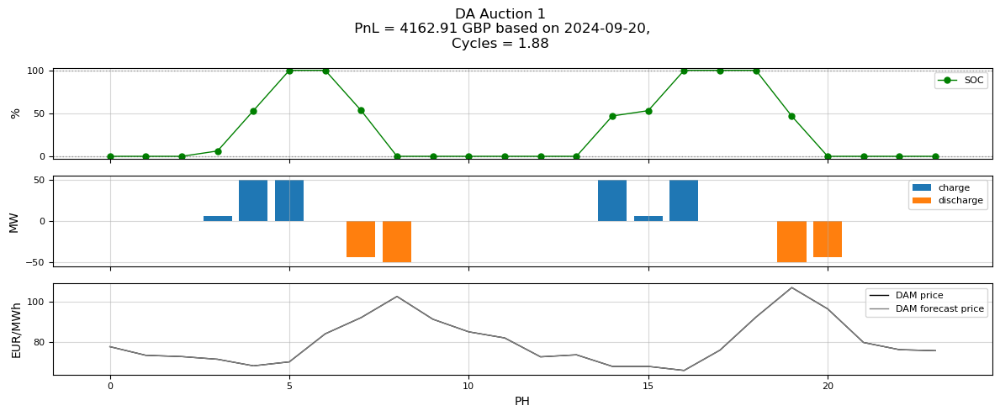

      del_date ref_date   pnl_da
50  2024-09-20     None  4162.91


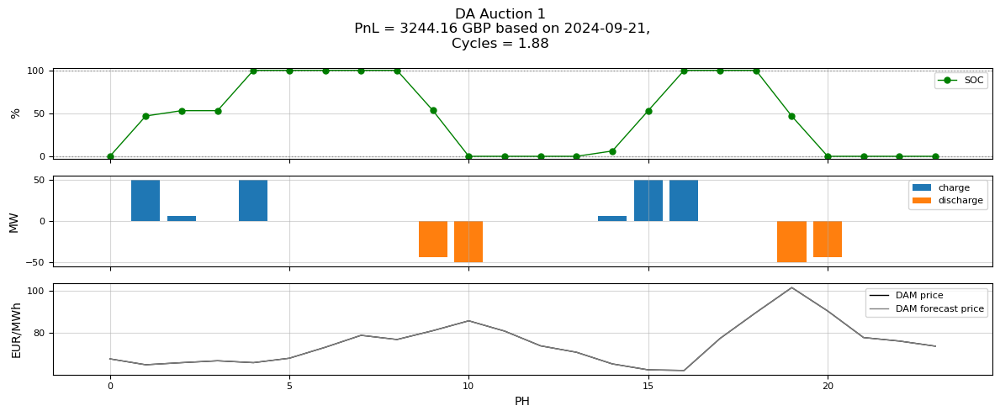

      del_date ref_date   pnl_da
51  2024-09-21     None  3244.16


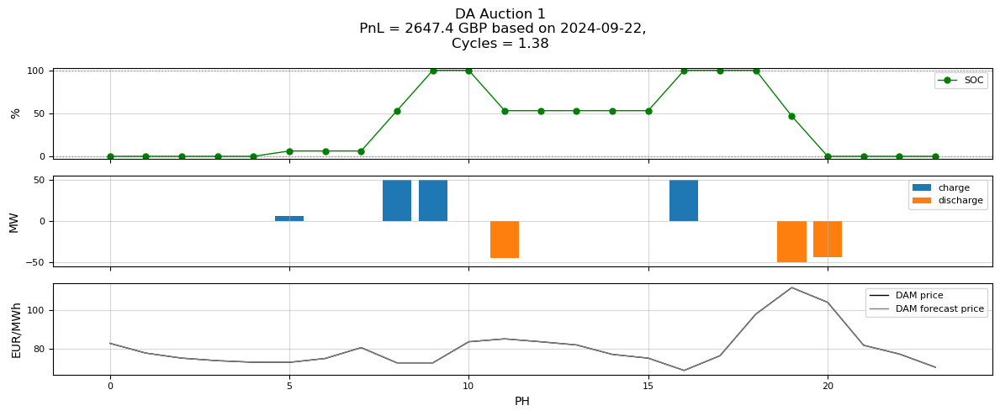

      del_date ref_date  pnl_da
52  2024-09-22     None  2647.4


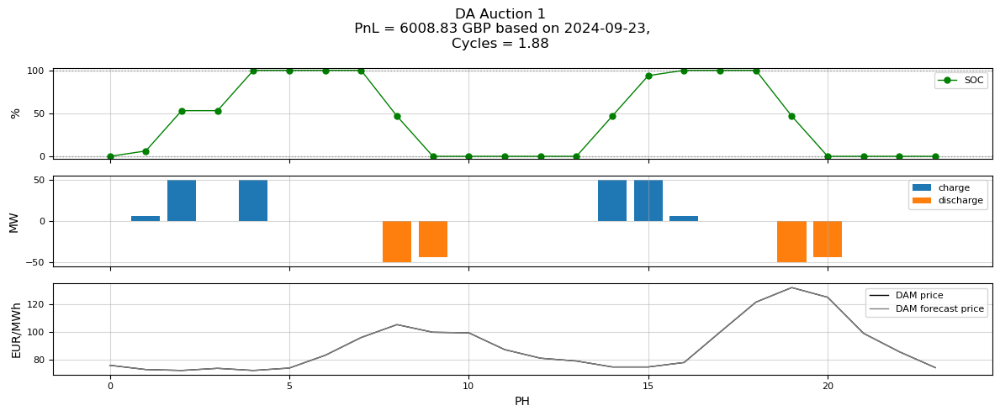

      del_date ref_date   pnl_da
53  2024-09-23     None  6008.83


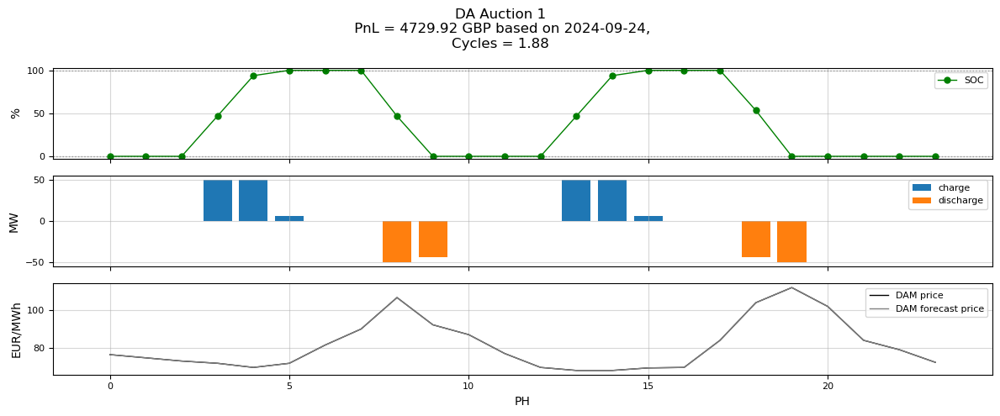

      del_date ref_date   pnl_da
54  2024-09-24     None  4729.92


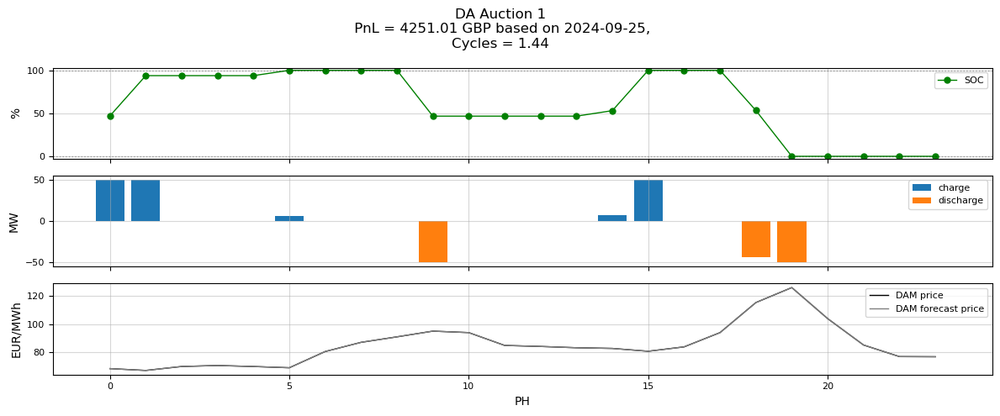

      del_date ref_date   pnl_da
55  2024-09-25     None  4251.01


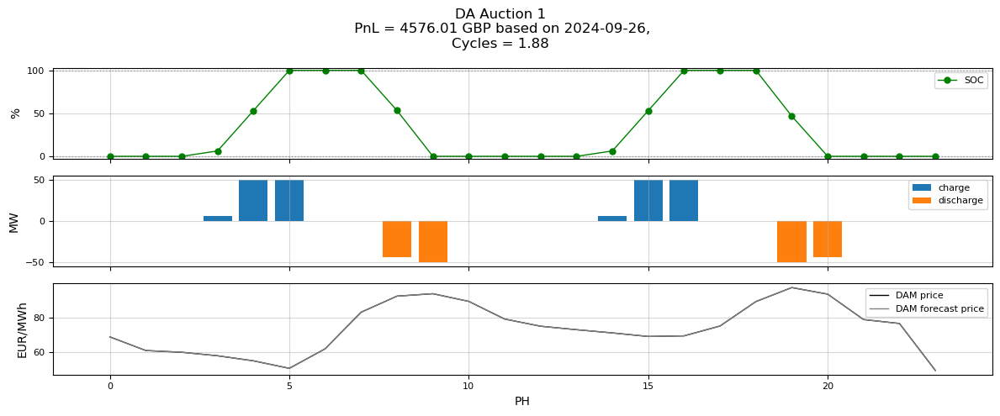

      del_date ref_date   pnl_da
56  2024-09-26     None  4576.01


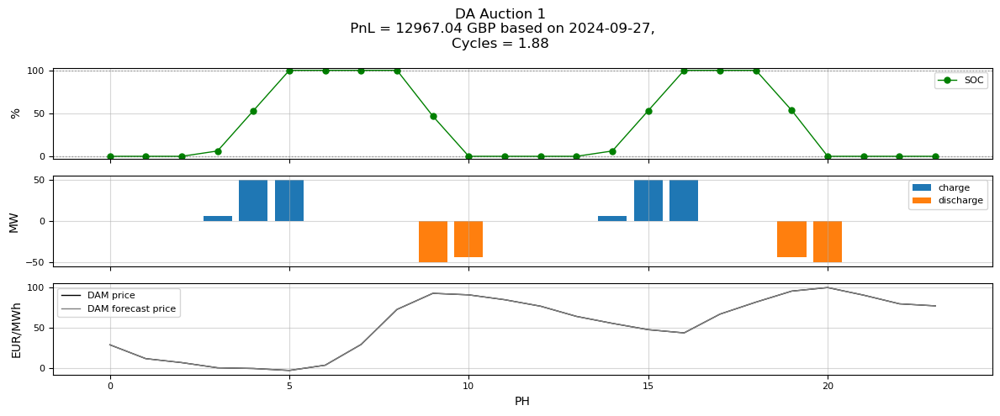

      del_date ref_date    pnl_da
57  2024-09-27     None  12967.04


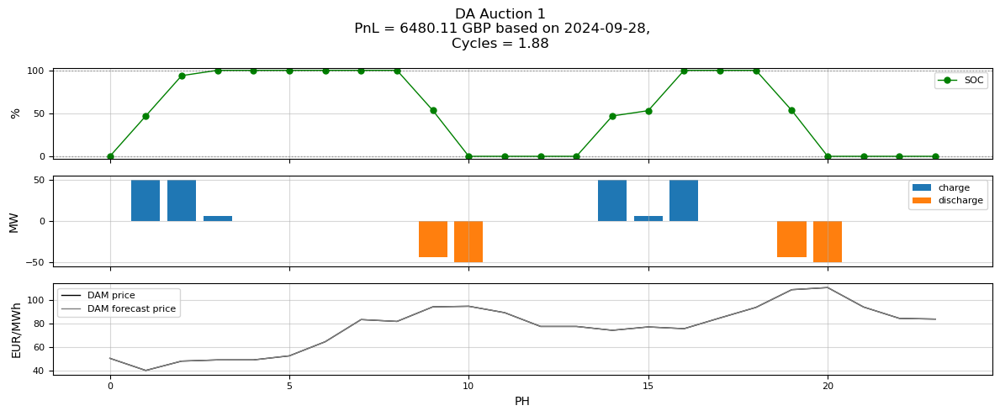

      del_date ref_date   pnl_da
58  2024-09-28     None  6480.11


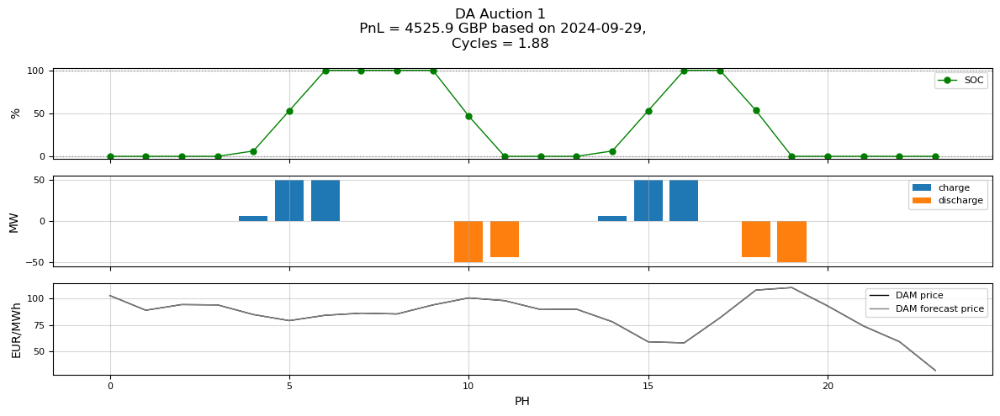

      del_date ref_date  pnl_da
59  2024-09-29     None  4525.9


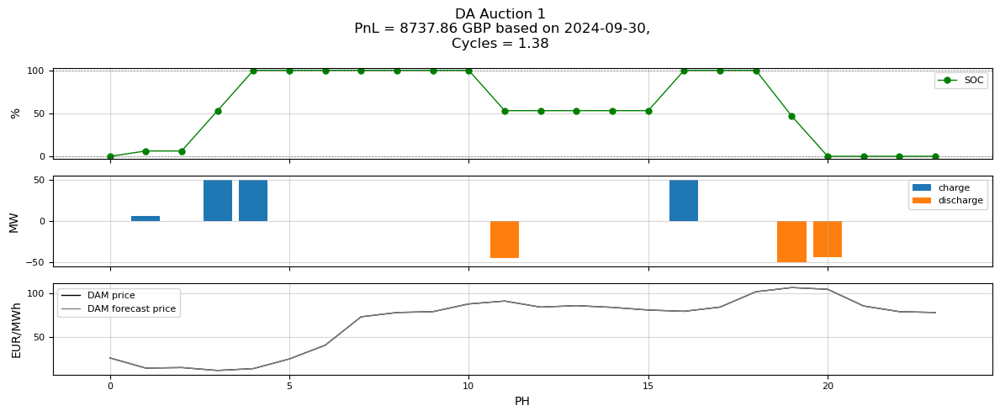

      del_date ref_date   pnl_da
60  2024-09-30     None  8737.86


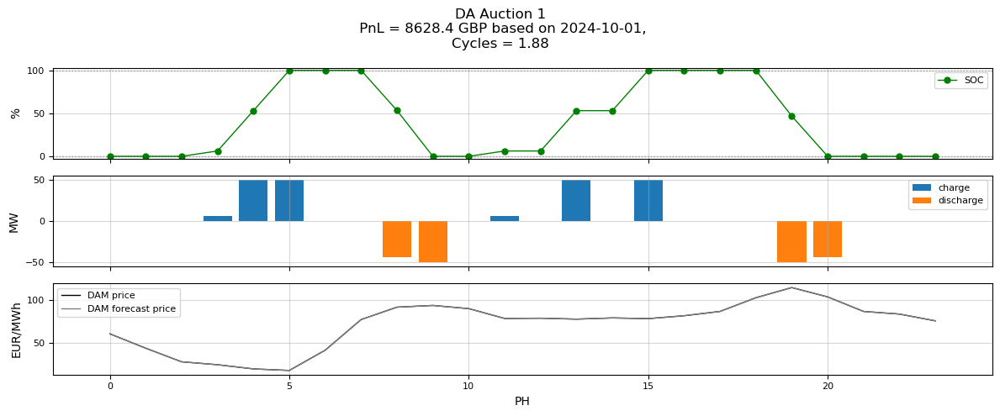

      del_date ref_date  pnl_da
61  2024-10-01     None  8628.4


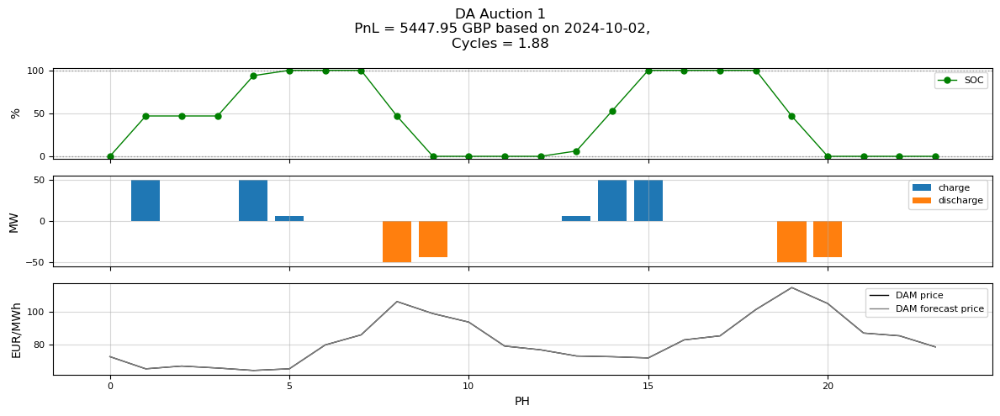

      del_date ref_date   pnl_da
62  2024-10-02     None  5447.95


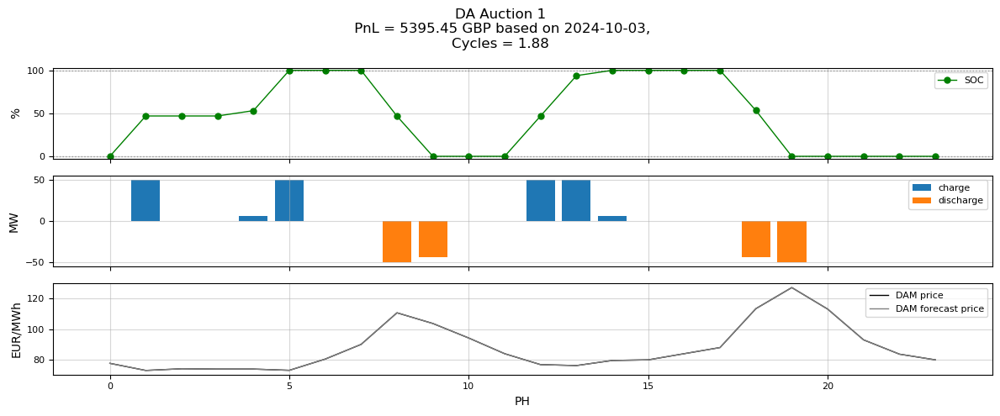

      del_date ref_date   pnl_da
63  2024-10-03     None  5395.45


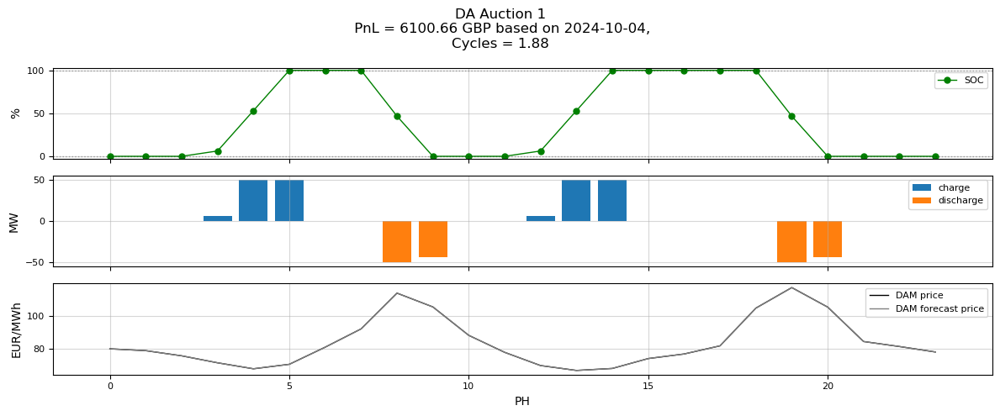

      del_date ref_date   pnl_da
64  2024-10-04     None  6100.66


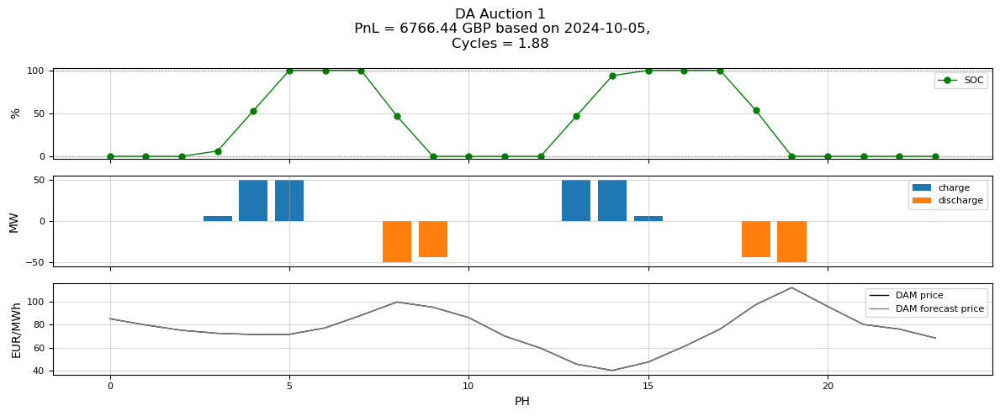

      del_date ref_date   pnl_da
65  2024-10-05     None  6766.44


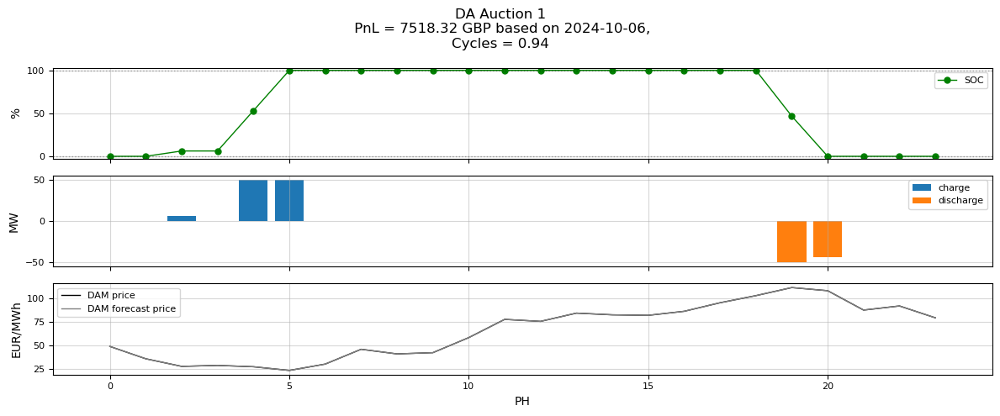

      del_date ref_date   pnl_da
66  2024-10-06     None  7518.32


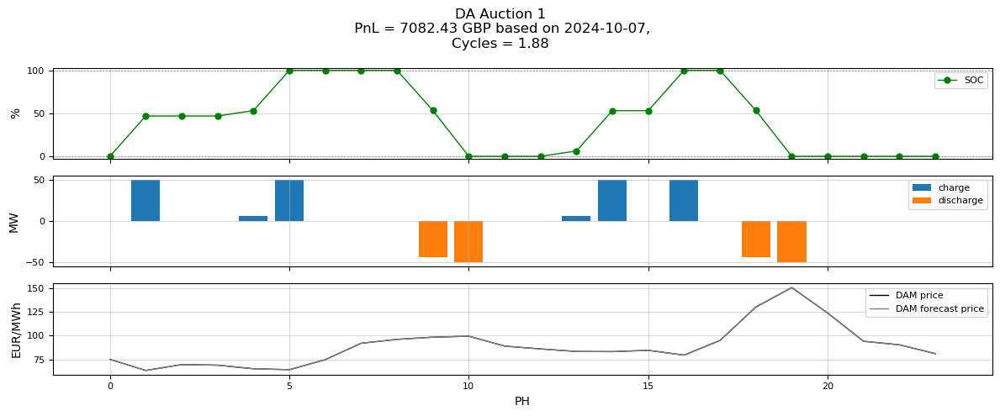

      del_date ref_date   pnl_da
67  2024-10-07     None  7082.43


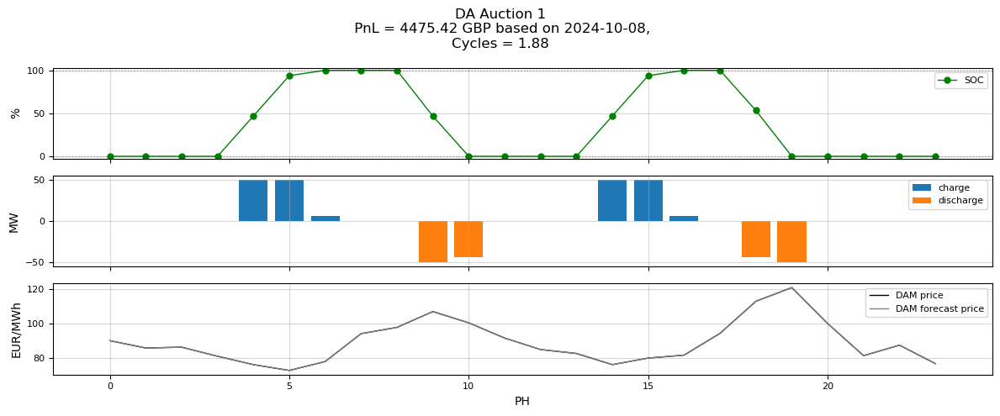

      del_date ref_date   pnl_da
68  2024-10-08     None  4475.42


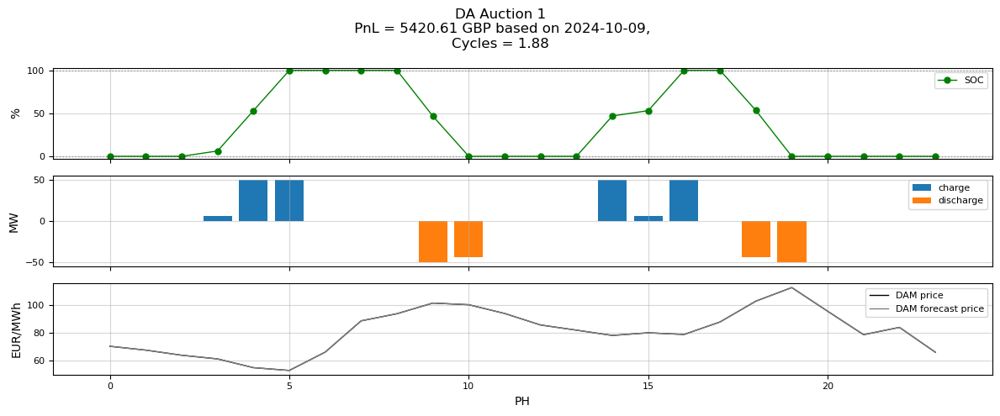

      del_date ref_date   pnl_da
69  2024-10-09     None  5420.61


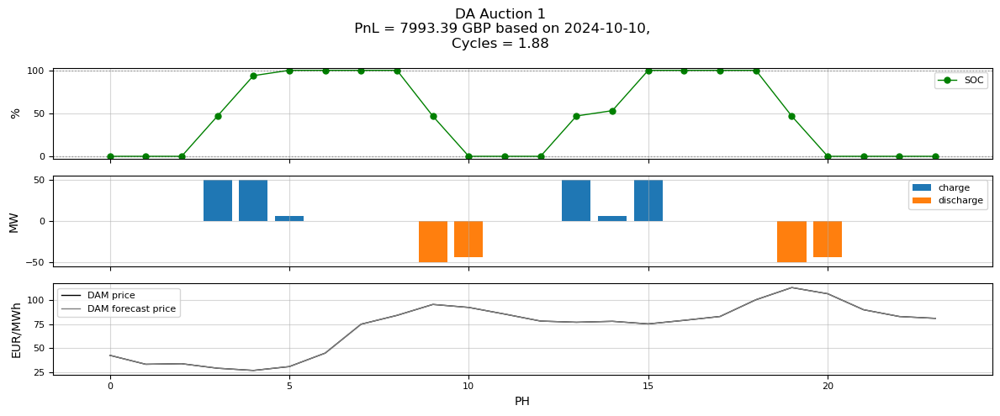

      del_date ref_date   pnl_da
70  2024-10-10     None  7993.39


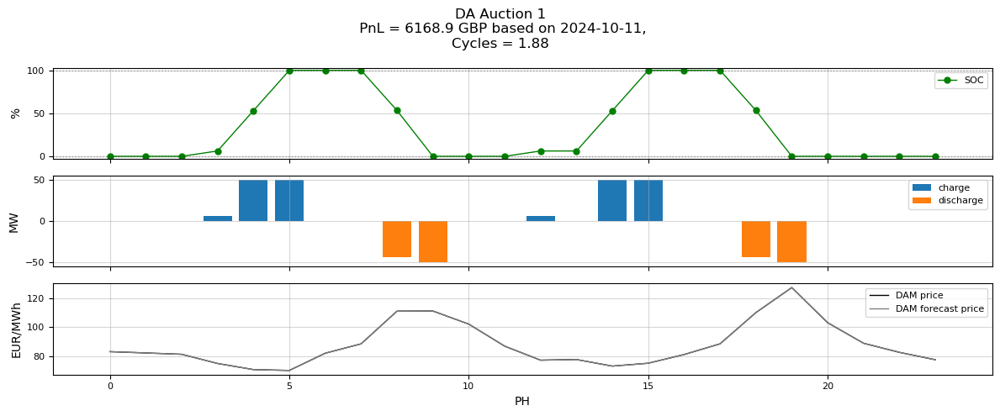

      del_date ref_date  pnl_da
71  2024-10-11     None  6168.9


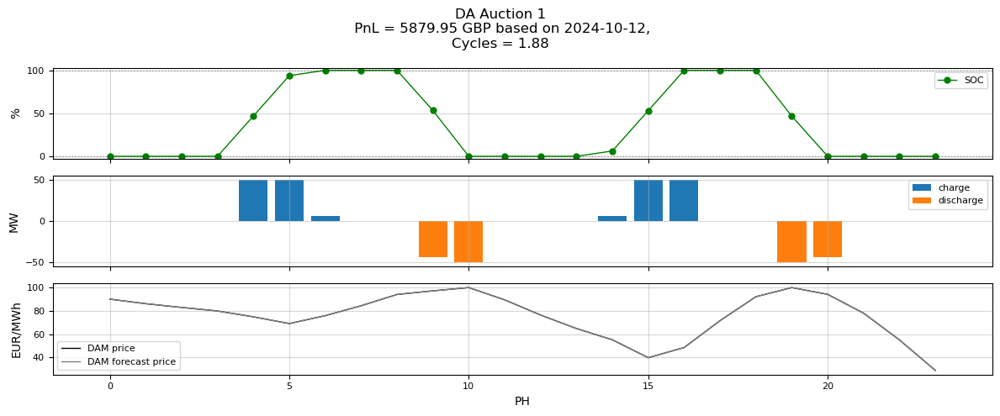

      del_date ref_date   pnl_da
72  2024-10-12     None  5879.95


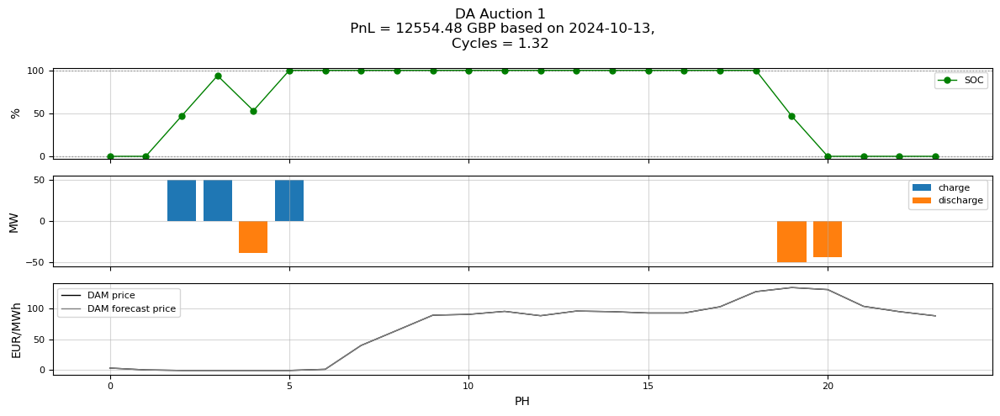

      del_date ref_date    pnl_da
73  2024-10-13     None  12554.48


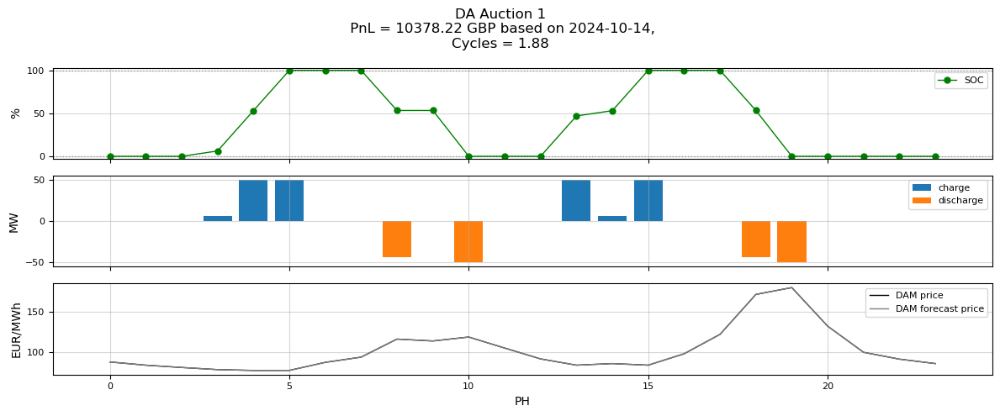

      del_date ref_date    pnl_da
74  2024-10-14     None  10378.22


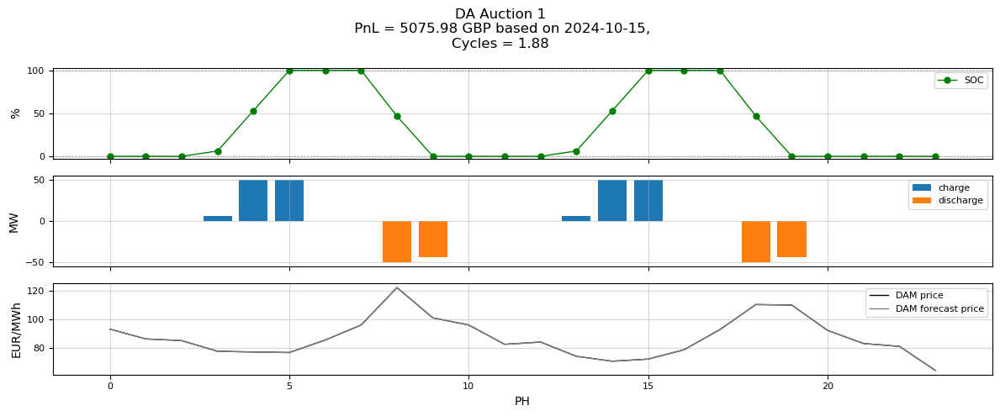

      del_date ref_date   pnl_da
75  2024-10-15     None  5075.98


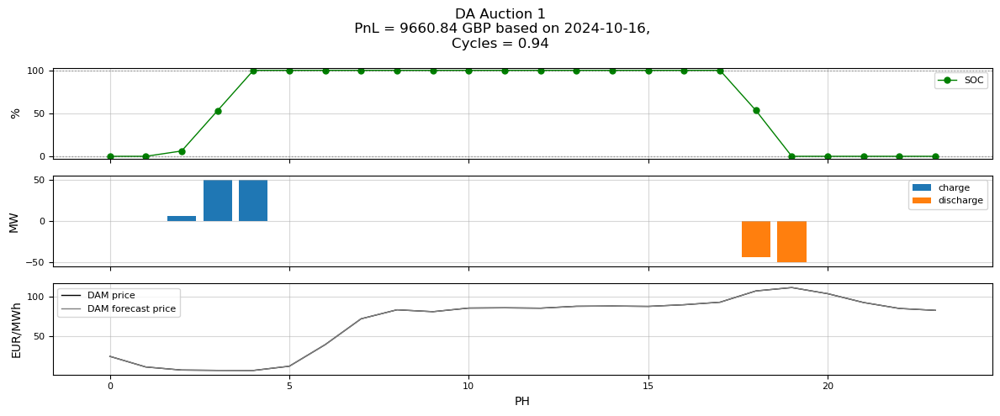

      del_date ref_date   pnl_da
76  2024-10-16     None  9660.84


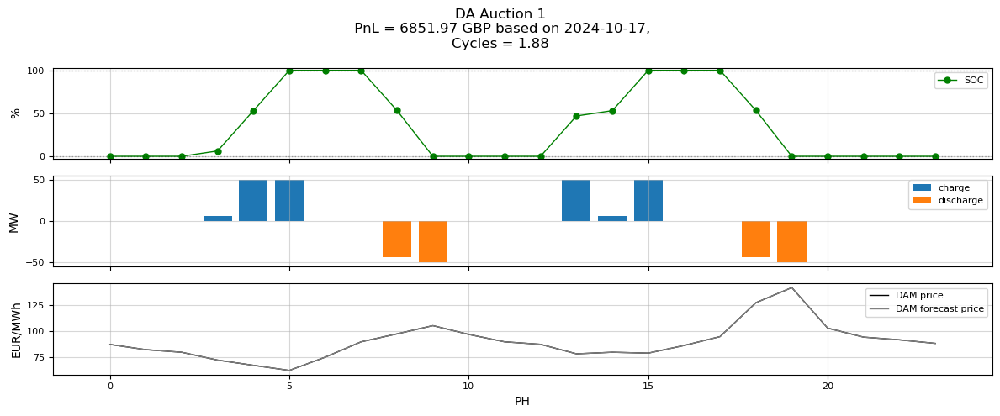

      del_date ref_date   pnl_da
77  2024-10-17     None  6851.97


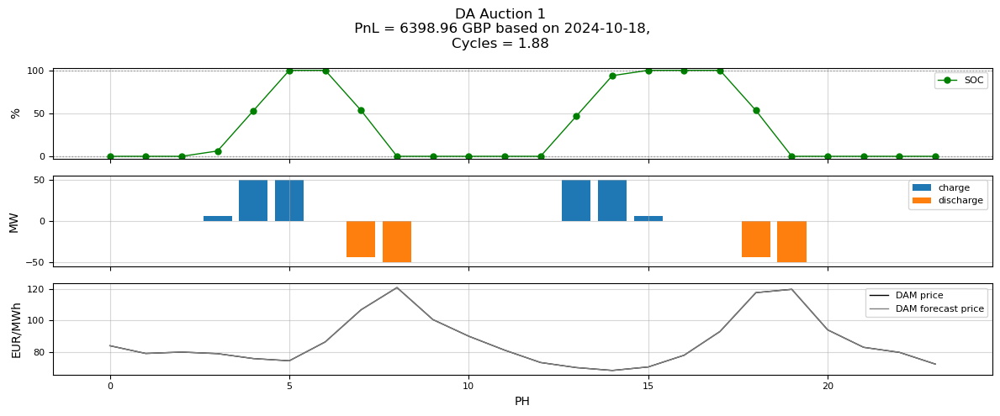

      del_date ref_date   pnl_da
78  2024-10-18     None  6398.96


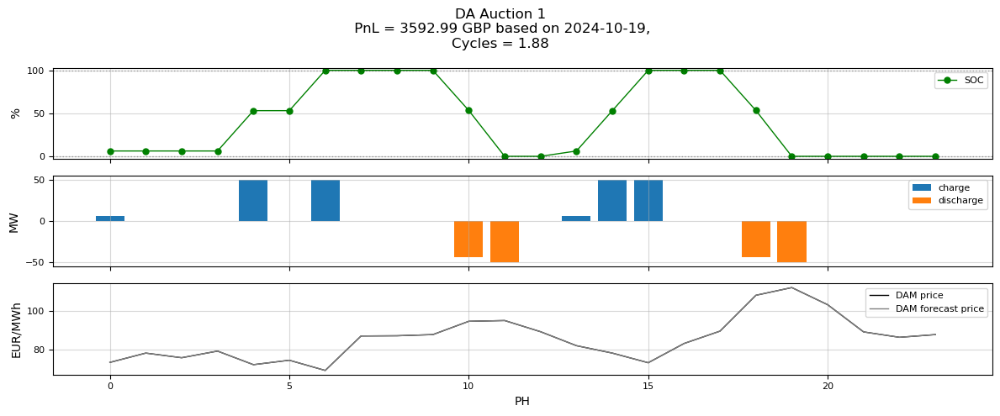

      del_date ref_date   pnl_da
79  2024-10-19     None  3592.99


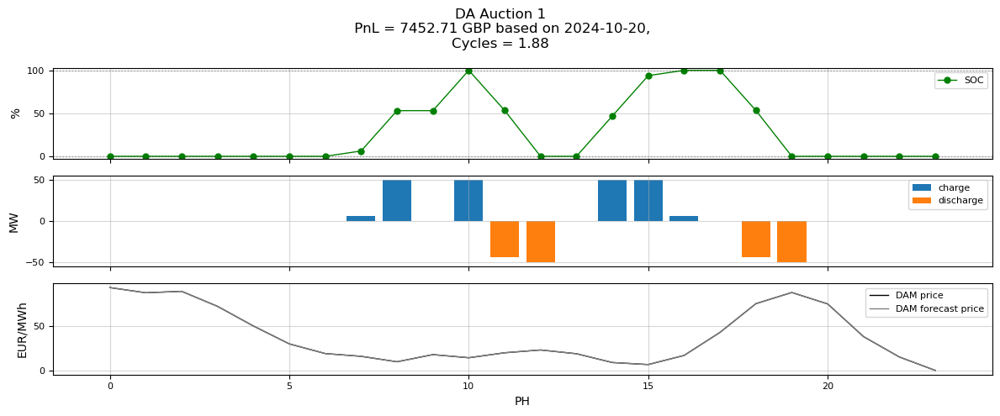

      del_date ref_date   pnl_da
80  2024-10-20     None  7452.71


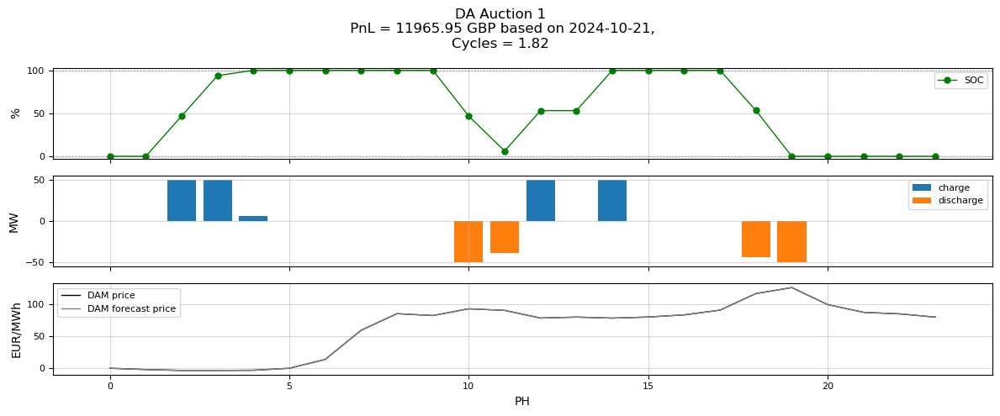

      del_date ref_date    pnl_da
81  2024-10-21     None  11965.95


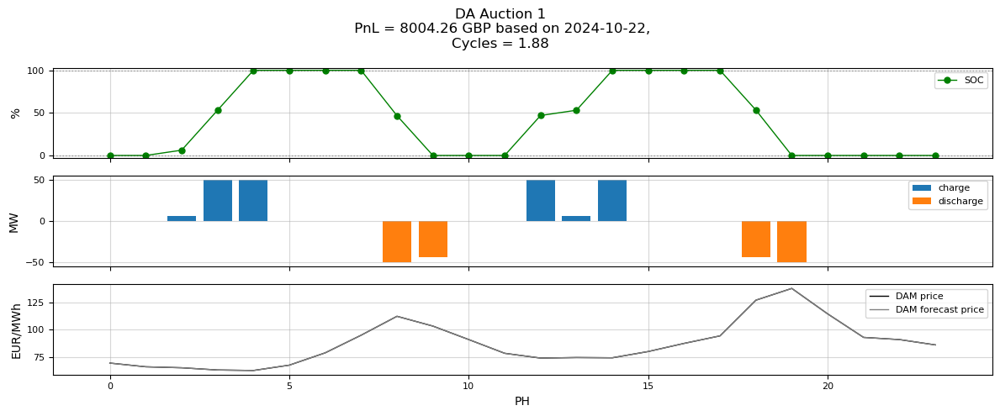

      del_date ref_date   pnl_da
82  2024-10-22     None  8004.26


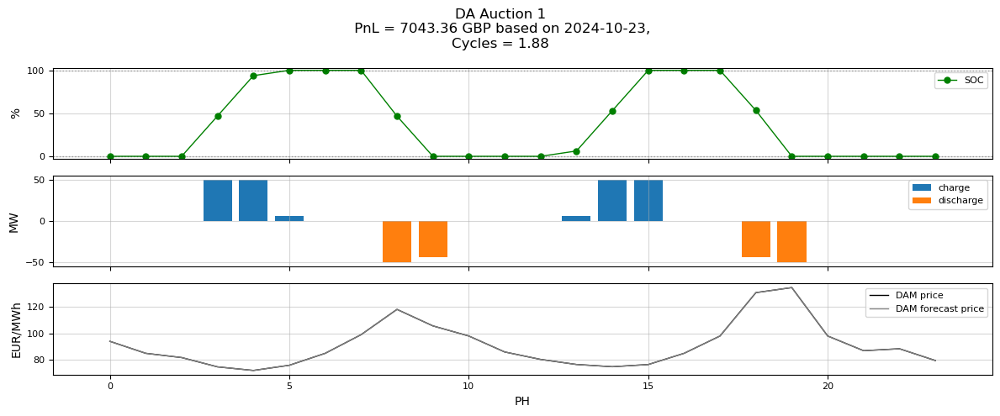

      del_date ref_date   pnl_da
83  2024-10-23     None  7043.36


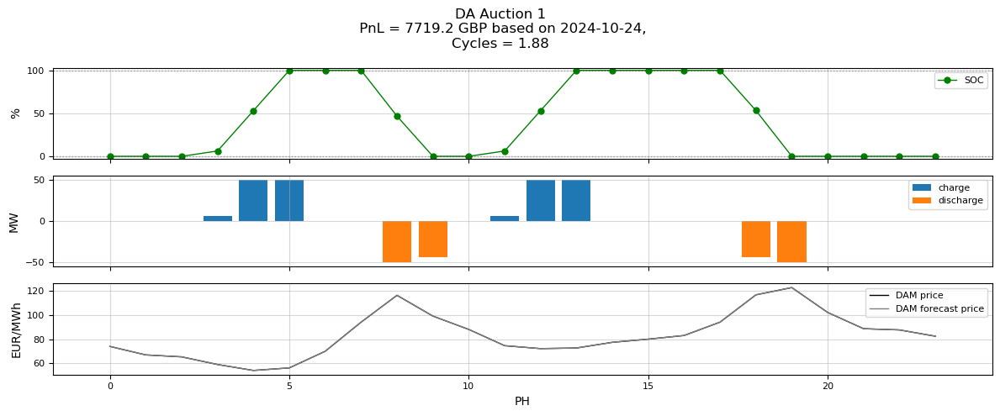

      del_date ref_date  pnl_da
84  2024-10-24     None  7719.2


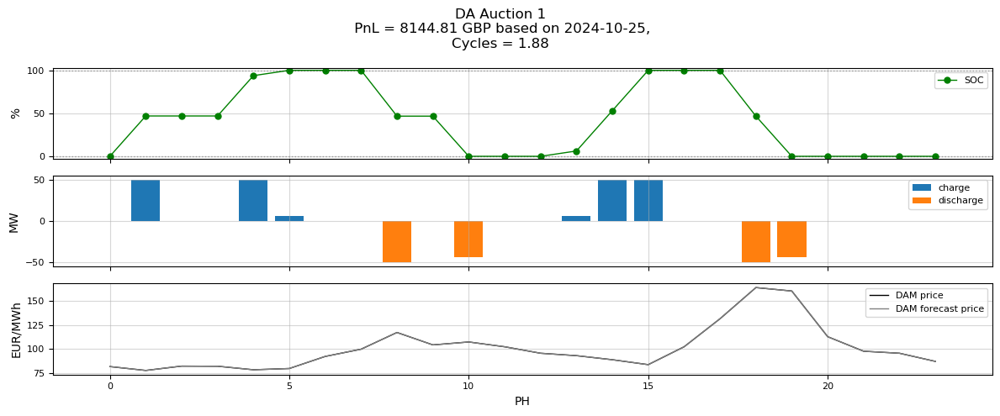

      del_date ref_date   pnl_da
85  2024-10-25     None  8144.81


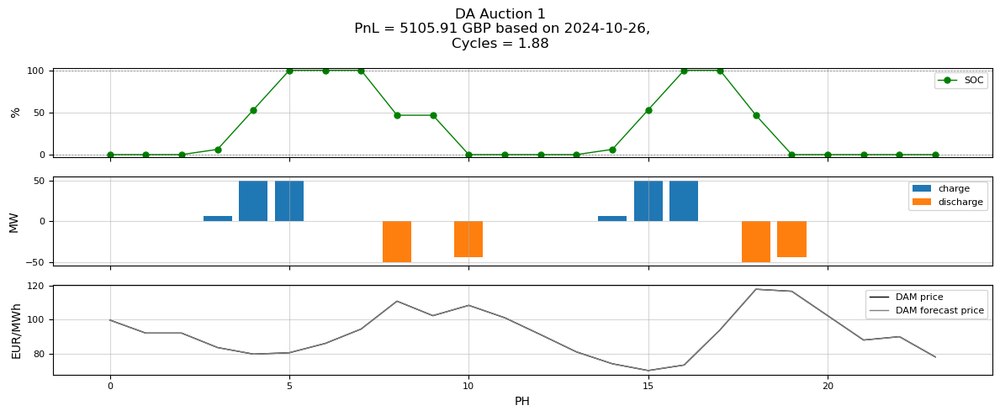

      del_date ref_date   pnl_da
86  2024-10-26     None  5105.91


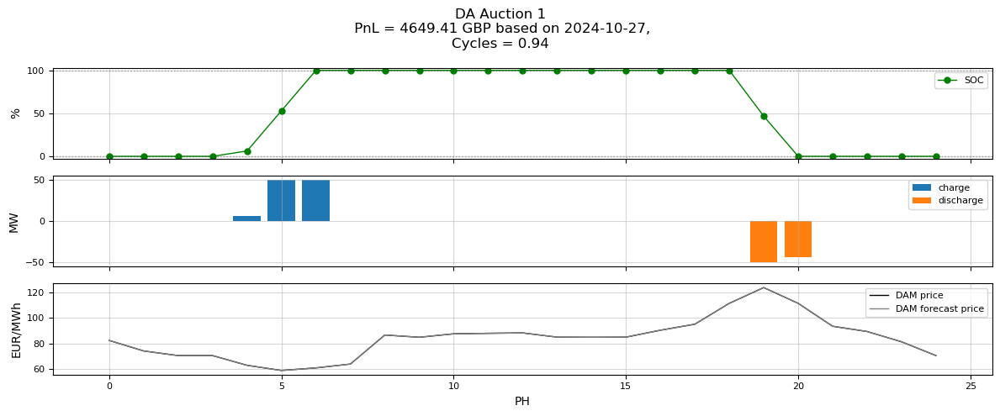

      del_date ref_date   pnl_da
87  2024-10-27     None  4649.41


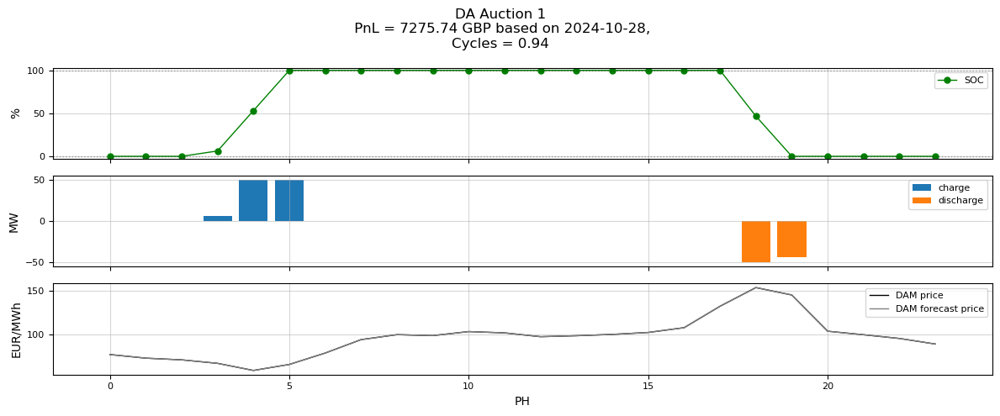

      del_date ref_date   pnl_da
88  2024-10-28     None  7275.74


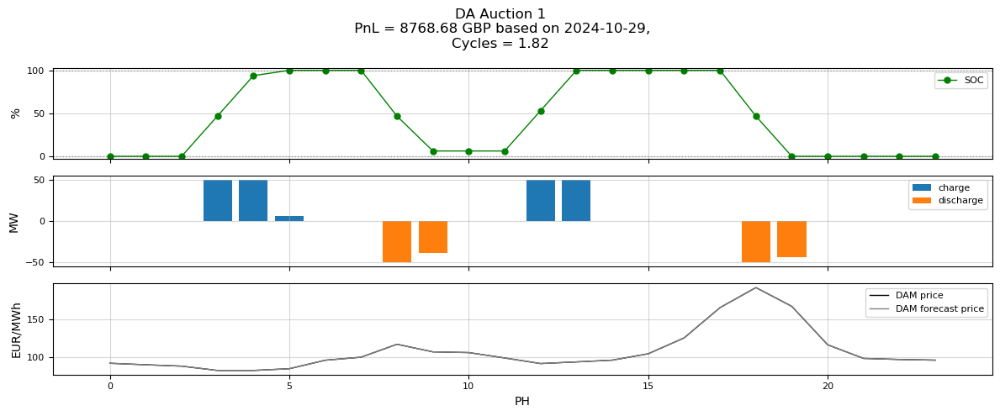

      del_date ref_date   pnl_da
89  2024-10-29     None  8768.68


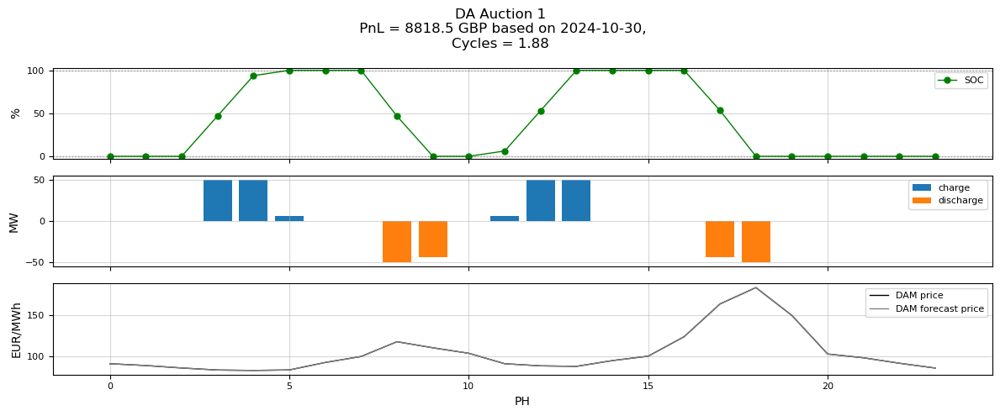

      del_date ref_date  pnl_da
90  2024-10-30     None  8818.5


In [124]:
daily_log_foresight = pd.DataFrame()    # daily logs
hourly_log_foresight = pd.DataFrame()   # hourly logs

for d in dates[:]:

    ref_date = None # for d, from your own dataset 

    # actuals, for price settlements
    del_da_data = da_data[da_data.date == d].reset_index(drop=True)
    
    # forecast for scheduling
    
    DAM_run = bess_object_dam.solving(
        dam_actual=del_da_data.da_price,  # for settlements
        dam_fc=del_da_data.da_price,   # for scheduling
        plot='show_daily_plots',  # toggle plotting here
        title_text1="DA Auction 1",
        title_text2=f"{d}",
    )
    DAM_run["dtutc"] = del_da_data.dtutc
    DAM_run["da_actual"] = del_da_data.da_price
    eod_soc = DAM_run.soc_end.iloc[-1]

    # logging
    hourly_log_foresight = pd.concat(
        [
            hourly_log_foresight,
            DAM_run[
                ["net", "soc_start", "soc_end", "dtutc", "da_actual"]
            ],
        ],
        ignore_index=True,
    )
    daily_log_foresight = pd.concat(
        [
            daily_log_foresight,
            pd.DataFrame(
                [
                    {
                        "del_date": d,
                        "ref_date": ref_date,
                        "pnl_da": bess_object_dam.pnl,
                    }
                ]
            ),
        ],
        ignore_index=True,
    )

    bess_object_dam.init_soc = eod_soc
    print(daily_log_foresight.tail(1))

In [125]:
daily_log_foresight.to_csv("perfect_foresight_da_pnl.csv", index=False)

In [126]:
daily_log_foresight

,del_date,ref_date,pnl_da
0,2024-08-01,None,3360.64
1,2024-08-02,None,4499.91
2,2024-08-03,None,3304.46
3,2024-08-04,None,3647.92
4,2024-08-05,None,6703.39
...,...,...,...
86,2024-10-26,None,5105.91
87,2024-10-27,None,4649.41
88,2024-10-28,None,7275.74
89,2024-10-29,None,8768.68


In [127]:
benchmark = daily_log_foresight.pnl_da.sum()
benchmark

625858.17

# Simulation with reference day actuals

- scheduling will be done on the actual prices for each reference day
- settlement will be done on the actual prices for each dilivery day

In [128]:
dates = ref_day_data.date.unique()
dates

array([datetime.date(2024, 8, 1), datetime.date(2024, 8, 2),
       datetime.date(2024, 8, 3), datetime.date(2024, 8, 4),
       datetime.date(2024, 8, 5), datetime.date(2024, 8, 6),
       datetime.date(2024, 8, 7), datetime.date(2024, 8, 8),
       datetime.date(2024, 8, 9), datetime.date(2024, 8, 10),
       datetime.date(2024, 8, 11), datetime.date(2024, 8, 12),
       datetime.date(2024, 8, 13), datetime.date(2024, 8, 14),
       datetime.date(2024, 8, 15), datetime.date(2024, 8, 16),
       datetime.date(2024, 8, 17), datetime.date(2024, 8, 18),
       datetime.date(2024, 8, 19), datetime.date(2024, 8, 20),
       datetime.date(2024, 8, 21), datetime.date(2024, 8, 22),
       datetime.date(2024, 8, 23), datetime.date(2024, 8, 24),
       datetime.date(2024, 8, 25), datetime.date(2024, 8, 26),
       datetime.date(2024, 8, 27), datetime.date(2024, 8, 28),
       datetime.date(2024, 8, 29), datetime.date(2024, 8, 30),
       datetime.date(2024, 8, 31), datetime.date(2024, 9, 1),
  

In [129]:
# initiate class object, once at the start of the simulation

# initiate class object
bess_object_dam = day_ahead(
    size=SIZE,
    power_up=POWER_UP,
    power_down=POWER_DOWN,
    timestep=1,
    charge_eff=CHARGE_EFFICIENCY,
    discharge_eff=DISCHARGE_EFFICIENCY,
    manual_soc_max=MANUAL_SOC_MAX,
    manual_soc_min=MANUAL_SOC_MIN,
    init_soc=INIT_SOC,
    end_soc=END_SOC,
    end_soc_limit_type=end_soc_limit_type,
    daily_cycle_max=MAX_THROUGHPUT_CYCLES,
    throughput_size=THROUGHPUT_SIZE,
    solution_time_limit=SOLUTION_TIME_LIMIT_SEC,
    integer_solution=INTEGER_PN,
)

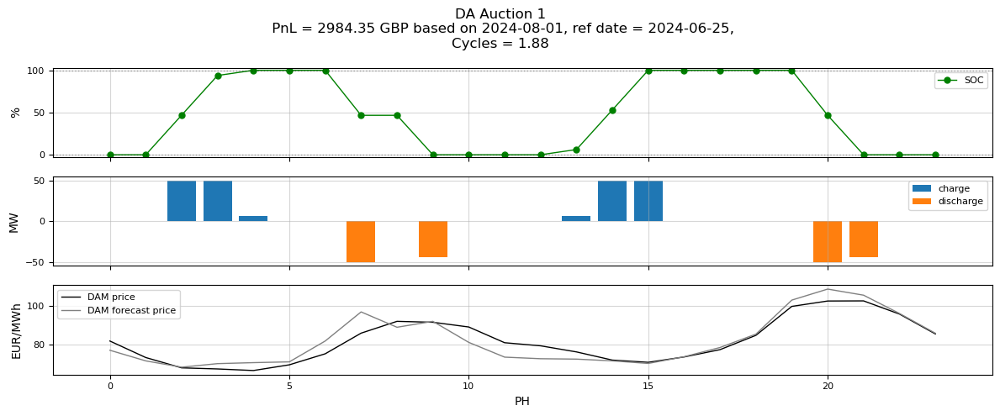

     del_date    ref_date   pnl_da
0  2024-08-01  2024-06-25  2984.35


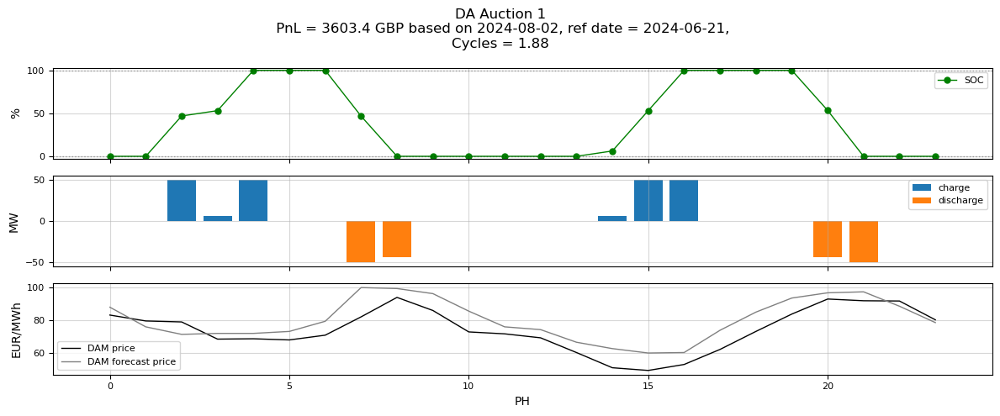

     del_date    ref_date  pnl_da
1  2024-08-02  2024-06-21  3603.4


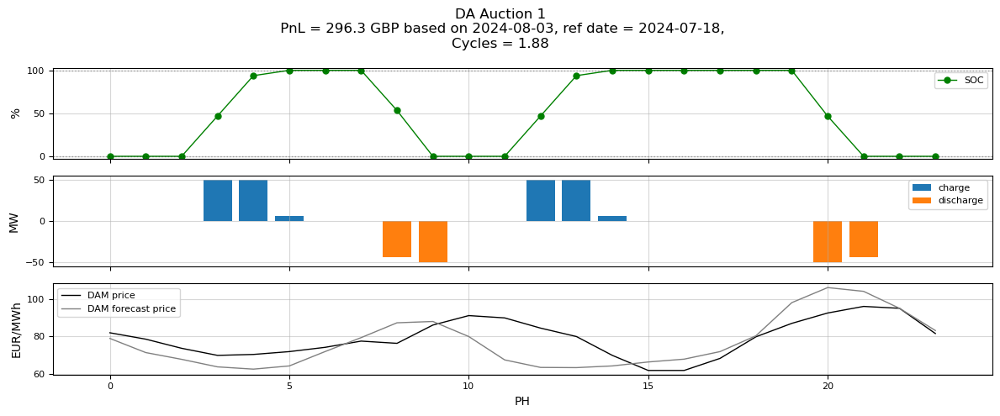

     del_date    ref_date  pnl_da
2  2024-08-03  2024-07-18   296.3


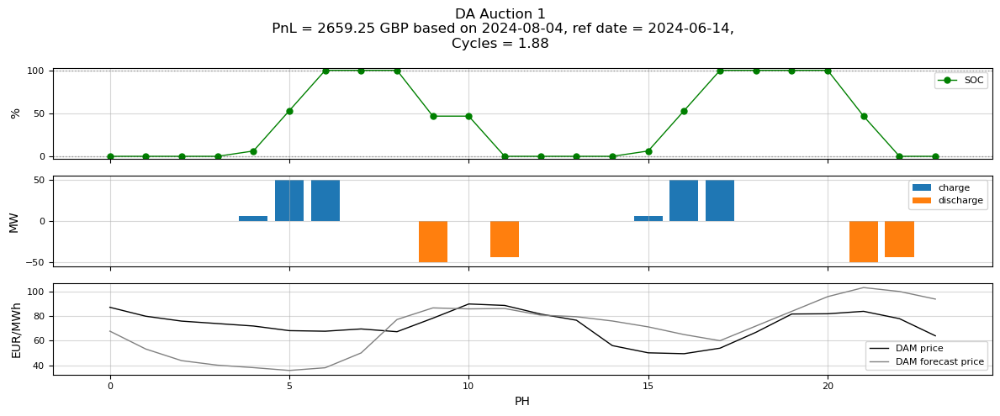

     del_date    ref_date   pnl_da
3  2024-08-04  2024-06-14  2659.25


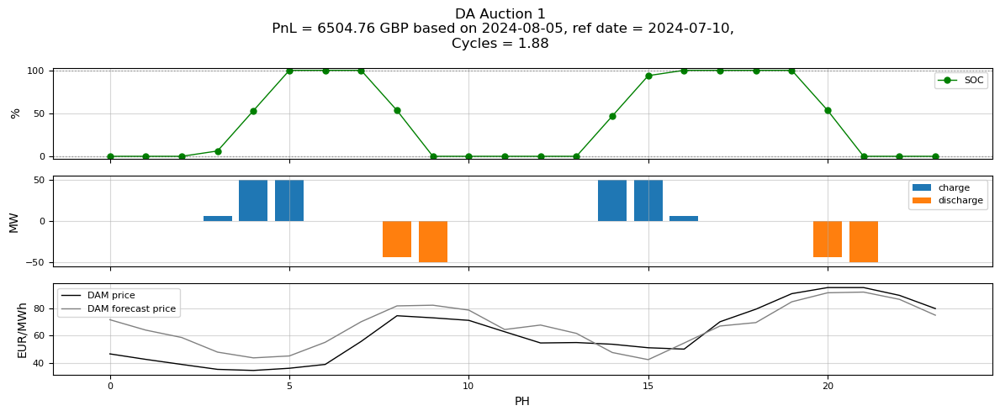

     del_date    ref_date   pnl_da
4  2024-08-05  2024-07-10  6504.76


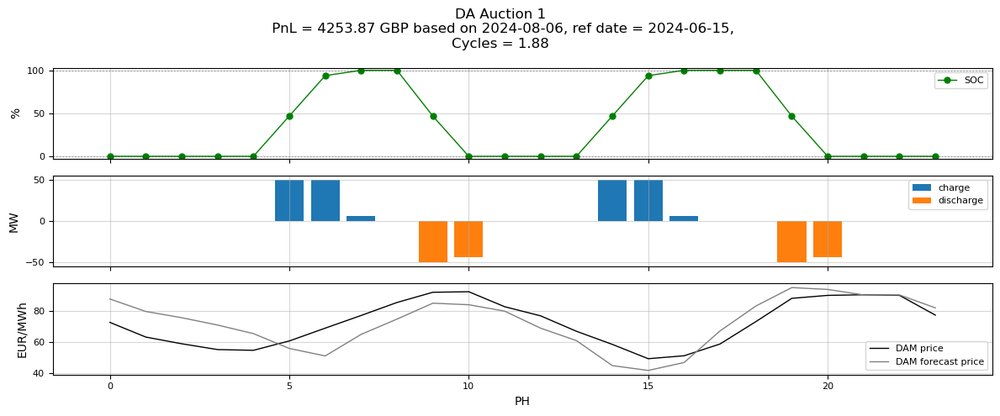

     del_date    ref_date   pnl_da
5  2024-08-06  2024-06-15  4253.87


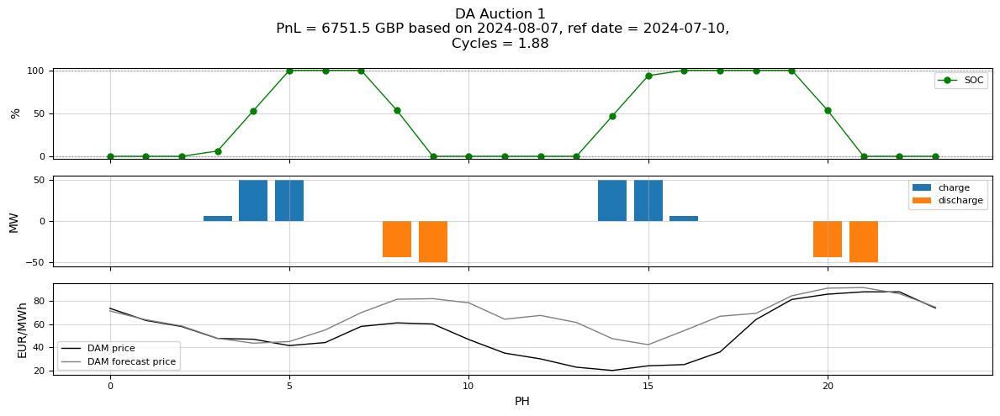

     del_date    ref_date  pnl_da
6  2024-08-07  2024-07-10  6751.5


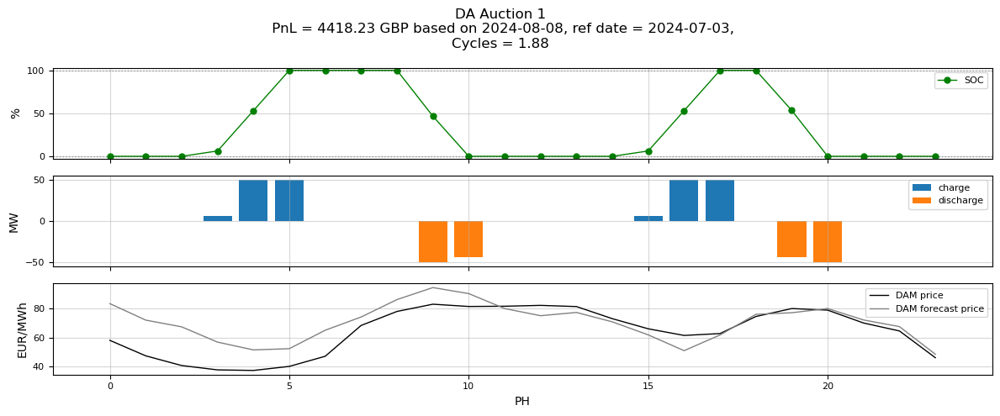

     del_date    ref_date   pnl_da
7  2024-08-08  2024-07-03  4418.23


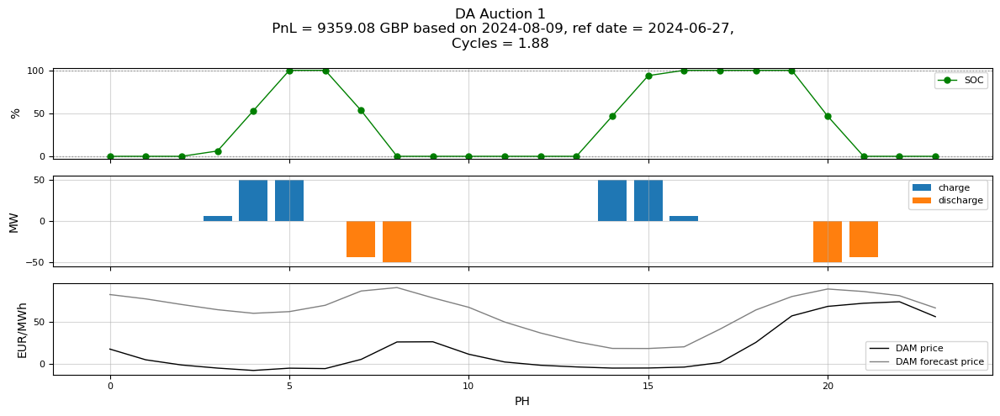

     del_date    ref_date   pnl_da
8  2024-08-09  2024-06-27  9359.08


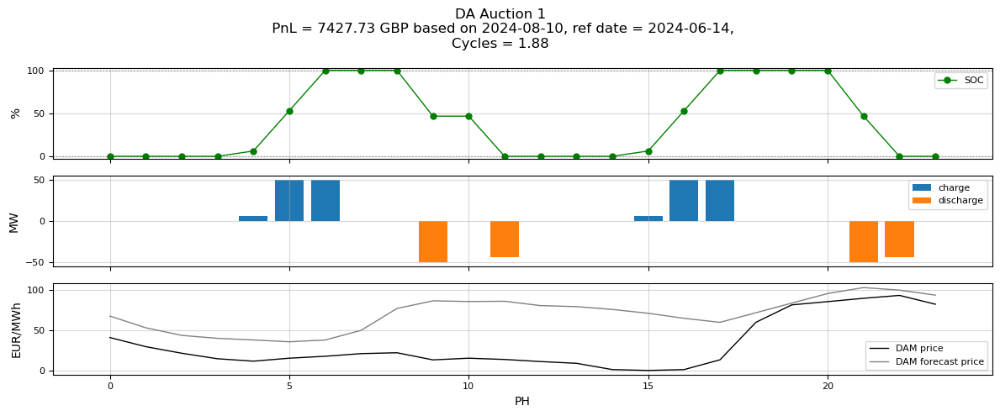

     del_date    ref_date   pnl_da
9  2024-08-10  2024-06-14  7427.73


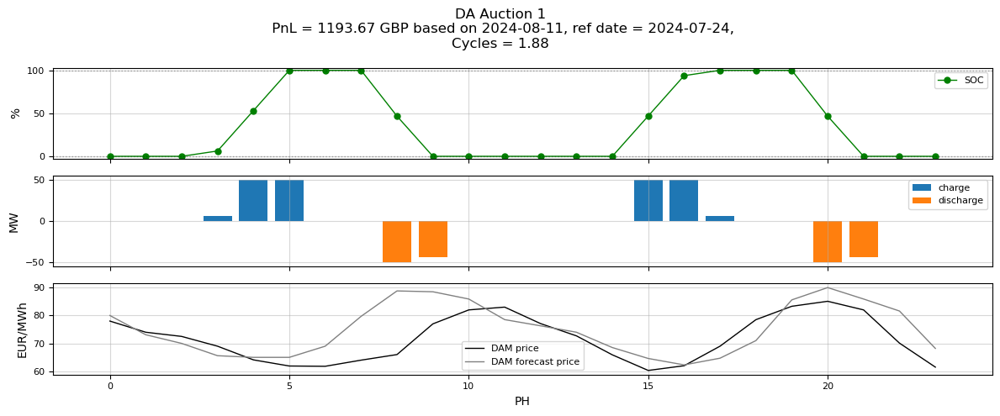

      del_date    ref_date   pnl_da
10  2024-08-11  2024-07-24  1193.67


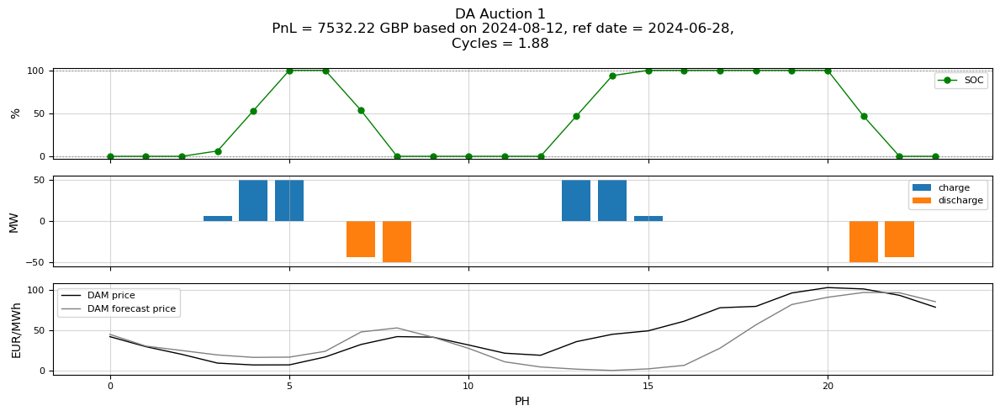

      del_date    ref_date   pnl_da
11  2024-08-12  2024-06-28  7532.22


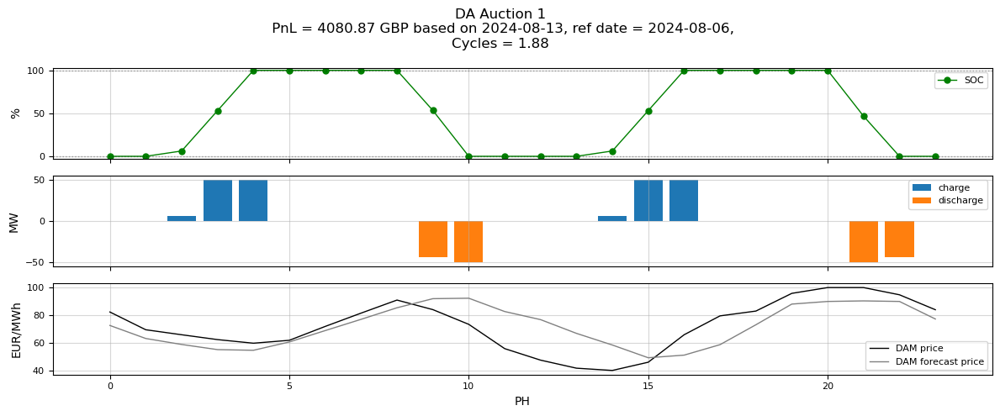

      del_date    ref_date   pnl_da
12  2024-08-13  2024-08-06  4080.87


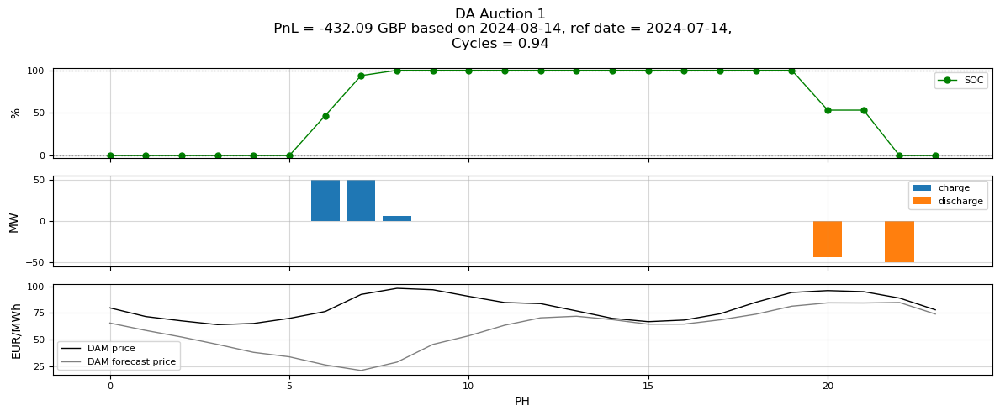

      del_date    ref_date  pnl_da
13  2024-08-14  2024-07-14 -432.09


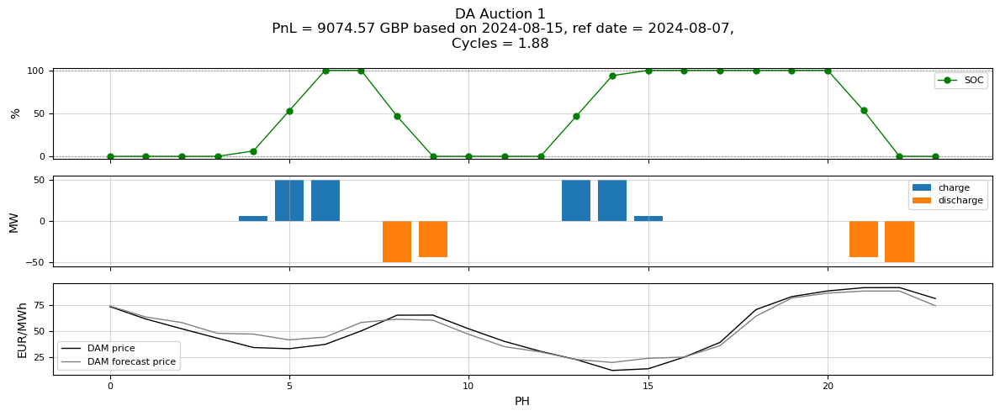

      del_date    ref_date   pnl_da
14  2024-08-15  2024-08-07  9074.57


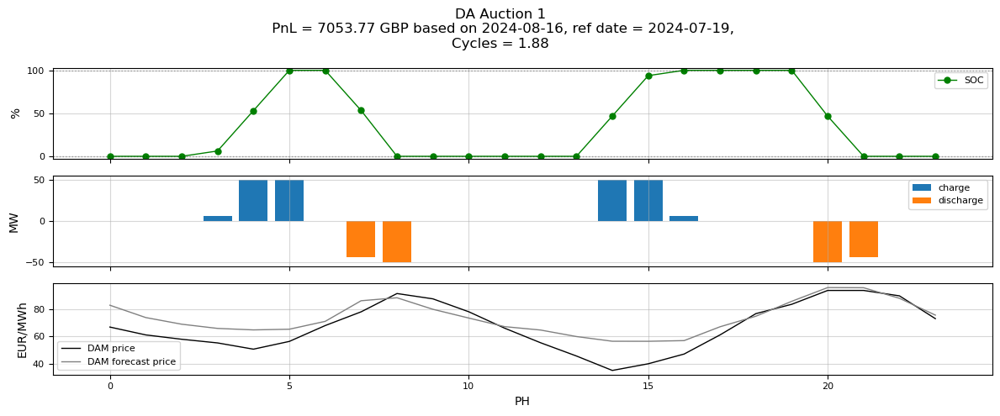

      del_date    ref_date   pnl_da
15  2024-08-16  2024-07-19  7053.77


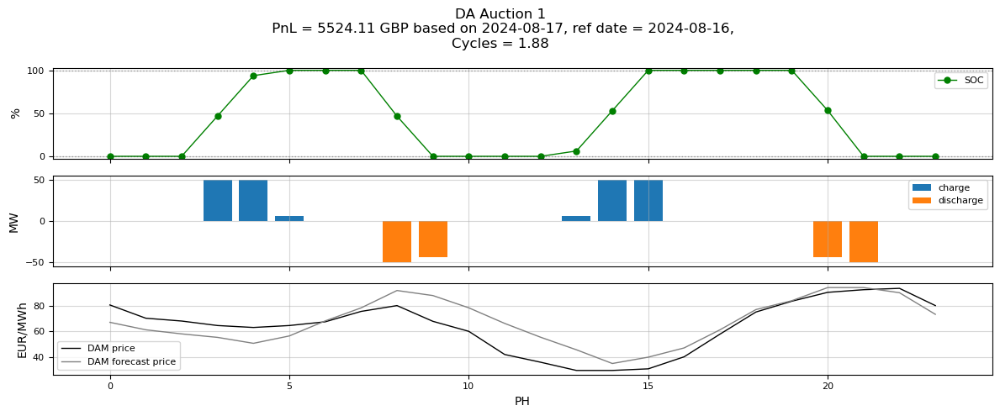

      del_date    ref_date   pnl_da
16  2024-08-17  2024-08-16  5524.11


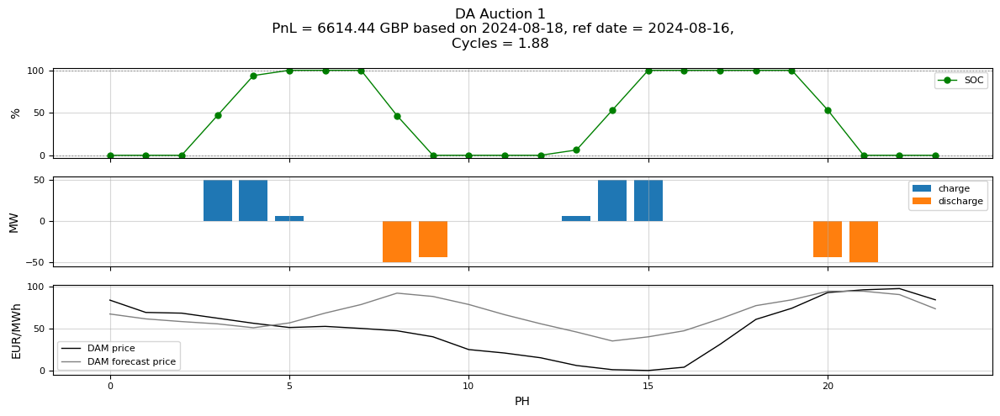

      del_date    ref_date   pnl_da
17  2024-08-18  2024-08-16  6614.44


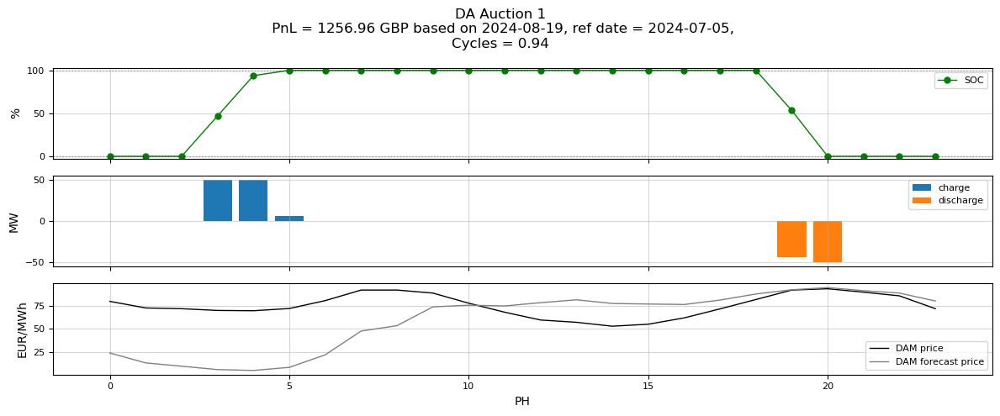

      del_date    ref_date   pnl_da
18  2024-08-19  2024-07-05  1256.96


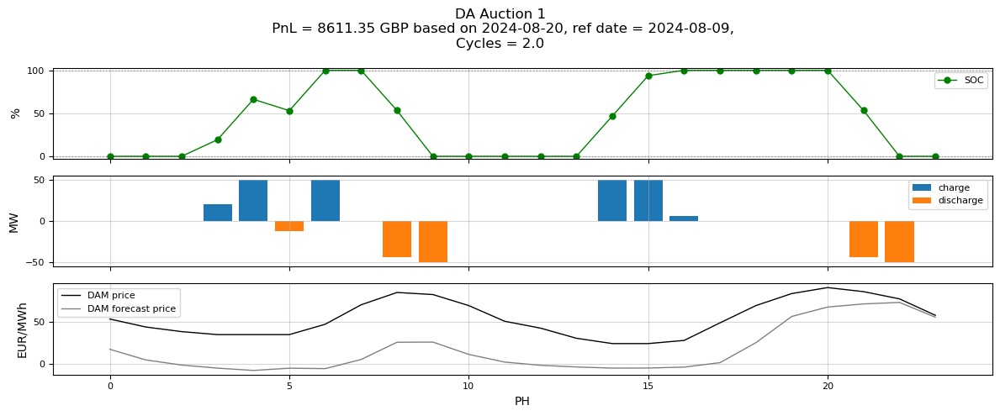

      del_date    ref_date   pnl_da
19  2024-08-20  2024-08-09  8611.35


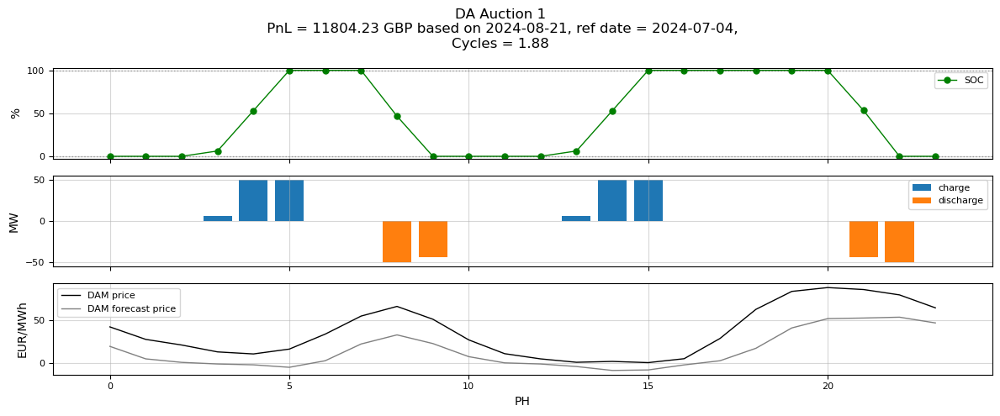

      del_date    ref_date    pnl_da
20  2024-08-21  2024-07-04  11804.23


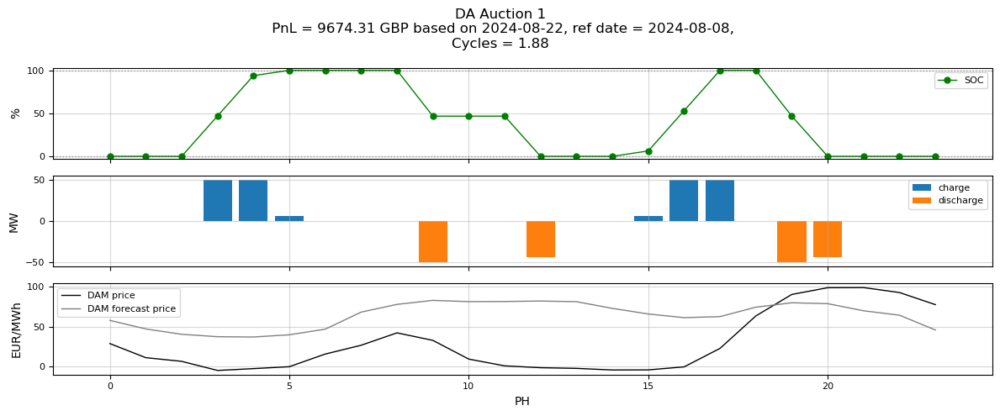

      del_date    ref_date   pnl_da
21  2024-08-22  2024-08-08  9674.31


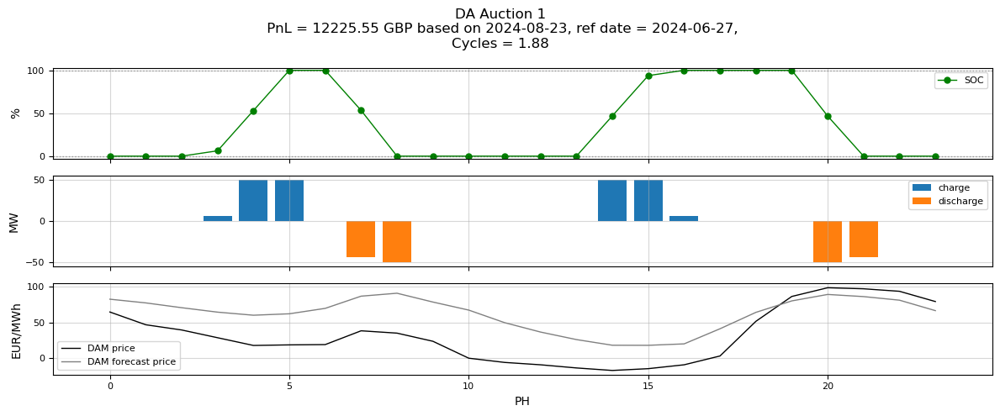

      del_date    ref_date    pnl_da
22  2024-08-23  2024-06-27  12225.55


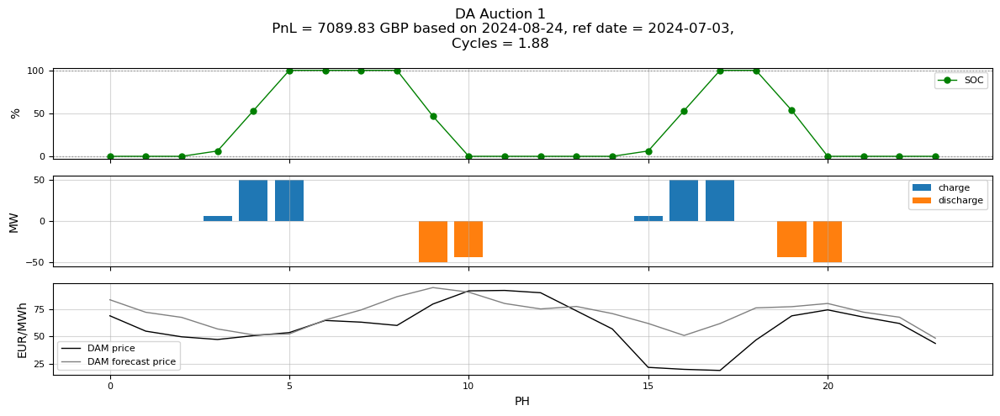

      del_date    ref_date   pnl_da
23  2024-08-24  2024-07-03  7089.83


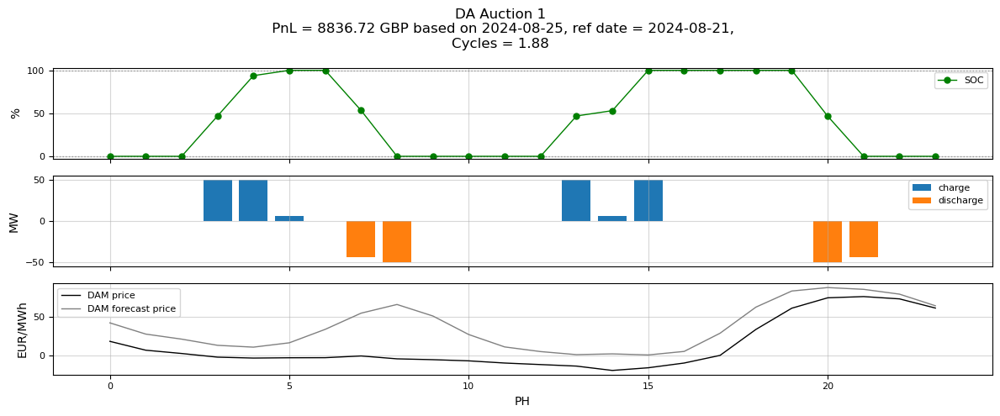

      del_date    ref_date   pnl_da
24  2024-08-25  2024-08-21  8836.72


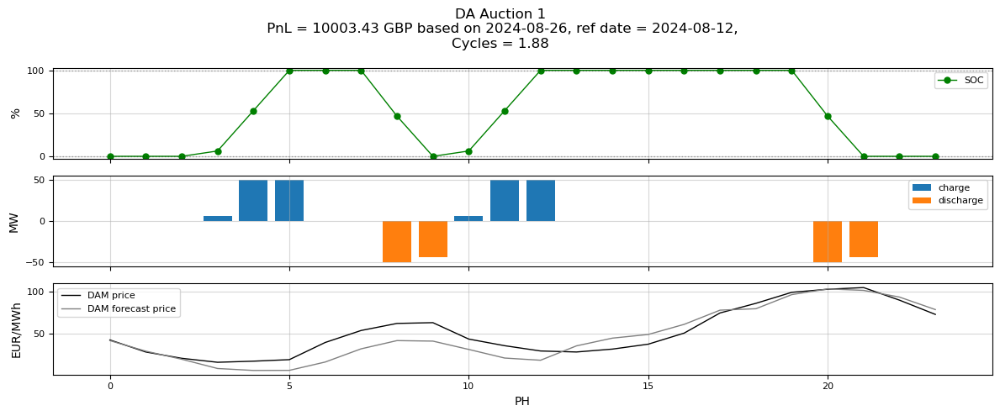

      del_date    ref_date    pnl_da
25  2024-08-26  2024-08-12  10003.43


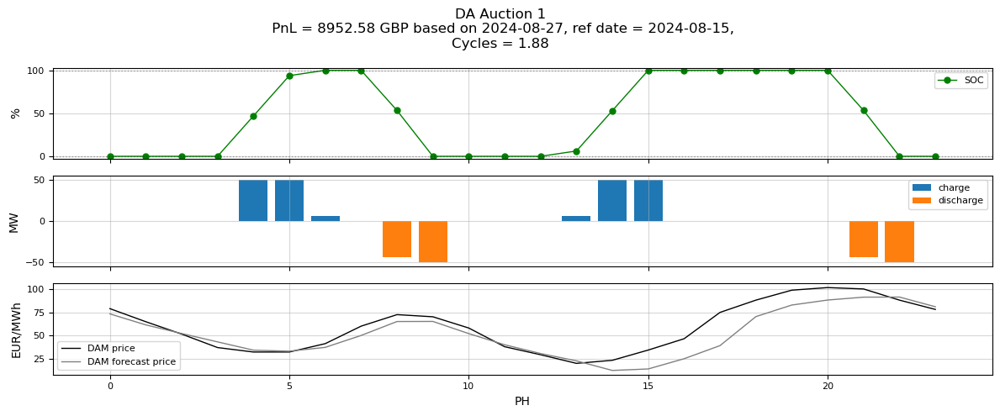

      del_date    ref_date   pnl_da
26  2024-08-27  2024-08-15  8952.58


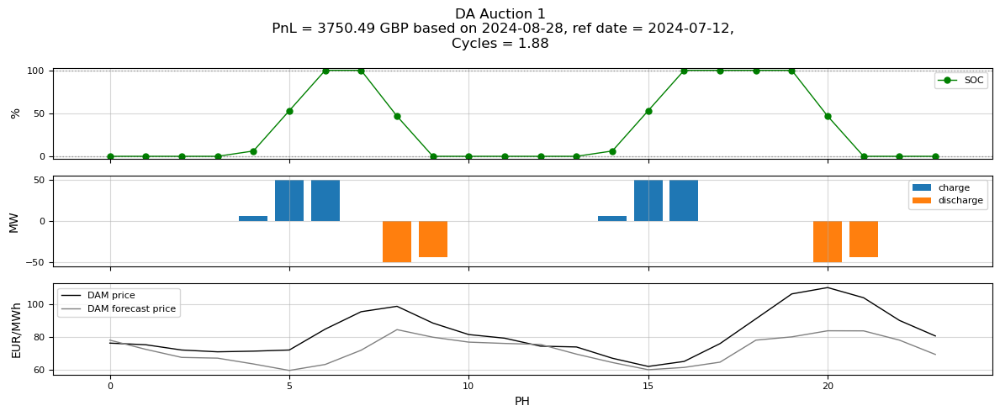

      del_date    ref_date   pnl_da
27  2024-08-28  2024-07-12  3750.49


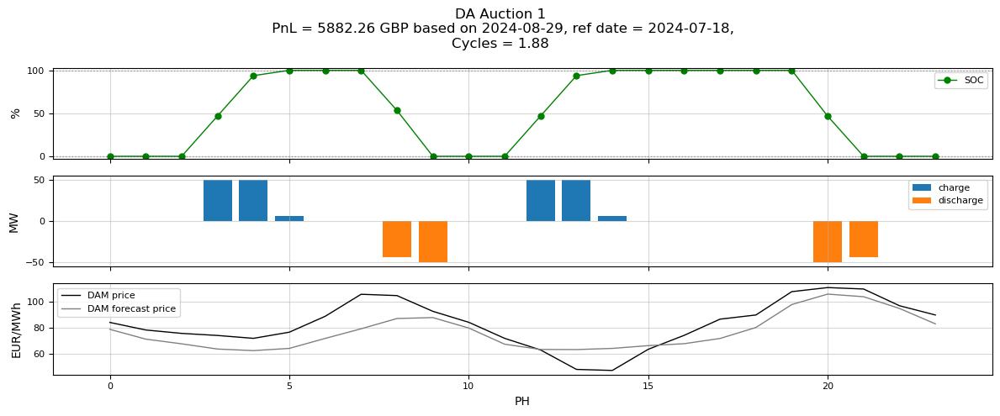

      del_date    ref_date   pnl_da
28  2024-08-29  2024-07-18  5882.26


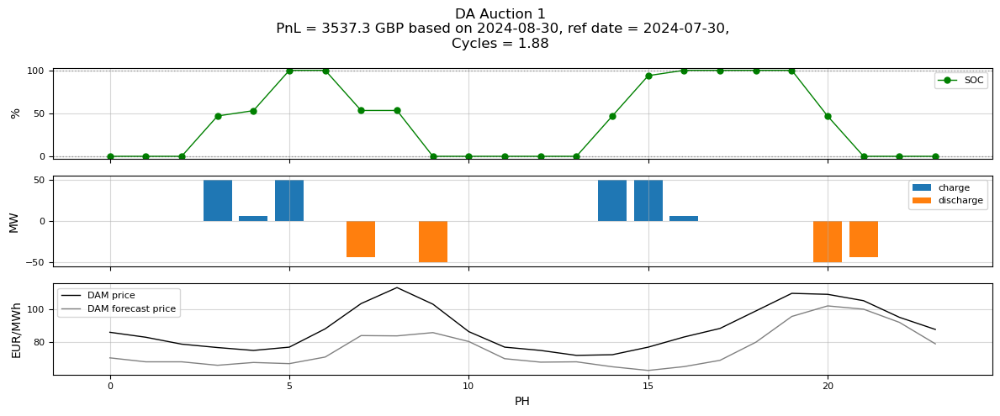

      del_date    ref_date  pnl_da
29  2024-08-30  2024-07-30  3537.3


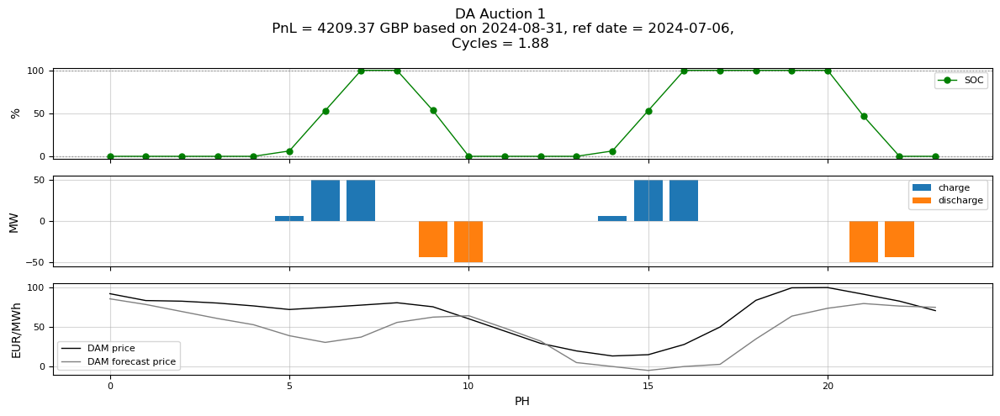

      del_date    ref_date   pnl_da
30  2024-08-31  2024-07-06  4209.37


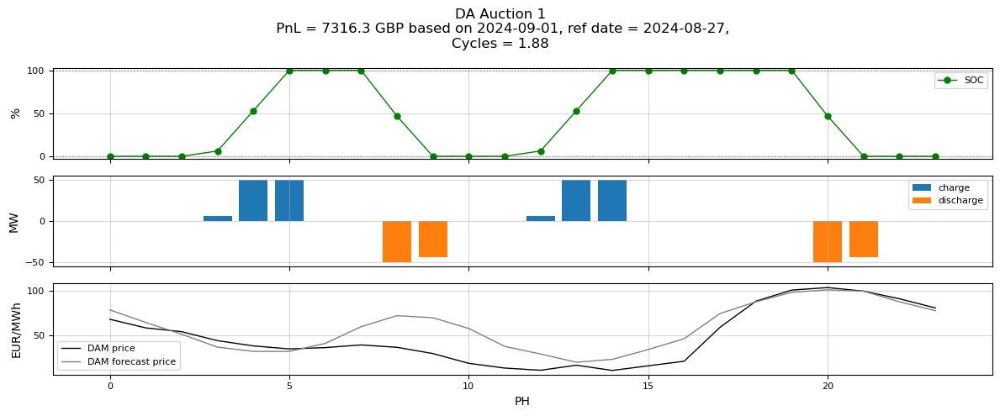

      del_date    ref_date  pnl_da
31  2024-09-01  2024-08-27  7316.3


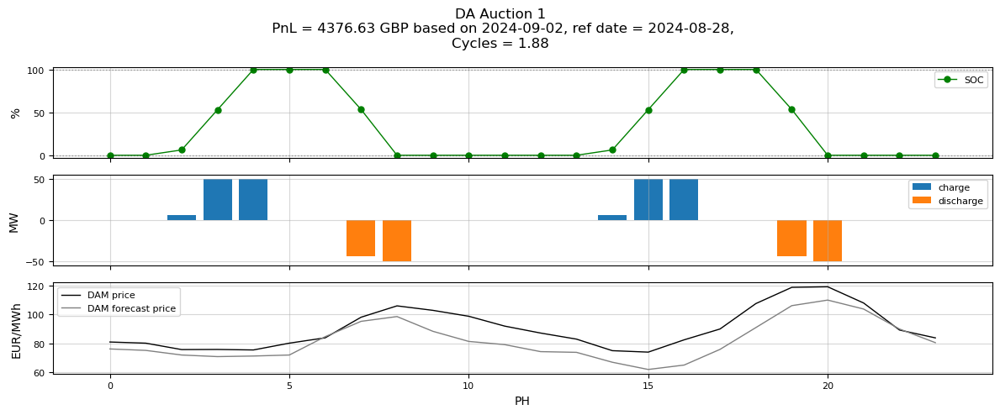

      del_date    ref_date   pnl_da
32  2024-09-02  2024-08-28  4376.63


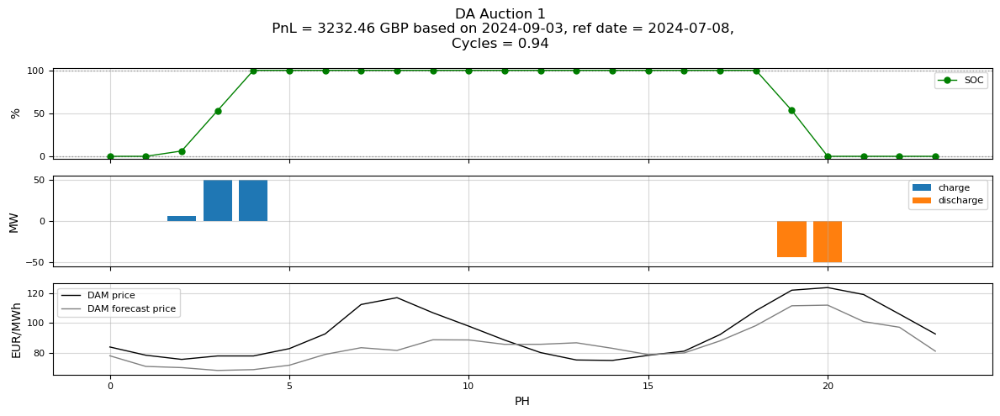

      del_date    ref_date   pnl_da
33  2024-09-03  2024-07-08  3232.46


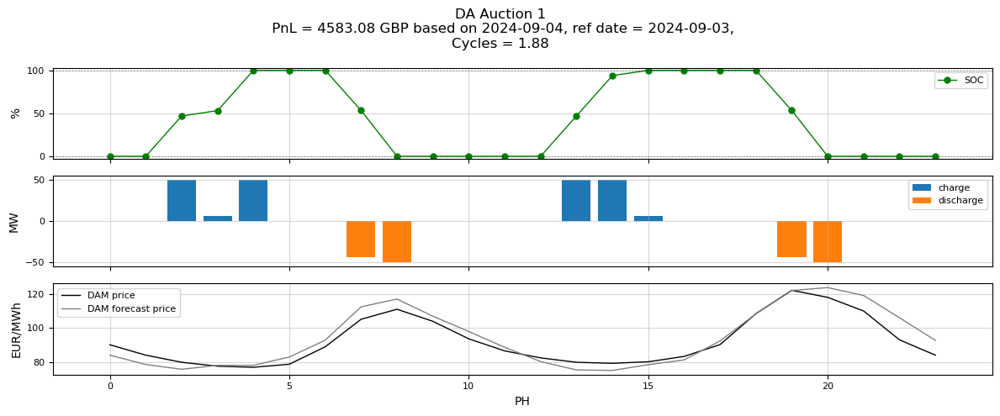

      del_date    ref_date   pnl_da
34  2024-09-04  2024-09-03  4583.08


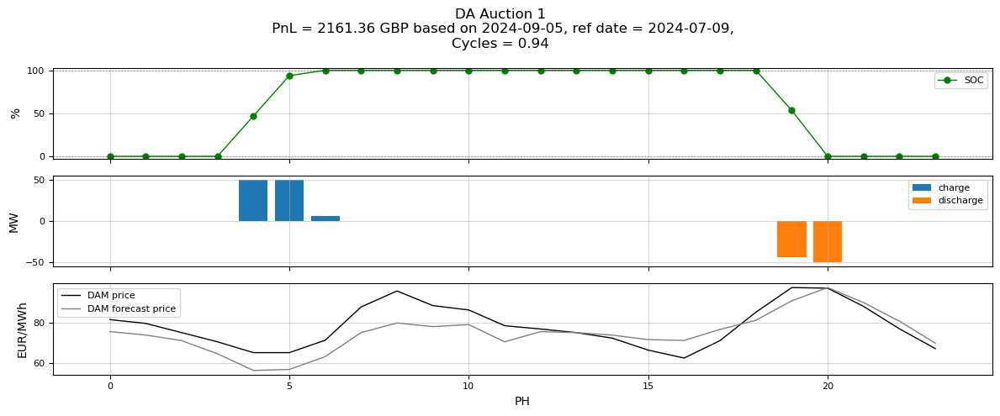

      del_date    ref_date   pnl_da
35  2024-09-05  2024-07-09  2161.36


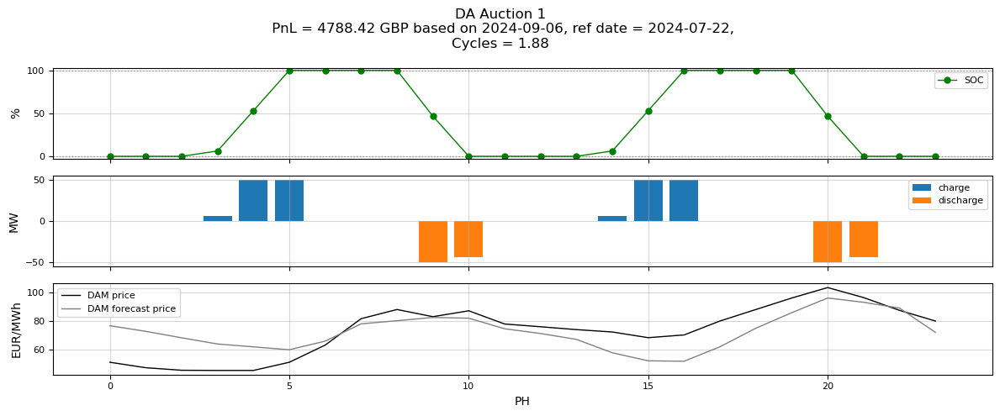

      del_date    ref_date   pnl_da
36  2024-09-06  2024-07-22  4788.42


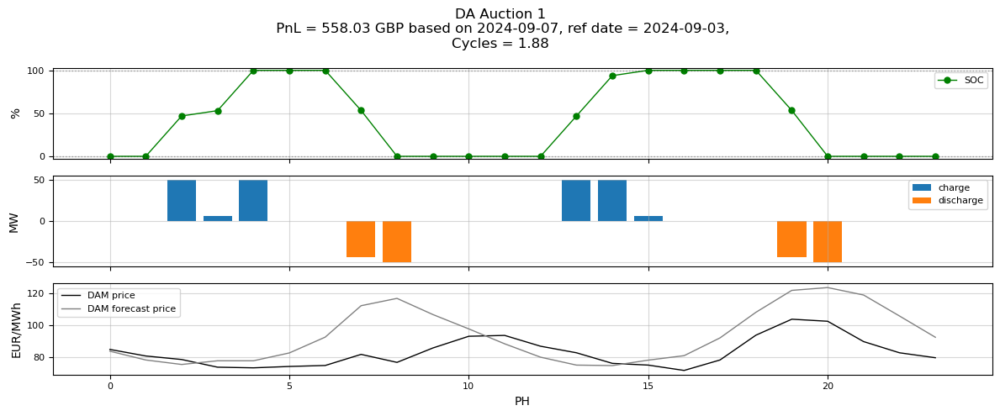

      del_date    ref_date  pnl_da
37  2024-09-07  2024-09-03  558.03


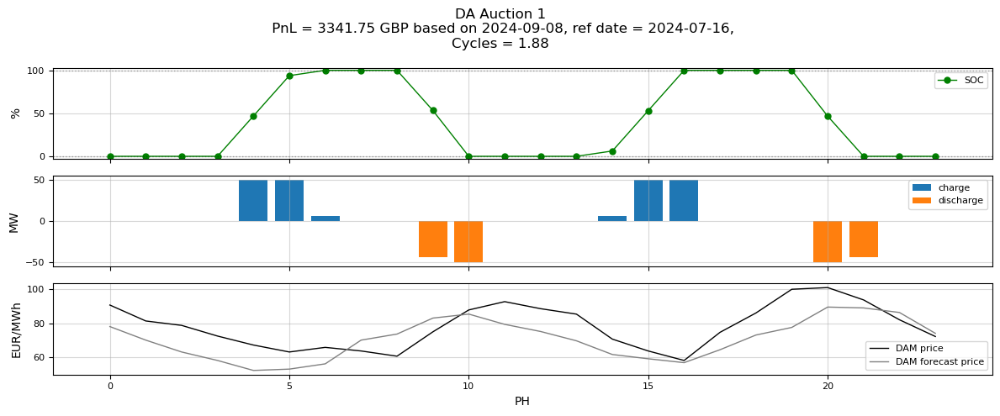

      del_date    ref_date   pnl_da
38  2024-09-08  2024-07-16  3341.75


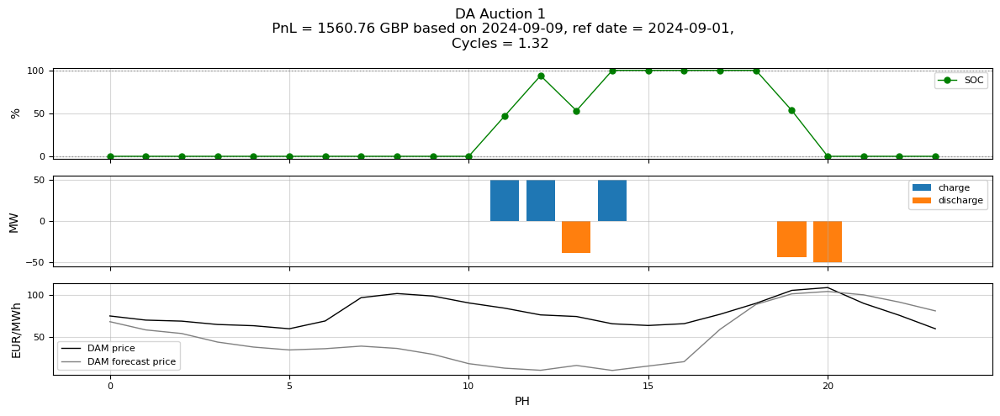

      del_date    ref_date   pnl_da
39  2024-09-09  2024-09-01  1560.76


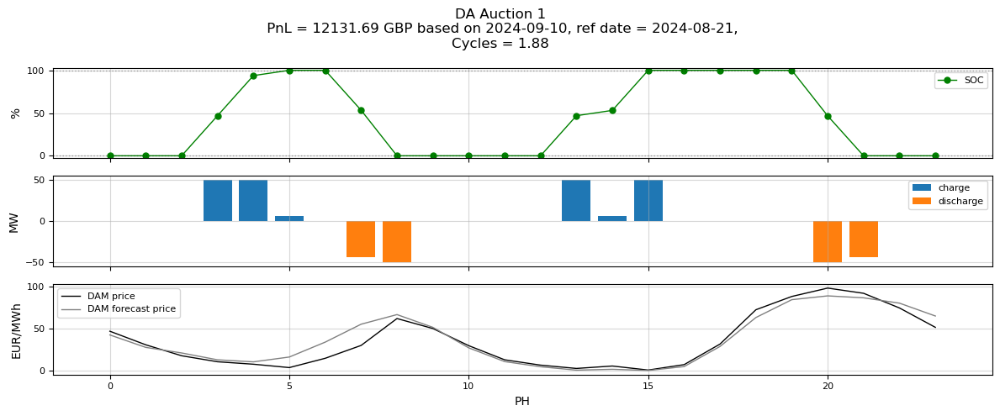

      del_date    ref_date    pnl_da
40  2024-09-10  2024-08-21  12131.69


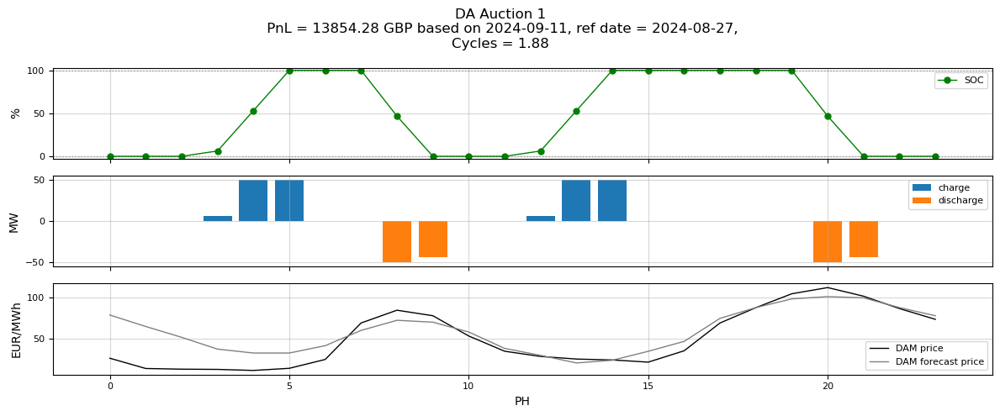

      del_date    ref_date    pnl_da
41  2024-09-11  2024-08-27  13854.28


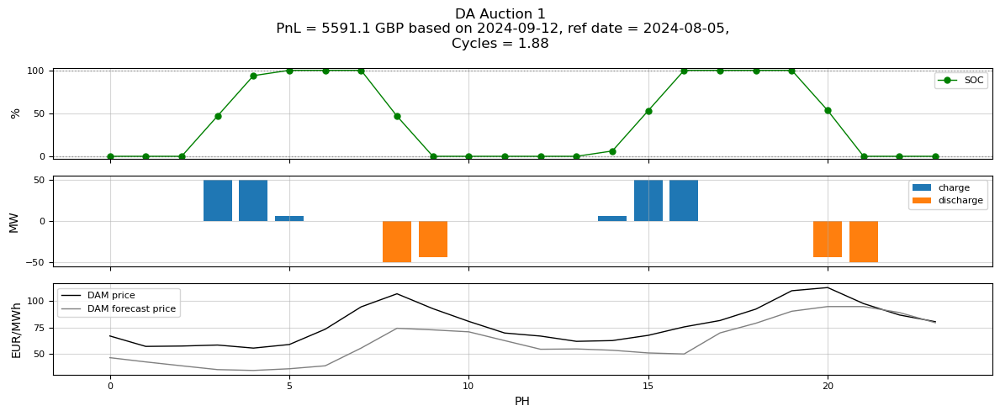

      del_date    ref_date  pnl_da
42  2024-09-12  2024-08-05  5591.1


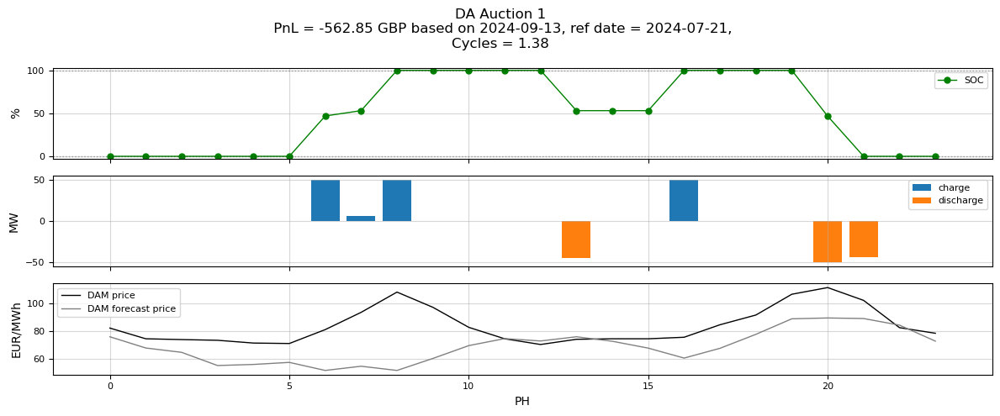

      del_date    ref_date  pnl_da
43  2024-09-13  2024-07-21 -562.85


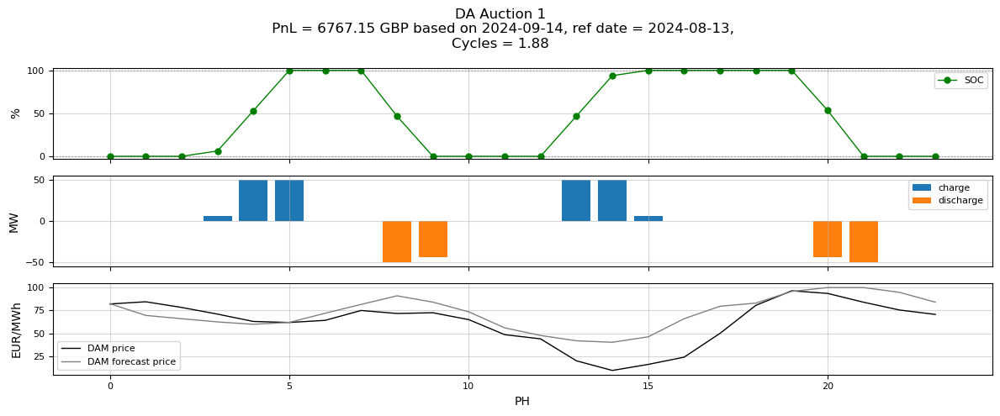

      del_date    ref_date   pnl_da
44  2024-09-14  2024-08-13  6767.15


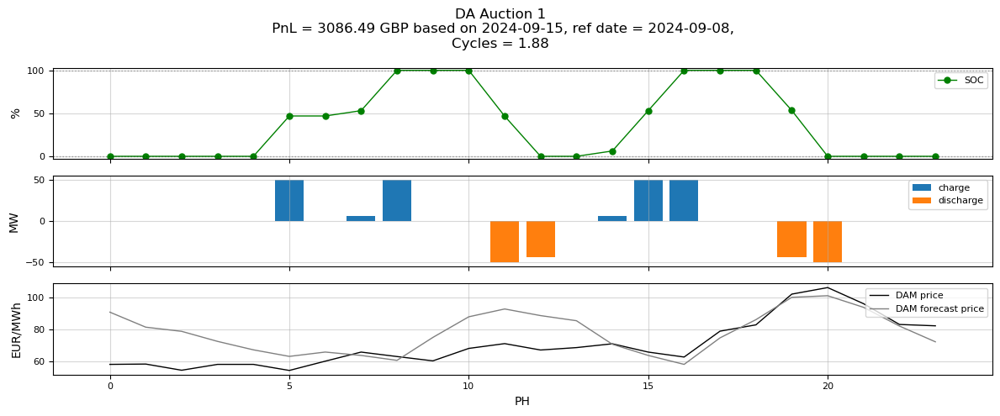

      del_date    ref_date   pnl_da
45  2024-09-15  2024-09-08  3086.49


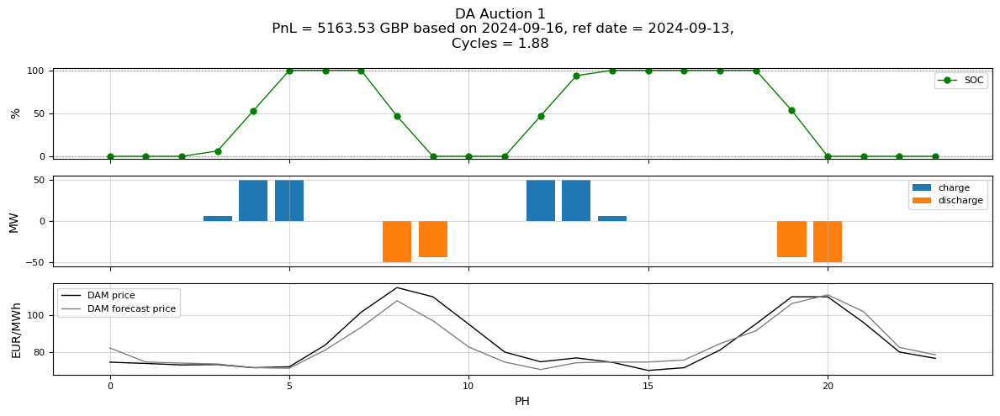

      del_date    ref_date   pnl_da
46  2024-09-16  2024-09-13  5163.53


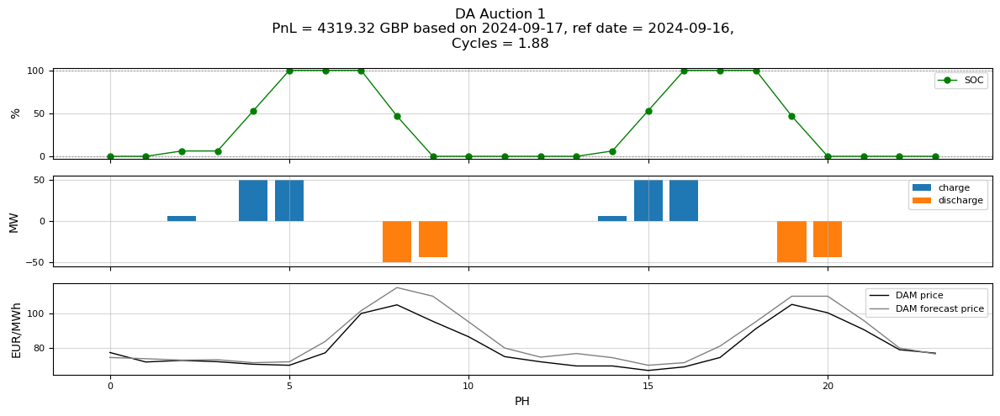

      del_date    ref_date   pnl_da
47  2024-09-17  2024-09-16  4319.32


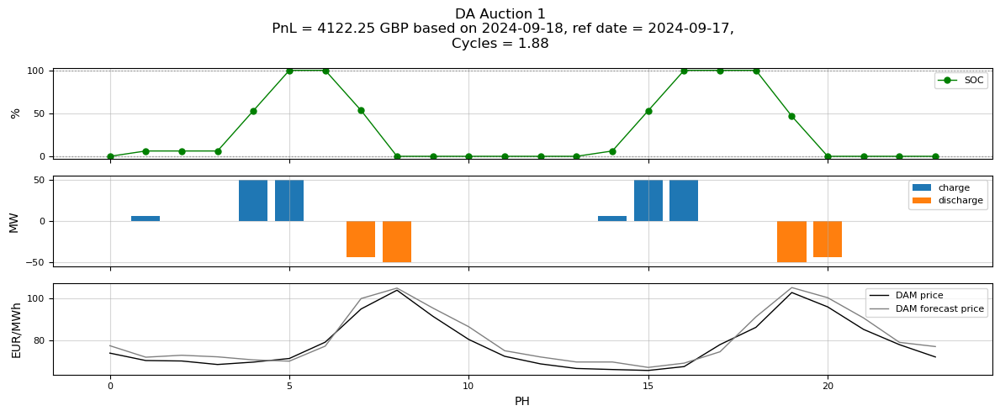

      del_date    ref_date   pnl_da
48  2024-09-18  2024-09-17  4122.25


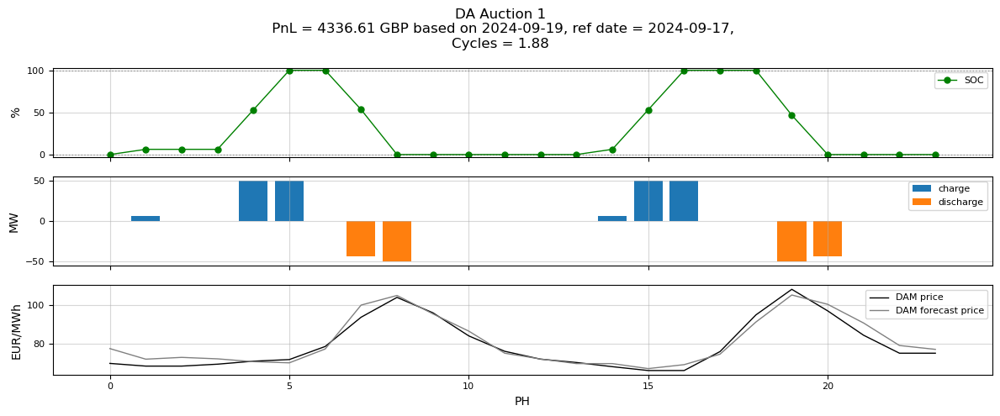

      del_date    ref_date   pnl_da
49  2024-09-19  2024-09-17  4336.61


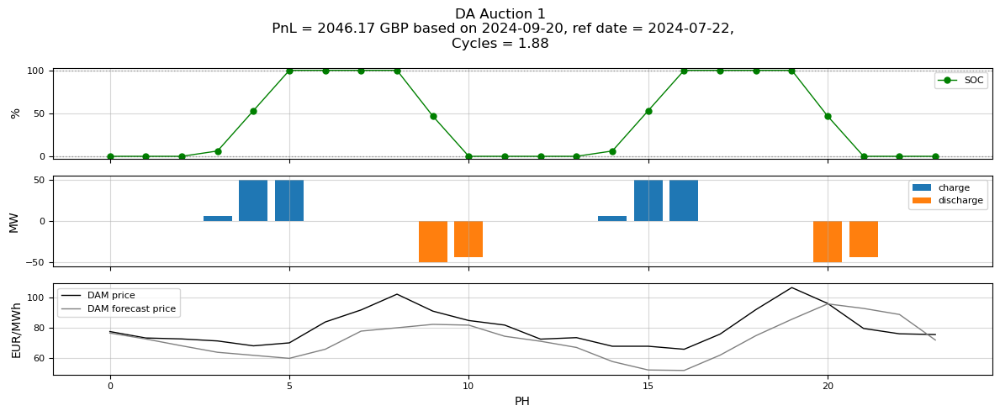

      del_date    ref_date   pnl_da
50  2024-09-20  2024-07-22  2046.17


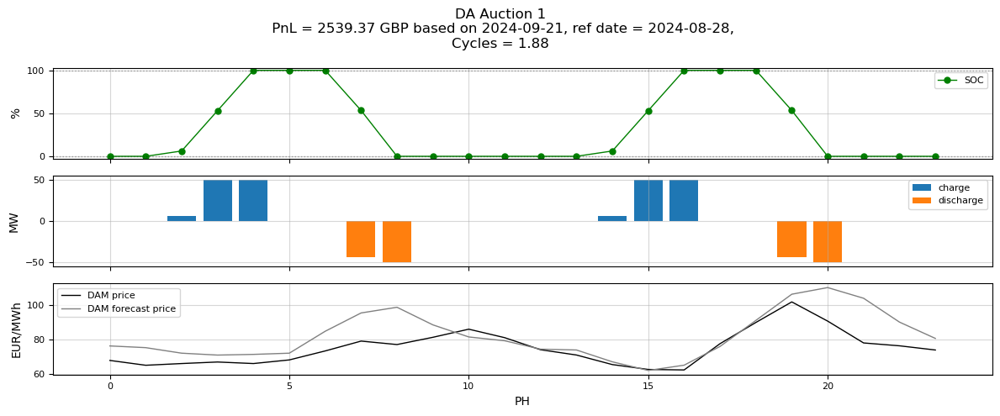

      del_date    ref_date   pnl_da
51  2024-09-21  2024-08-28  2539.37


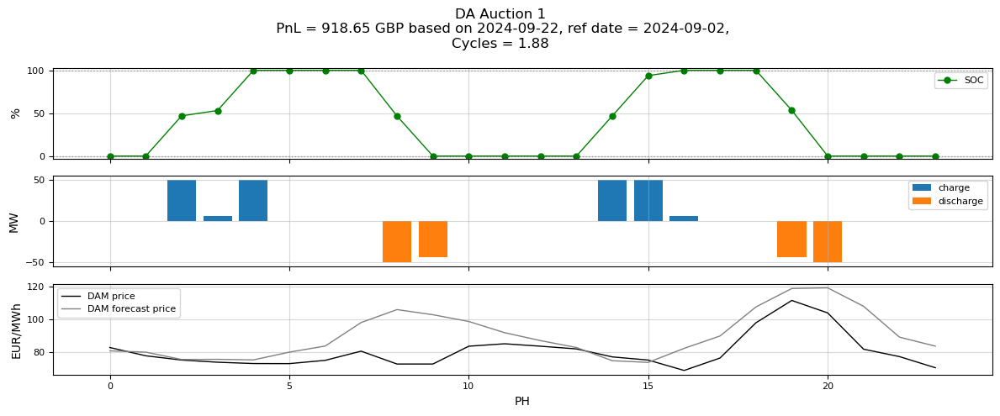

      del_date    ref_date  pnl_da
52  2024-09-22  2024-09-02  918.65


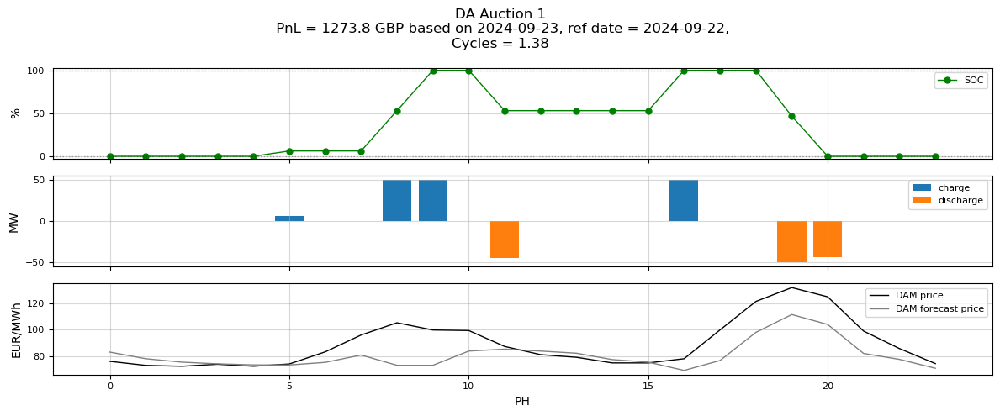

      del_date    ref_date  pnl_da
53  2024-09-23  2024-09-22  1273.8


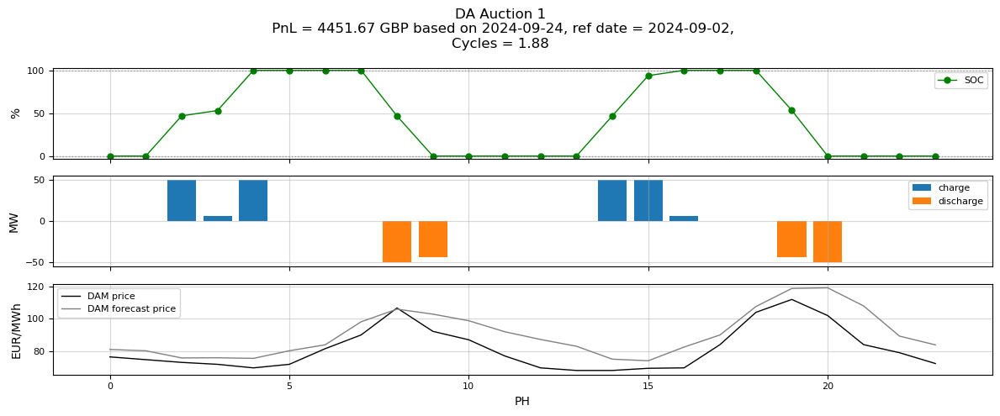

      del_date    ref_date   pnl_da
54  2024-09-24  2024-09-02  4451.67


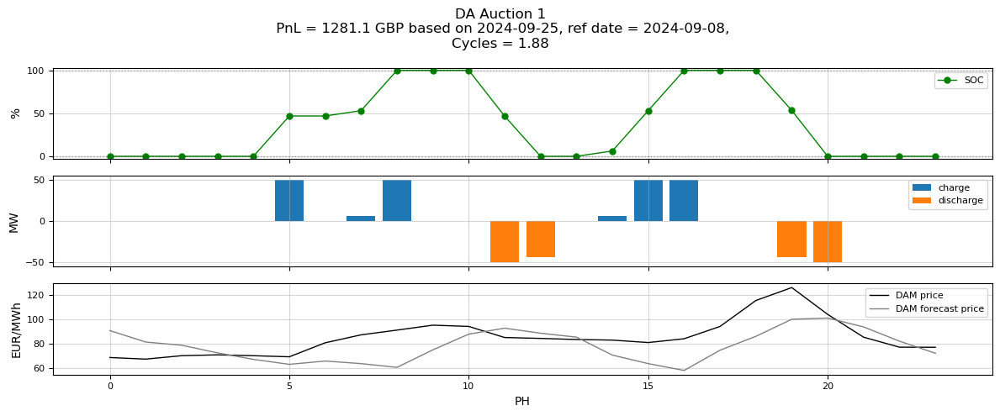

      del_date    ref_date  pnl_da
55  2024-09-25  2024-09-08  1281.1


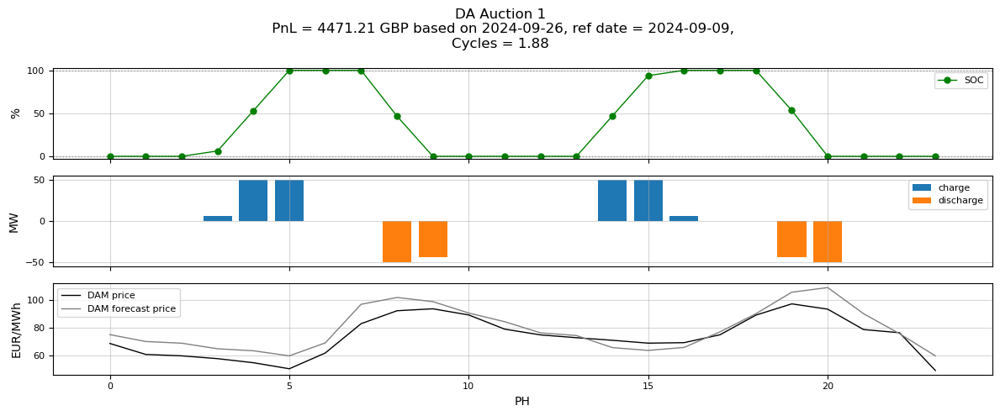

      del_date    ref_date   pnl_da
56  2024-09-26  2024-09-09  4471.21


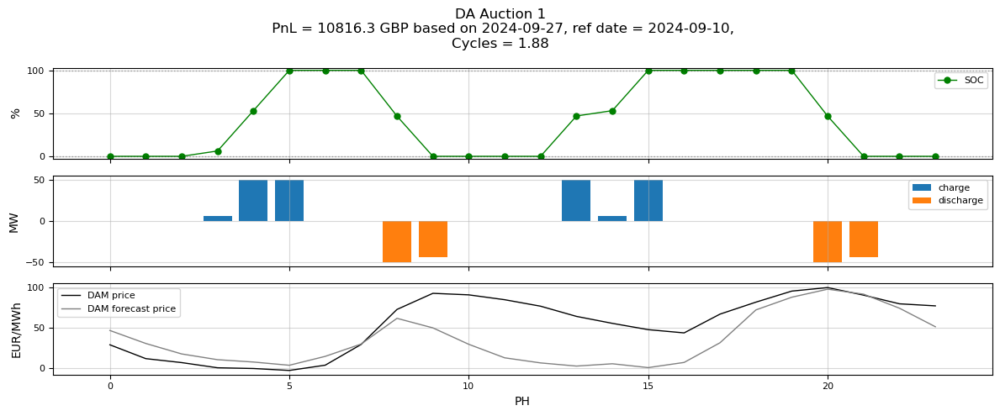

      del_date    ref_date   pnl_da
57  2024-09-27  2024-09-10  10816.3


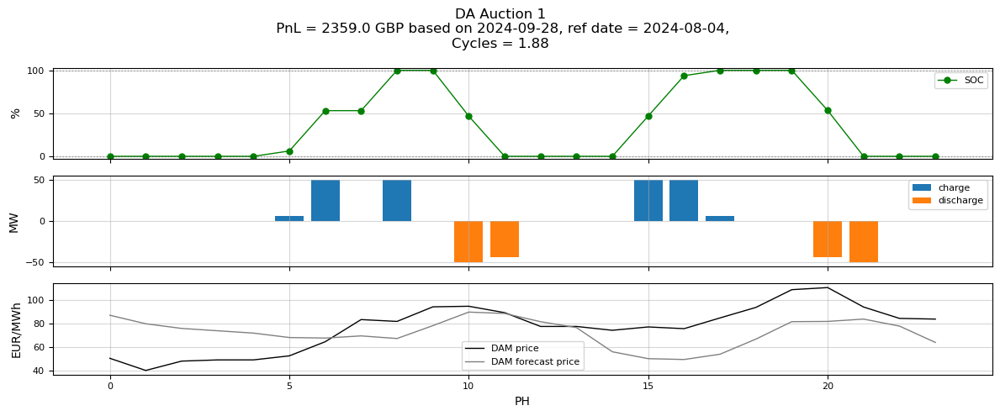

      del_date    ref_date  pnl_da
58  2024-09-28  2024-08-04  2359.0


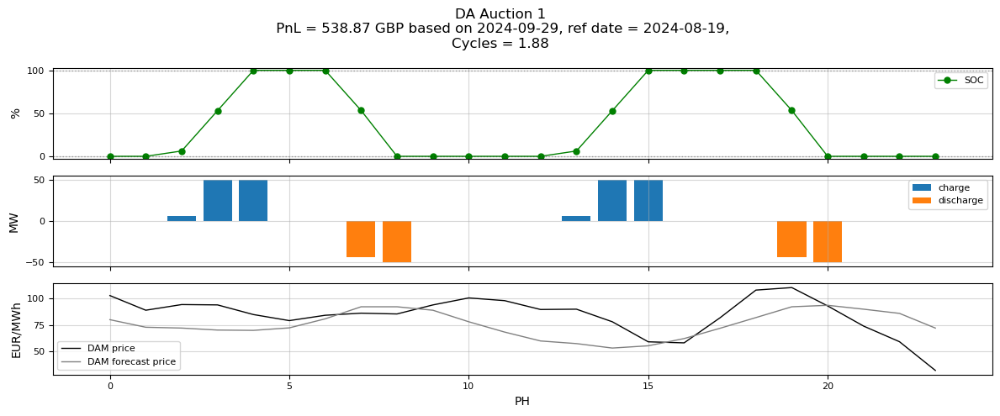

      del_date    ref_date  pnl_da
59  2024-09-29  2024-08-19  538.87


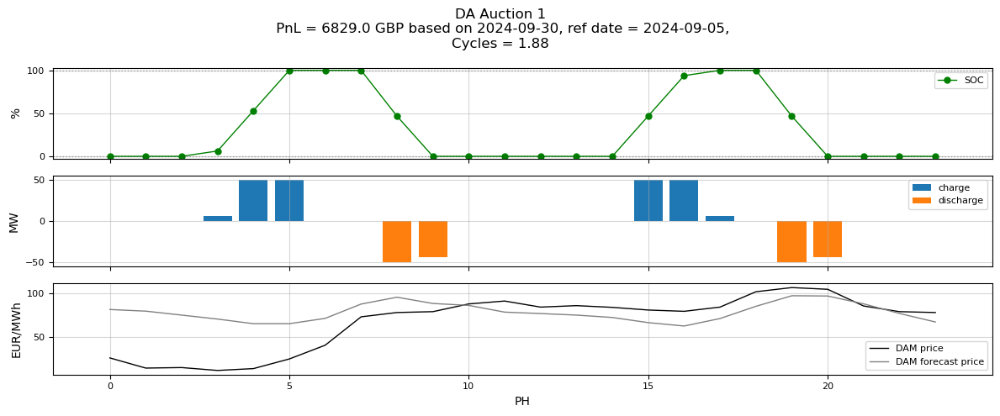

      del_date    ref_date  pnl_da
60  2024-09-30  2024-09-05  6829.0


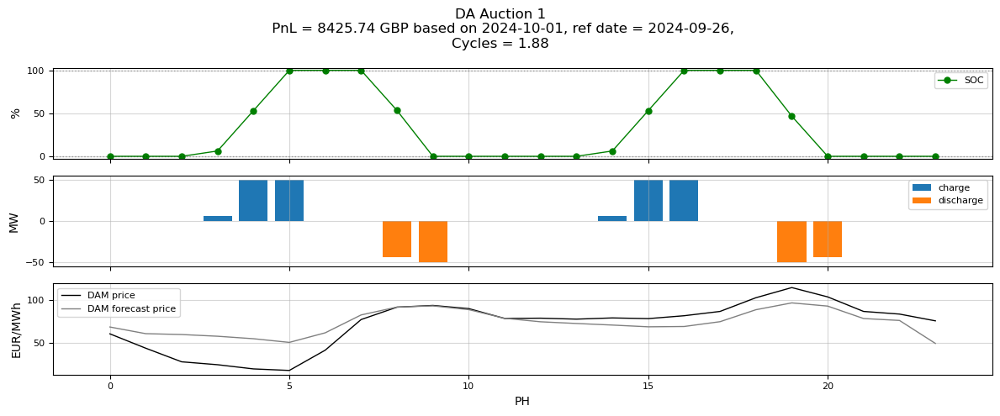

      del_date    ref_date   pnl_da
61  2024-10-01  2024-09-26  8425.74


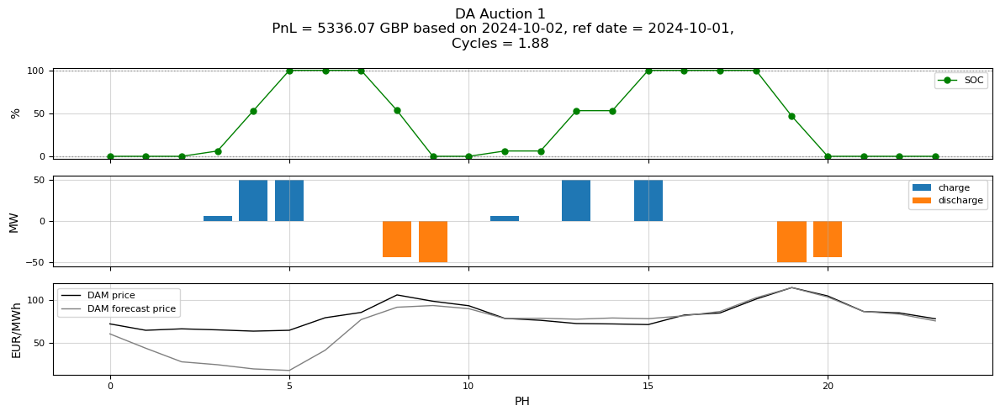

      del_date    ref_date   pnl_da
62  2024-10-02  2024-10-01  5336.07


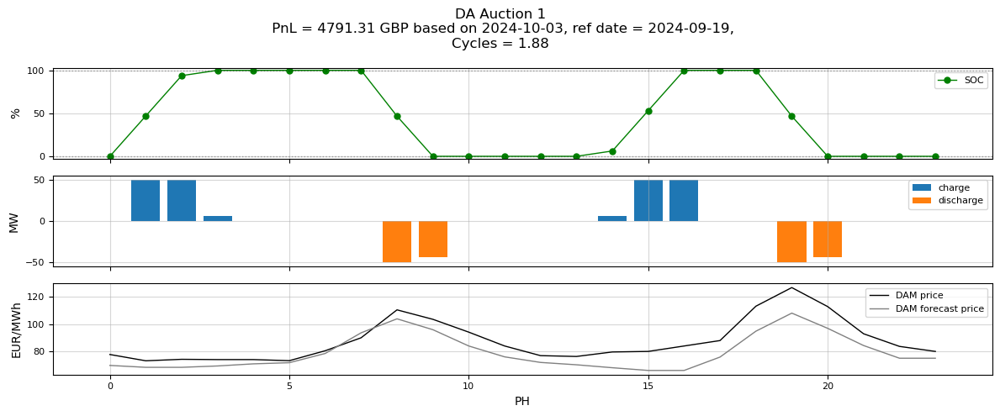

      del_date    ref_date   pnl_da
63  2024-10-03  2024-09-19  4791.31


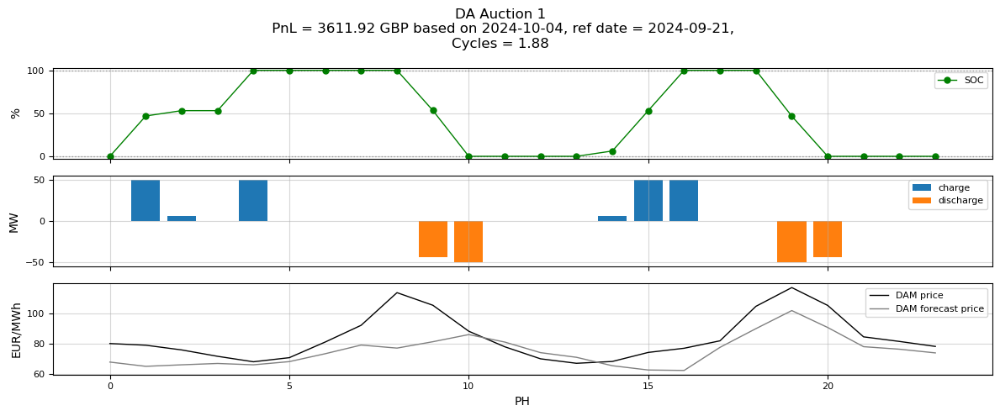

      del_date    ref_date   pnl_da
64  2024-10-04  2024-09-21  3611.92


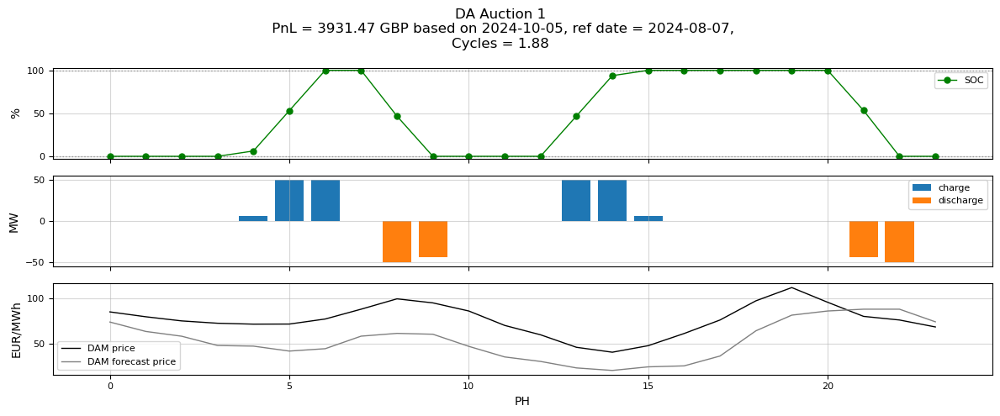

      del_date    ref_date   pnl_da
65  2024-10-05  2024-08-07  3931.47


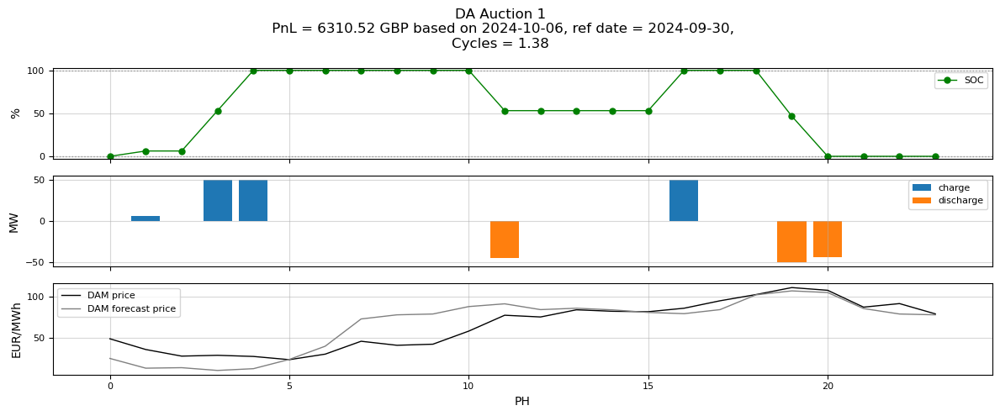

      del_date    ref_date   pnl_da
66  2024-10-06  2024-09-30  6310.52


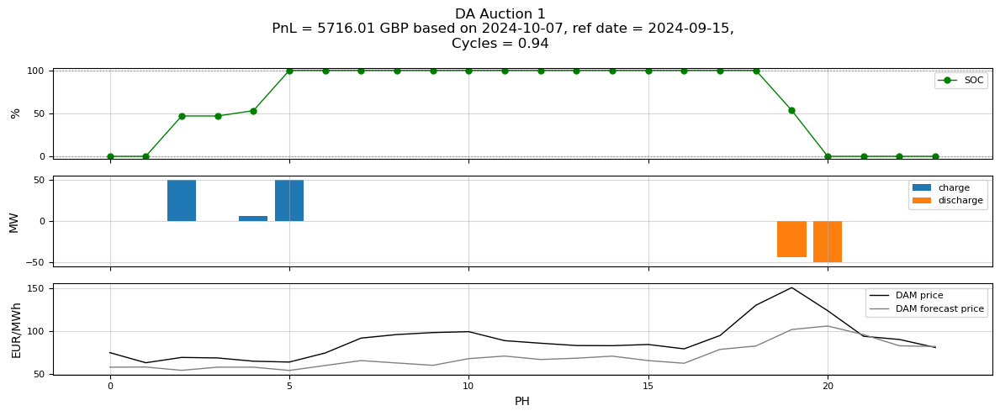

      del_date    ref_date   pnl_da
67  2024-10-07  2024-09-15  5716.01


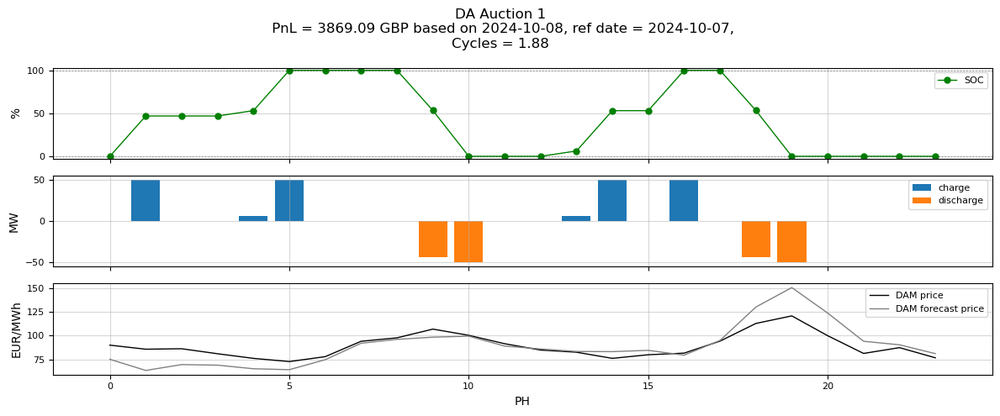

      del_date    ref_date   pnl_da
68  2024-10-08  2024-10-07  3869.09


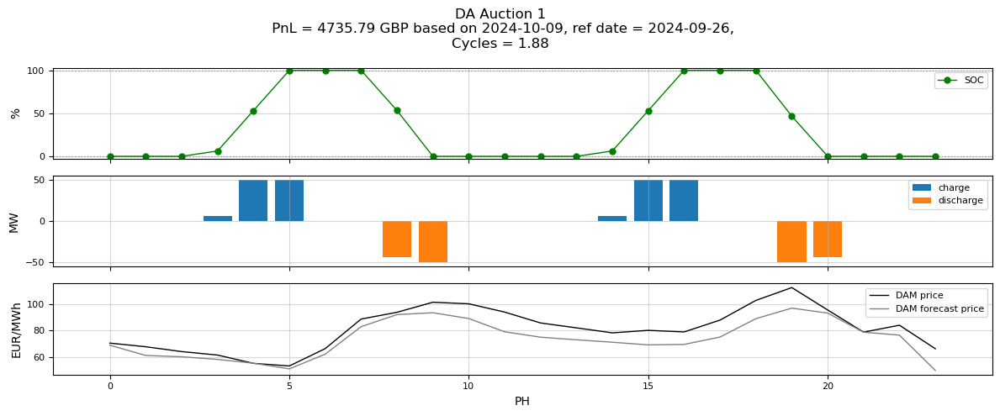

      del_date    ref_date   pnl_da
69  2024-10-09  2024-09-26  4735.79


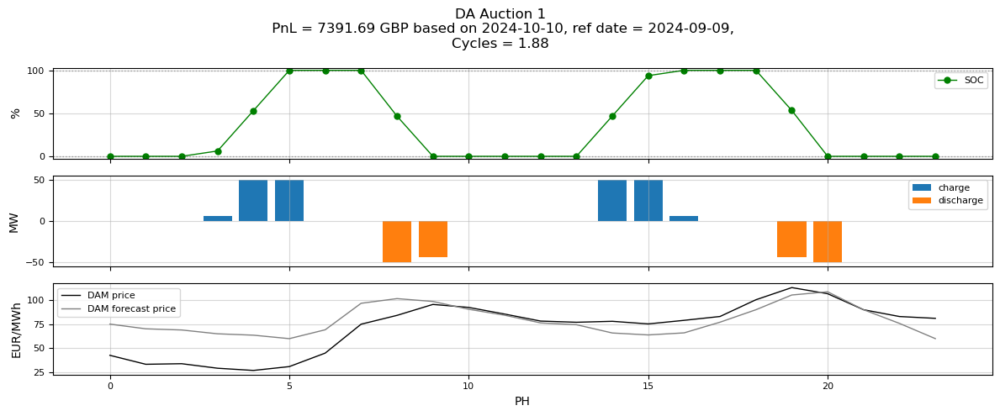

      del_date    ref_date   pnl_da
70  2024-10-10  2024-09-09  7391.69


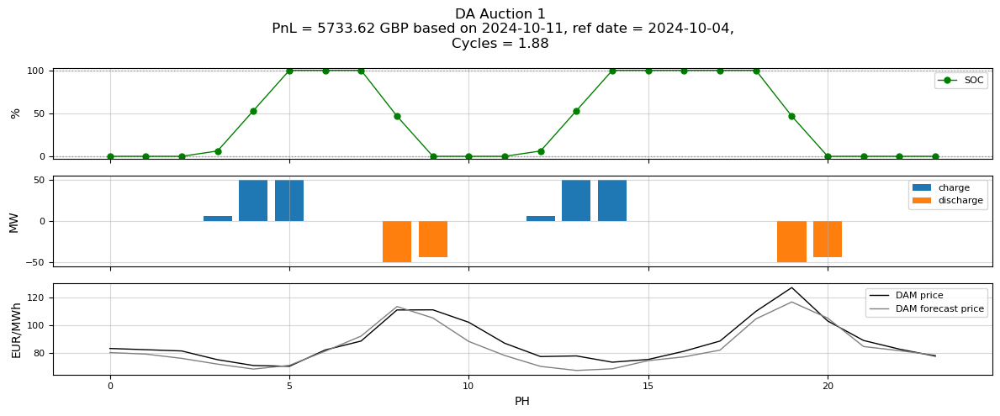

      del_date    ref_date   pnl_da
71  2024-10-11  2024-10-04  5733.62


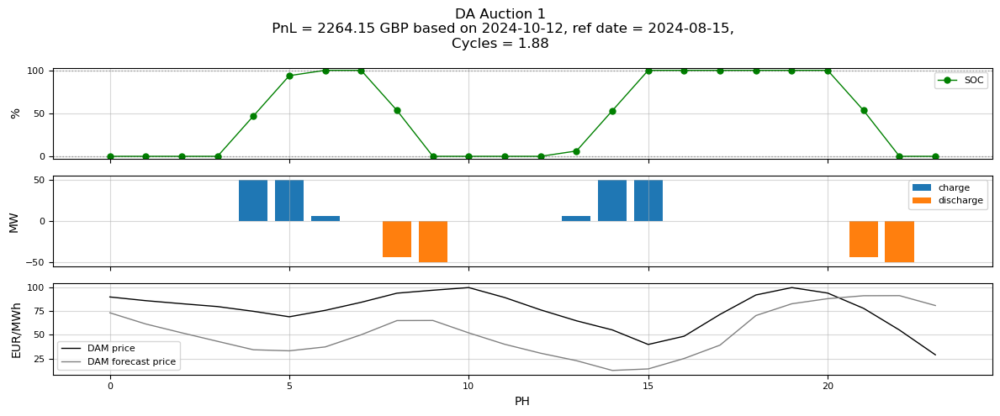

      del_date    ref_date   pnl_da
72  2024-10-12  2024-08-15  2264.15


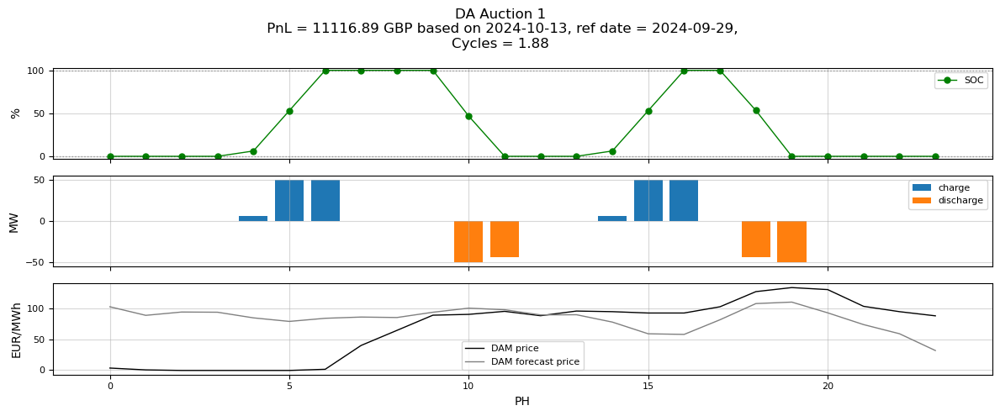

      del_date    ref_date    pnl_da
73  2024-10-13  2024-09-29  11116.89


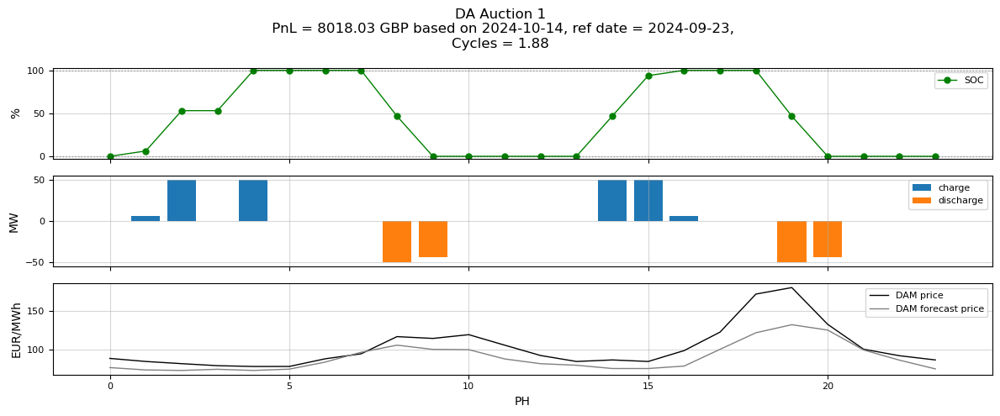

      del_date    ref_date   pnl_da
74  2024-10-14  2024-09-23  8018.03


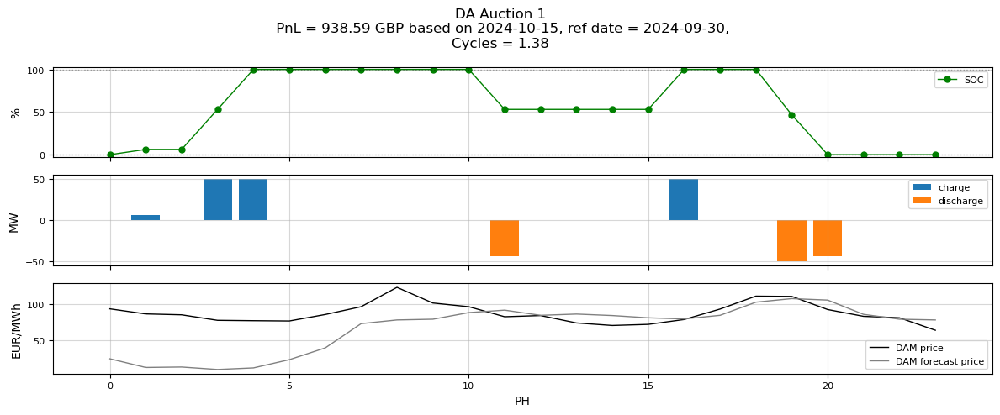

      del_date    ref_date  pnl_da
75  2024-10-15  2024-09-30  938.59


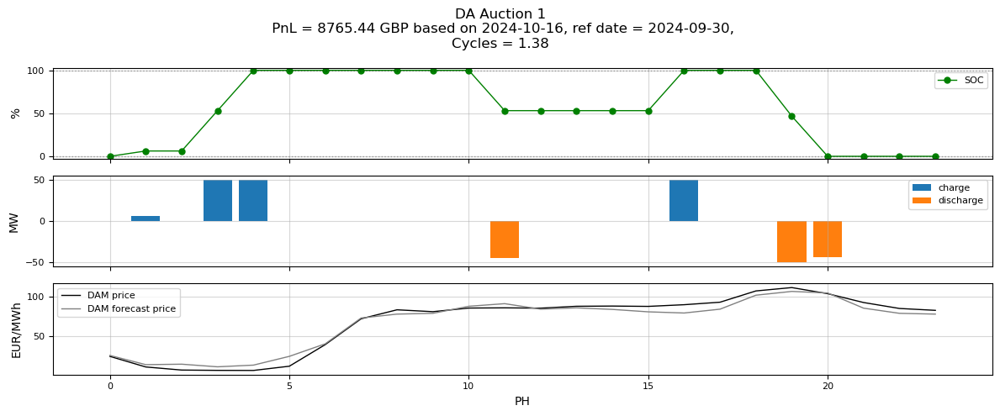

      del_date    ref_date   pnl_da
76  2024-10-16  2024-09-30  8765.44


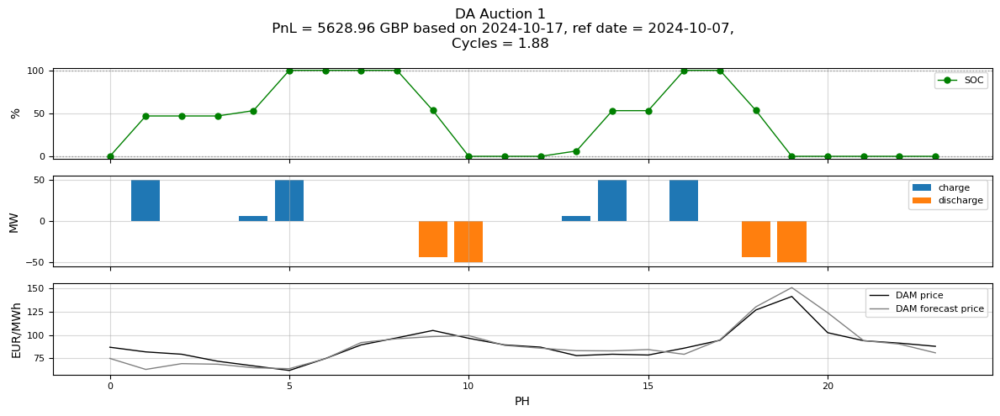

      del_date    ref_date   pnl_da
77  2024-10-17  2024-10-07  5628.96


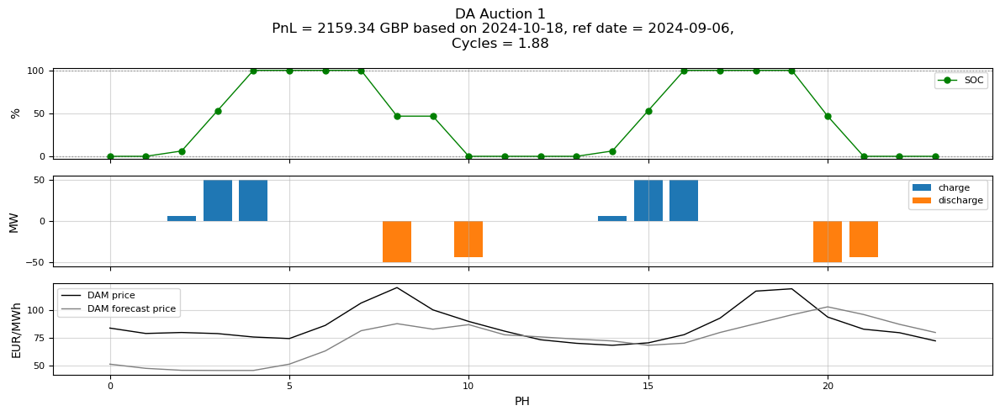

      del_date    ref_date   pnl_da
78  2024-10-18  2024-09-06  2159.34


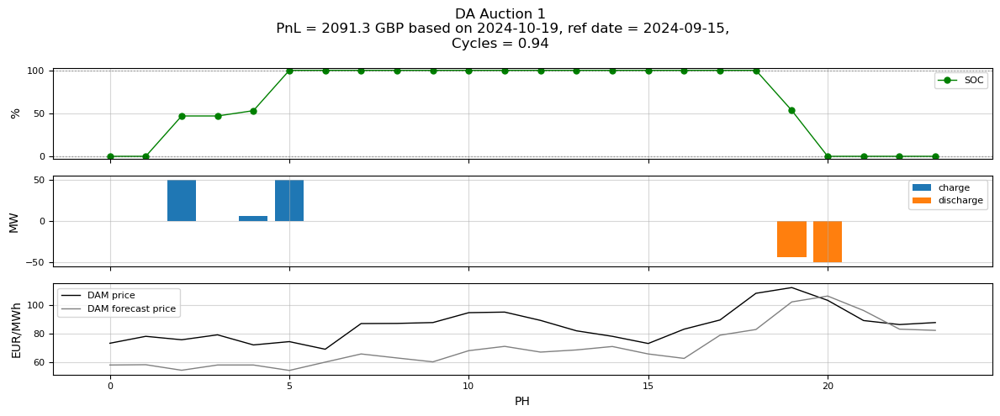

      del_date    ref_date  pnl_da
79  2024-10-19  2024-09-15  2091.3


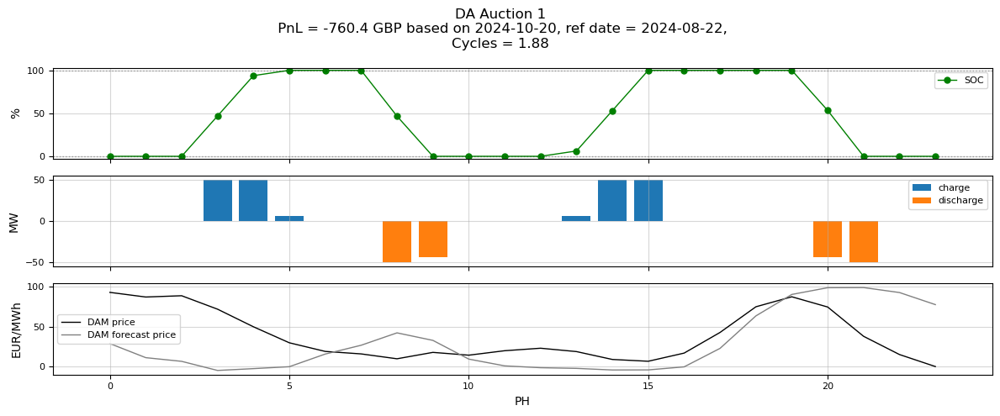

      del_date    ref_date  pnl_da
80  2024-10-20  2024-08-22  -760.4


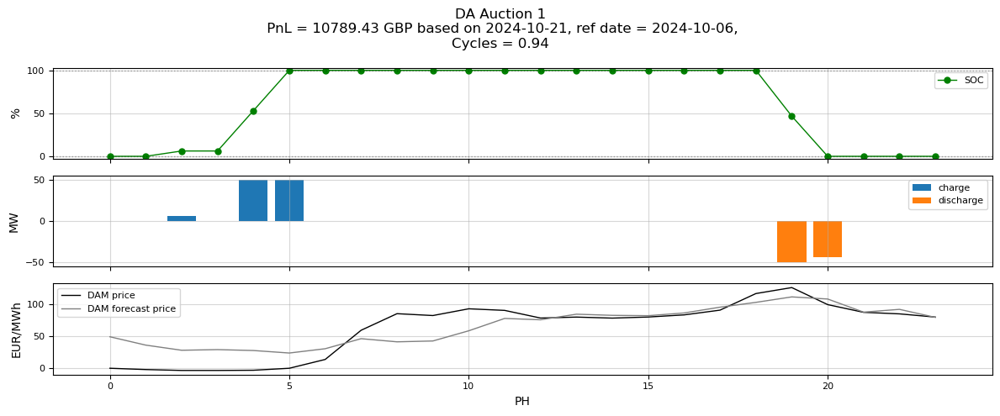

      del_date    ref_date    pnl_da
81  2024-10-21  2024-10-06  10789.43


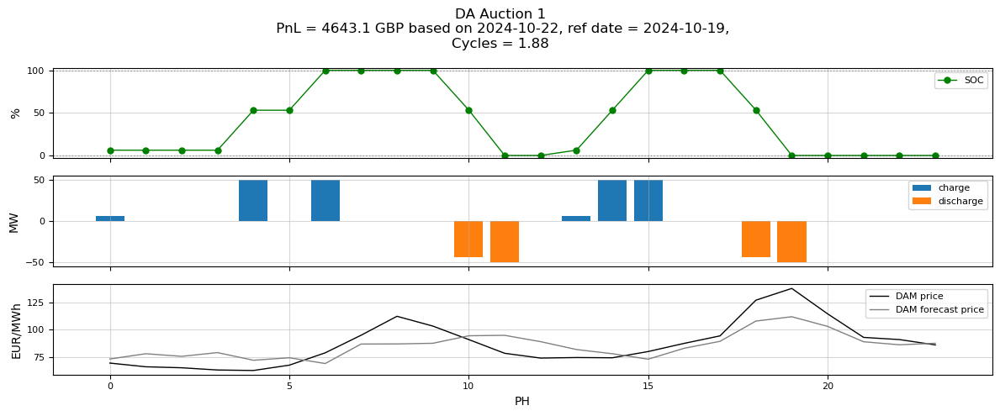

      del_date    ref_date  pnl_da
82  2024-10-22  2024-10-19  4643.1


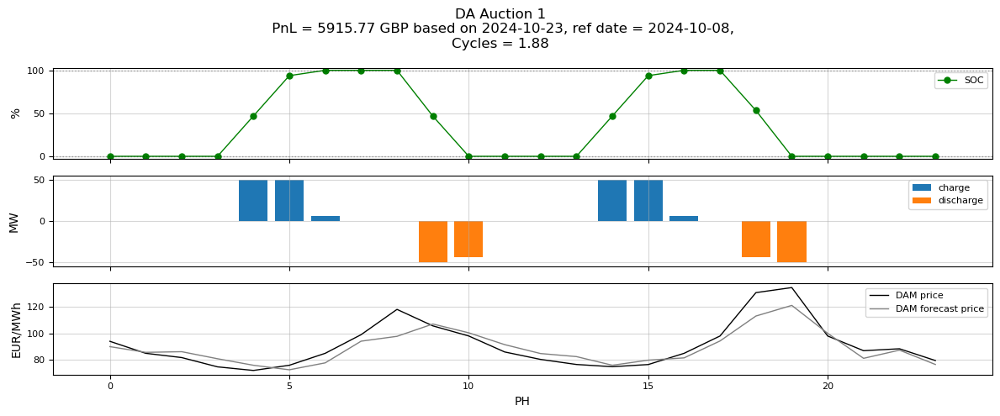

      del_date    ref_date   pnl_da
83  2024-10-23  2024-10-08  5915.77


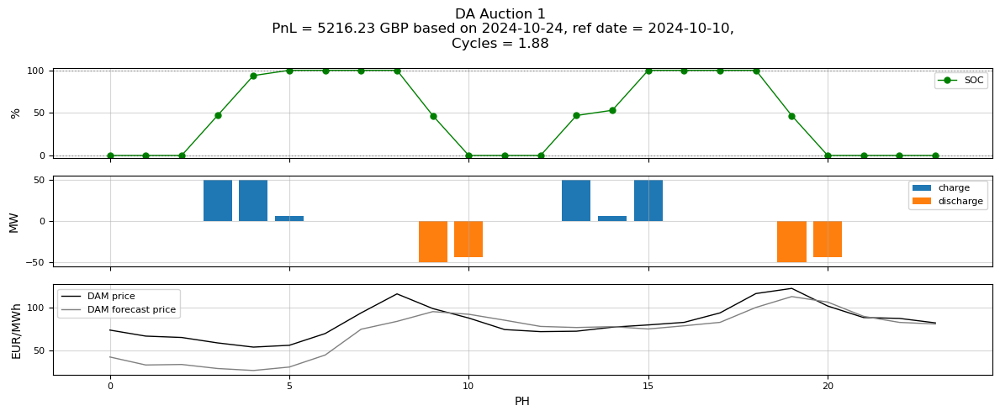

      del_date    ref_date   pnl_da
84  2024-10-24  2024-10-10  5216.23


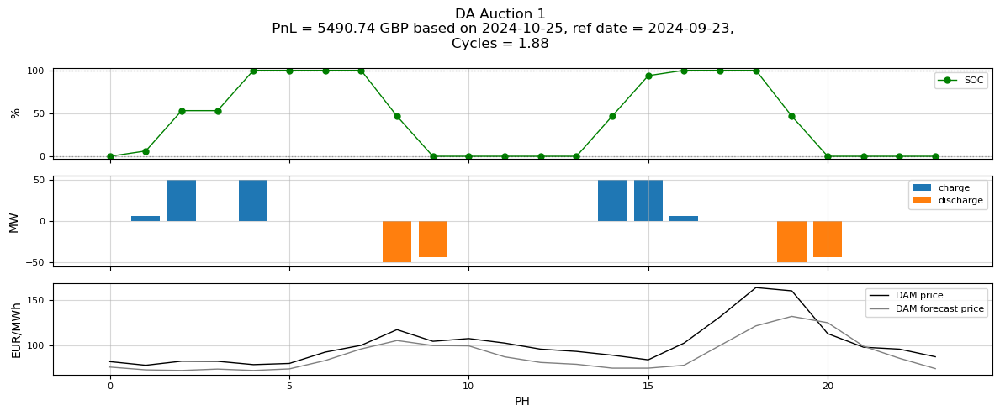

      del_date    ref_date   pnl_da
85  2024-10-25  2024-09-23  5490.74


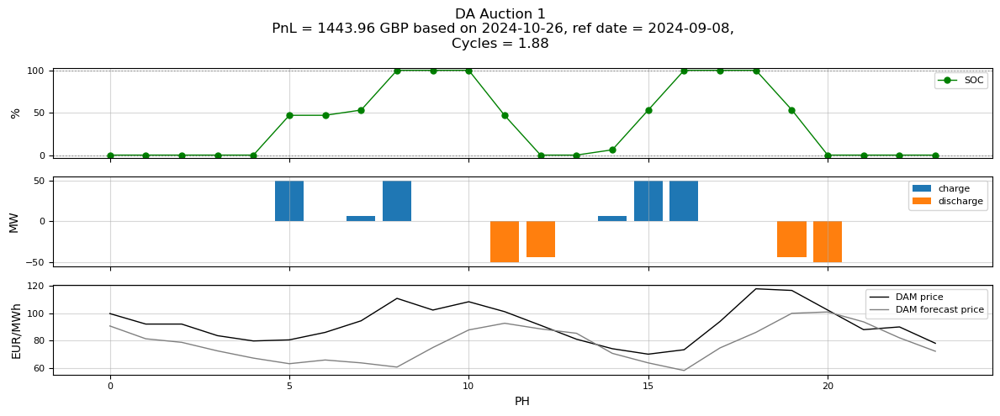

      del_date    ref_date   pnl_da
86  2024-10-26  2024-09-08  1443.96


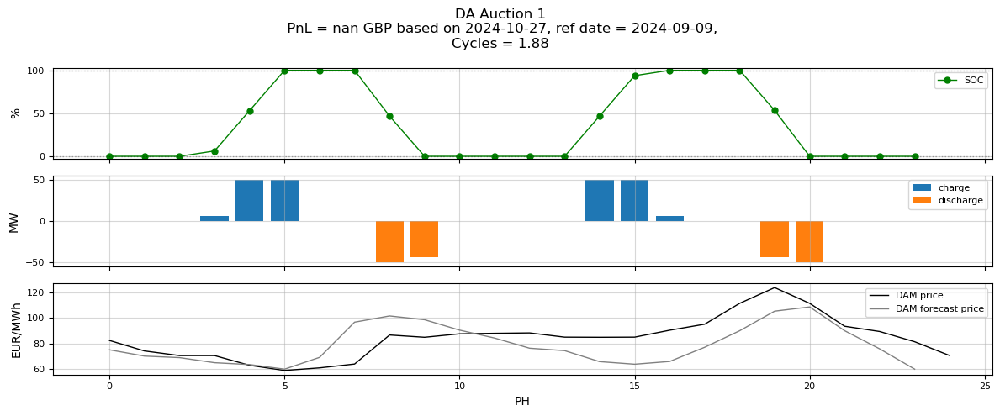

      del_date    ref_date  pnl_da
87  2024-10-27  2024-09-09     NaN


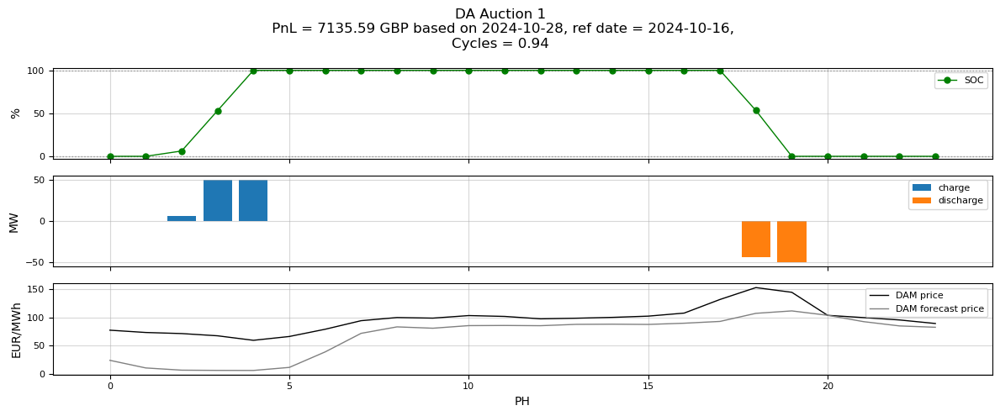

      del_date    ref_date   pnl_da
88  2024-10-28  2024-10-16  7135.59


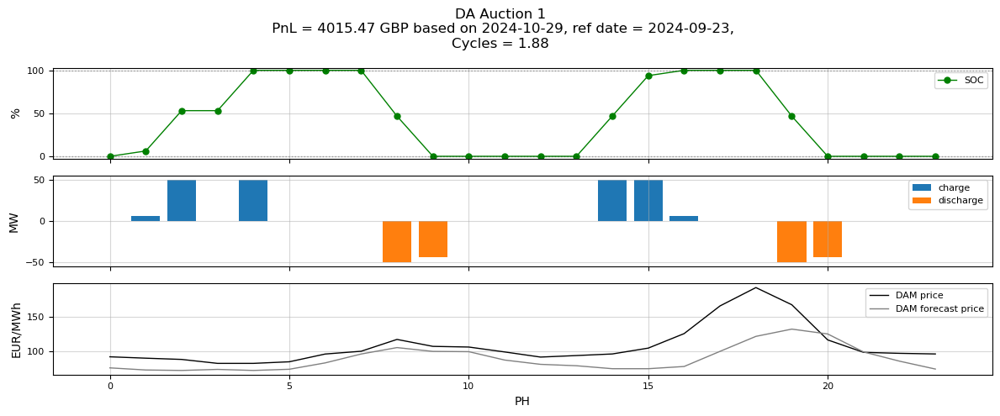

      del_date    ref_date   pnl_da
89  2024-10-29  2024-09-23  4015.47


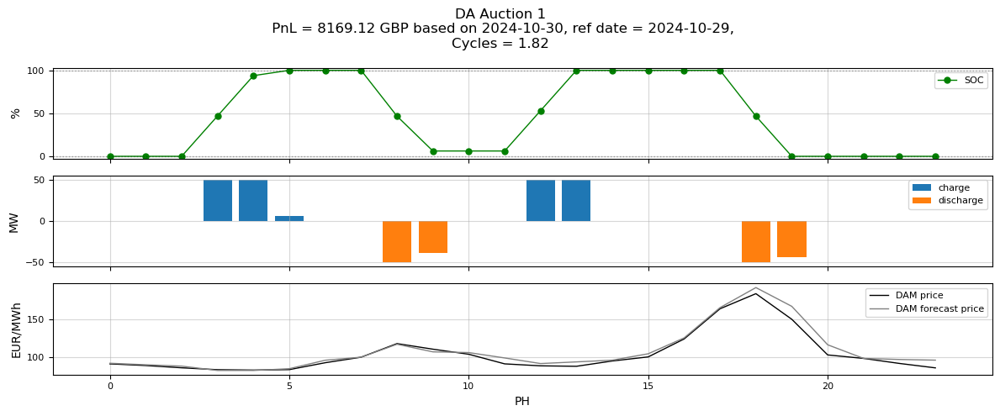

      del_date    ref_date   pnl_da
90  2024-10-30  2024-10-29  8169.12


In [130]:
daily_log_refModel1 = pd.DataFrame()    # daily logs
hourly_log_refModel1 = pd.DataFrame()   # hourly logs

for del_date in dates[:]:

    ref_date = ref_day_data[ref_day_data.date == del_date].closest_reference_day.iloc[0]

    # actuals, for price settlements
    del_da_data = da_data[da_data.date == del_date].reset_index(drop=True)
    
    # forecast for scheduling
    ref_da_data = da_data[da_data.date == ref_date].reset_index(drop=True)
    
    DAM_run = bess_object_dam.solving(
        dam_actual=del_da_data.da_price,  # for settlements
        dam_fc=ref_da_data.da_price,   # for scheduling
        plot=show_daily_plots,  # toggle plotting here
        title_text1="DA Auction 1",
        title_text2=f"{del_date}, ref date = {ref_date}",
    )
    DAM_run["dtutc"] = del_da_data.dtutc
    DAM_run["da_actual"] = del_da_data.da_price
    eod_soc = DAM_run.soc_end.iloc[-1]

    # logging
    hourly_log_refModel1 = pd.concat(
        [
            hourly_log_refModel1,
            DAM_run[
                ["net", "soc_start", "soc_end", "dtutc", "da_actual"]
            ],
        ],
        ignore_index=True,
    )
    daily_log_refModel1 = pd.concat(
        [
            daily_log_refModel1,
            pd.DataFrame(
                [
                    {
                        "del_date": del_date,
                        "ref_date": ref_date,
                        "pnl_da": bess_object_dam.pnl,
                    }
                ]
            ),
        ],
        ignore_index=True,
    )

    bess_object_dam.init_soc = eod_soc
    print(daily_log_refModel1.tail(1))

In [131]:
daily_log_refModel1[pd.isna(daily_log_refModel1.pnl_da)]

,del_date,ref_date,pnl_da
87,2024-10-27,2024-09-09,NaN


In [132]:
daily_log_refModel1['pnl_da'] = daily_log_refModel1['pnl_da'].fillna(method='ffill')

In [133]:
daily_log_foresight[pd.isna(daily_log_foresight.pnl_da)]

,del_date,ref_date,pnl_da


In [134]:
print(daily_log_refModel1[pd.isna(daily_log_refModel1.pnl_da)])

Empty DataFrame
Columns: [del_date, ref_date, pnl_da]
Index: []


In [135]:
compare_df = daily_log_refModel1[['del_date', 'ref_date', 'pnl_da']].rename(columns = {"pnl_da": "pnl_da_ref"})
compare_df = compare_df.dropna(subset=['pnl_da_ref']).reset_index(drop=True)
compare_df

,del_date,ref_date,pnl_da_ref
0,2024-08-01,2024-06-25,2984.35
1,2024-08-02,2024-06-21,3603.40
2,2024-08-03,2024-07-18,296.30
3,2024-08-04,2024-06-14,2659.25
4,2024-08-05,2024-07-10,6504.76
...,...,...,...
86,2024-10-26,2024-09-08,1443.96
87,2024-10-27,2024-09-09,1443.96
88,2024-10-28,2024-10-16,7135.59
89,2024-10-29,2024-09-23,4015.47


In [136]:
compare_df = compare_df.merge(daily_log_foresight[['del_date', 'pnl_da']], on = 'del_date', how = "left").rename(columns = {"pnl_da": "pnl_da_foresight"})

In [137]:
compare_df[['pnl_da_ref', 'pnl_da_foresight']].sum()

pnl_da_ref          467326.81
pnl_da_foresight    625858.17
dtype: float64

In [138]:

455253.82/625597.15 * 100 

72.77108279665276

In [ ]:
def get_sim(ref_day_table):
    
    dates = ref_day_table.date.unique()
    # initiate class object, once at the start of the simulation

    # initiate class object
    bess_object_dam = day_ahead(
        size=SIZE,
        power_up=POWER_UP,
        power_down=POWER_DOWN,
        timestep=1,
        charge_eff=CHARGE_EFFICIENCY,
        discharge_eff=DISCHARGE_EFFICIENCY,
        manual_soc_max=MANUAL_SOC_MAX,
        manual_soc_min=MANUAL_SOC_MIN,
        init_soc=INIT_SOC,
        end_soc=END_SOC,
        end_soc_limit_type=end_soc_limit_type,
        daily_cycle_max=MAX_THROUGHPUT_CYCLES,
        throughput_size=THROUGHPUT_SIZE,
        solution_time_limit=SOLUTION_TIME_LIMIT_SEC,
        integer_solution=INTEGER_PN,
    )

    daily_log = pd.DataFrame()

    for del_date in dates[:]:

        ref_date = ref_day_table[ref_day_table.date == del_date].closest_reference_day.iloc[0]

        # actuals, for price settlements
        del_da_data = da_data[da_data.date == del_date].reset_index(drop=True)
        
        # forecast for scheduling
        ref_da_data = da_data[da_data.date == ref_date].reset_index(drop=True)
        
        DAM_run = bess_object_dam.solving(
            dam_actual=del_da_data.da_price,  # for settlements
            dam_fc=ref_da_data.da_price,   # for scheduling
            plot=False,  # toggle plotting here
            title_text1="DA Auction 1",
            title_text2=f"{del_date}, ref date = {ref_date}",
        )
        
        eod_soc = DAM_run.soc_end.iloc[-1]

        # logging
        daily_log = pd.concat(
            [
                daily_log,
                pd.DataFrame(
                    [
                        {
                            "del_date": del_date,
                            "ref_date": ref_date,
                            "pnl_da": bess_object_dam.pnl,
                        }
                    ]
                ),
            ],
            ignore_index=True,
        )

        bess_object_dam.init_soc = eod_soc
        print(daily_log.tail(1))

    return daily_log

    

### discharge - end up losing more
### charge - end up gaining less

discharge_eff = 0.8
charge_eff = 0.8

dicharge with 10MW for 1 hr:
I will Lose: 10 * 1 * (1/0.8) = -12.5 MWh

Charge with 10MW for 1 hr:
I will gain: 10 * 1 * (0.8) = 8 MWh


In [5]:
# import pandas as pd


# cosine_df = pd.read_csv("../src/data/processed/reference_days_cosine_table.csv", parse_dates=["date"])
# actual_prices = pd.read_csv("../src/data/processed/gb_epex_da_actuals.csv", parse_dates=["date", "dtutc", "dtcet"])


# cosine_df["closest_reference_day"] = cosine_df["closest_reference_days"].apply(
#     lambda x: eval(x, {"Timestamp": pd.Timestamp})[0] if isinstance(x, str) else None
# )


# daily_actual_revenue = actual_prices.groupby("date")["da_price"].sum().reset_index()
# daily_actual_revenue.columns = ["del_date", "pnl_da_foresight"]


# cosine_df = cosine_df.merge(
#     daily_actual_revenue,
#     left_on="closest_reference_day",
#     right_on="del_date",
#     how="left"
# ).rename(columns={"pnl_da_foresight": "pnl_da_ref"})


# compare_df = cosine_df.merge(
#     daily_actual_revenue,
#     left_on="date",
#     right_on="del_date",
#     how="left"
# ).rename(columns={"pnl_da_foresight": "pnl_da_foresight"})


# total_ref_revenue = compare_df["pnl_da_ref"].sum()
# total_foresight_revenue = compare_df["pnl_da_foresight"].sum()
# perfect_foresight_ratio = (total_ref_revenue / total_foresight_revenue) * 100

# print(f"Perfect Foresight Ratio (Cosine): {perfect_foresight_ratio:.2f}%")


Perfect Foresight Ratio (Cosine): 96.83%


In [140]:
import pandas as pd

# Load reference days and actual DA prices
ref_df = pd.read_csv("../src/data/processed/reference_days.csv", parse_dates=["date"])
actual_prices = pd.read_csv("../src/data/processed/gb_epex_da_actuals.csv", parse_dates=["date", "dtutc", "dtcet"])

# Parse 'closest_reference_days' to extract the first reference day
def parse_closest_reference_days(row):
    try:
        # Use regex to extract all dates from the string
        import re
        date_matches = re.findall(r"Timestamp\('([^']+)'\)", row)
        # Return the first date if available
        return pd.to_datetime(date_matches[0]) if len(date_matches) > 0 else None
    except Exception as e:
        print(f"Error parsing row: {row}, Error: {e}")
        return None

ref_df["closest_reference_day"] = ref_df["closest_reference_days"].apply(parse_closest_reference_days)

# Ensure both 'closest_reference_day' and 'del_date' are datetime64[ns]
ref_df["closest_reference_day"] = pd.to_datetime(ref_df["closest_reference_day"])
daily_actual_revenue = actual_prices.groupby("date")["da_price"].sum().reset_index()
daily_actual_revenue.columns = ["del_date", "pnl_da_foresight"]
daily_actual_revenue["del_date"] = pd.to_datetime(daily_actual_revenue["del_date"])

# Merge reference day revenues into ref_df
ref_df = ref_df.merge(
    daily_actual_revenue,
    left_on="closest_reference_day",
    right_on="del_date",
    how="left"
).rename(columns={"pnl_da_foresight": "pnl_da_ref"})

# Merge actual delivery day revenues into ref_df
compare_df = ref_df.merge(
    daily_actual_revenue,
    left_on="date",
    right_on="del_date",
    how="left"
).rename(columns={"pnl_da_foresight": "pnl_da_foresight"})

# Handle missing values in 'pnl_da_ref' using forward fill (ffill)
compare_df["pnl_da_ref"] = compare_df["pnl_da_ref"].fillna(method="ffill")

# Calculate total revenues for reference and delivery days
total_ref_revenue = compare_df["pnl_da_ref"].sum()
total_foresight_revenue = compare_df["pnl_da_foresight"].sum()

# Calculate perfect foresight ratio
perfect_foresight_ratio = (total_ref_revenue / total_foresight_revenue) * 100

# Print results
print(f"Perfect Foresight Ratio: {perfect_foresight_ratio:.2f}%")


Perfect Foresight Ratio: 91.95%
